# Week 6 - Bivariate Analysis, part 2

# 1. Lesson: no lesson this week

# 2. Weekly graph question

## Question 
Suppose you wanted to show the nitrate and phosphate level in a water sample.  What are the advantages and disadvantages of showing this as an area plot, as opposed to two separate line graphs?  How would you adjust the graphs shown to improve the presentation?

In [136]:
import numpy as np
import seaborn as sns
import pandas as pd

import kagglehub 
import matplotlib.pyplot as plt 

from scipy.stats import pointbiserialr, chi2_contingency

%matplotlib inline

from kagglehub              import KaggleDatasetAdapter
from datetime               import datetime, timedelta
from ydata_profiling        import ProfileReport
from ydata_profiling.config import Settings

# custom settings object
custom_settings = Settings()

sns.set(font_scale=0.8) 
# plt.rcParams['figure.figsize'] = (8, 4)
plt.rcParams['axes.titlesize']  = 10
plt.rcParams['axes.labelsize']  = 8
plt.rcParams['lines.linewidth'] = 0.5
# plt.rcParams['lines.markersize'] = 3
plt.rcParams['axes.edgecolor']  = 'gray'
plt.rcParams['xtick.color']     = 'gray'
plt.rcParams['ytick.color'] = 'gray'
plt.rcParams['xtick.color'] = 'gray'
plt.rcParams['ytick.color'] = 'gray'
plt.rcParams['ytick.labelsize'] = 8
plt.rcParams['xtick.labelsize'] = 8

Text(0, 0.5, 'Nitrate level (% of eutrophic value)')

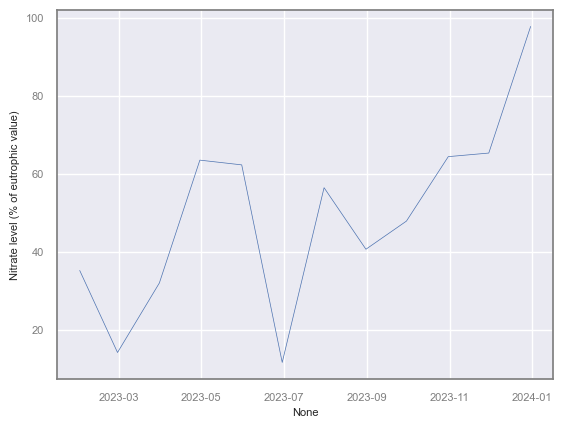

In [137]:
numdates    = 12
np.random.seed(0)
time_series = 100 * (np.random.normal(size = numdates) / 5 + np.arange(numdates) / 16)
datearray   = pd.date_range(start = '2023/01/01', end = '2024/01/01', freq = 'ME')
ax          = sns.lineplot(x = datearray, y = time_series)
# ax.set_xlabel("Year and month")
ax.set_ylabel("Nitrate level (% of eutrophic value)")

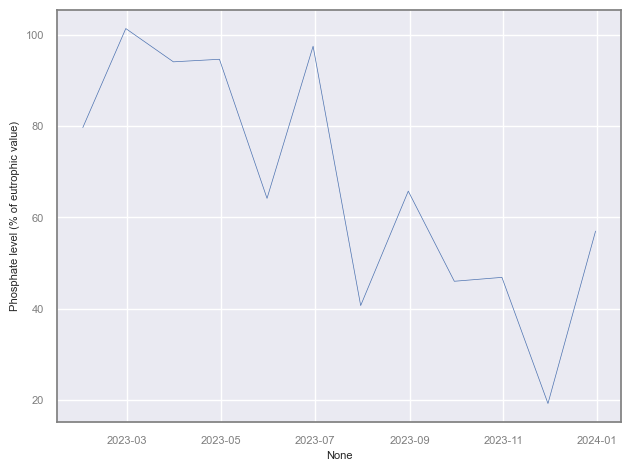

In [138]:
np.random.seed(1)
time_series_2   =  100 * (1 - (np.random.normal(size = numdates) / 8 + np.arange(numdates) / 16))
datearray       = pd.date_range(start = '2023/01/01', end = '2024/01/01', freq = 'ME')
ax              = sns.lineplot(x = datearray, y = time_series_2)
# ax.set_xlabel("Year and month")
ax.set_ylabel("Phosphate level (% of eutrophic value)")
plt.tight_layout()
# time_series_2

<Axes: >

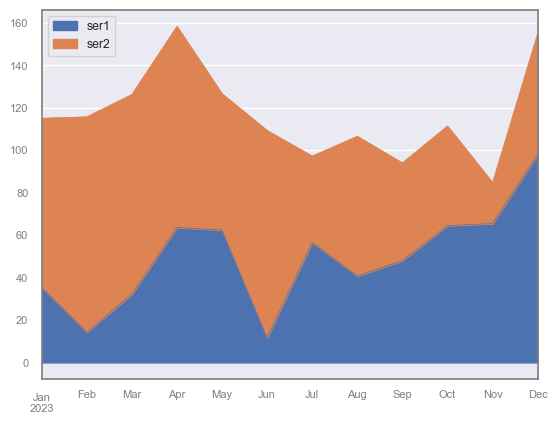

In [139]:
df = pd.DataFrame({'ser1': time_series, 'ser2': time_series_2}, index = datearray)
df.plot.area()

## <font color='plum'> ANSWER

 ### <font color='plum'> Advantages of Area Plot
- **Visual Impact**: Emphasizes the **total nutrient load** over time.
- **Compact**: Combines both variables into a single graph, saving space.
- **Cumulative Insight**: Useful when the **sum** of values is meaningful (e.g., total eutrophication risk).


###  Disadvantages of Area Plot
- **Overlapping Confusion**: It's harder to distinguish individual trends, especially if one dominates.
- **Less Precision**: You can't easily read exact values for each variable.
- **Color Dependency**: Interpretation relies heavily on color distinction.

### Suggestions to Improve Presentation
- **Use a dual-axis line plot** to show both trends clearly but on different scales.
- **Add annotations or markers** to highlight key events or thresholds.
- **Normalize or standardize** the values if their scales differ significantly.
<!-- - **Interactive plots** (e.g., with tooltips) can help in digital presentations. -->

# 3. Working on your datasets

This week, you will do the same types of exercises as last week, but you should use your chosen datasets that someone in your class found last semester. (They likely will not be the particular datasets that you found yourself.)

## Here are some types of analysis you can do:

- Find `correlations` between pairs of variables.

- Draw `scatterplots`, especially when the correlation is large.

- Draw `pairplots`.

- Draw `line graphs` and/or `area graphs` when there is date or time data together with numerical data.

## Conclusions:

- Explain what conclusions you would draw from this analysis: are the data what you expect?  Are the data likely to be usable?  If the data are not useable, find some new data!

- Do you see any outliers?  (Data points that are far from the rest of the data).

- Are any data items highly correlated with each other, suggesting that they are redundant?

- For the line plots, do you see a trend or pattern over time?  Does this suggest that the data are changing over time (drifting) in such a way as to invalidate comparisons?

- Can you think of any confounding variables?  (Third variables that could explain any correlations between other variables.  These third variables may or may not be reported in the dataset.)

## <font color='plum'>My functions

### get_correl_matrix

In [140]:
def get_correl_matrix(df, dataset_name = None, colormap = 'coolwarm', data_labels = True, method = 'pearson'):
    corr_matrix = df.corr()

    # Create mask for upper triangle
    mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

    # Plot heatmap
    plt.figure(figsize=(14, 10))
    # annotation_kwargs = {"size": 8} # You can adjust this number
    sns.set(font_scale=0.8)  # Adjust font size for better readability
    sns.heatmap(corr_matrix, annot = data_labels, fmt=".2f", cmap = colormap, linewidths = .5, square=True, mask=mask, cbar_kws={"shrink": .8})
    plt.title(f'Correlation Matrix' + (f' for {dataset_name}' if dataset_name else ''), fontsize=12)
    plt.show()
    # return df.corr(method = method)

### plot_numeric

In [141]:
def plot_numeric(data, feature, hue=None):
    """
    Generates a comprehensive set of plots for a numerical feature,
    with an option to segment by a categorical 'hue' feature.

    Args:
        data (pd.DataFrame): The dataframe containing the data.
        feature (str): The name of the numerical column to analyze.
        hue (str, optional): The name of the categorical column for color-encoding. Defaults to None.
    """
    fig, axes = plt.subplots(2, 2, figsize=(12, 6))
    fig.suptitle(f'Analysis of {feature}', fontsize=14)

    # Define common color arguments based on whether hue is provided
    color_args = {'palette': 'viridis'} if hue else {'color': "#9256A1"}
    
    # --- Create Plots using argument unpacking ---
    
    # Histogram
    sns.histplot(data=data, x=feature, hue=hue, kde=True, ax=axes[0, 0], bins=30, **color_args)
    axes[0, 0].set_title(f'Histogram of {feature}')

    # KDE Plot
    sns.kdeplot(data=data, x=feature, hue=hue, ax=axes[0, 1], **color_args)
    axes[0, 1].set_title(f'KDE Plot of {feature}')

    # Define specific arguments for box and violin plots
    box_violin_args = {'data': data, 'x': feature, 'orient': 'h'}
    if hue:
        box_violin_args['y'] = hue

# Box Plot
    if hue:
        sns.boxplot(ax=axes[1, 0], hue=hue, legend=False, **box_violin_args, **color_args)
    else:
        sns.boxplot(ax=axes[1, 0], **box_violin_args, **color_args)
    axes[1, 0].set_title(f'Box Plot of {feature}')

# Violin Plot
    if hue:
        sns.violinplot(ax=axes[1, 1], hue=hue, legend=False, **box_violin_args, **color_args)
    else:
        sns.violinplot(ax=axes[1, 1], **box_violin_args, **color_args)
    axes[1, 1].set_title(f'Violin Plot of {feature}')


    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

    # --- Statistics ---
    stats = data[feature].describe()
    modes = data[feature].mode()
    
    stats_dict = {
        'Mean': stats['mean'],
        'Median': stats['50%'],
        'Mode': ', '.join(map(str, modes.values)) if len(modes) > 1 else modes[0],
        'Min': stats['min'],
        'Max': stats['max'],
        'Range': stats['max'] - stats['min'],
        'IQR': stats['75%'] - stats['25%'],
        'Skewness': data[feature].skew(),
        'Kurtosis': data[feature].kurtosis()
    }
    
    stats_df = pd.DataFrame(stats_dict, index=[feature]).T
    # print(f"\nDescriptive Stats for {feature}:")
    print(stats_df.round(3))


### plot_categorical

In [142]:
def plot_categorical(data, feature, hue=None):
    """
    Generates a count plot and a horizontal bar plot for a categorical feature,
    with an option to segment by a categorical 'hue' feature.

    Args:
        data (pd.DataFrame): The dataframe containing the data.
        feature (str): The name of the categorical column to analyze.
        hue (str, optional): The name of the categorical column for color-encoding. Defaults to None.
    """
    fig, axes = plt.subplots(1, 2, figsize=(15, 4))
    fig.suptitle(f'{feature}', fontsize=14)

    # Count Plot
    ax1 = sns.countplot(x=feature, data=data, hue=hue, ax=axes[0], palette="viridis")
    axes[0].set_title(f'Count Plot of {feature}')
    axes[0].tick_params(axis='x', rotation=45)

    # Add count labels
    # for p in ax1.patches:
    #     ax1.annotate(f'{p.get_height():.0f}',
    #                  (p.get_x() + p.get_width() / 2., p.get_height()),
    #                  ha='center', va='center',
    #                  xytext=(0, 5),
    #                  textcoords='offset points')

    # Horizontal Bar Chart (Percentage)
    value_counts = data[feature].value_counts(normalize=True).mul(100).sort_values()

    # Using a single dark color from the start of the viridis palette for consistency and readability
    ax2 = sns.barplot(x=value_counts.values, y=value_counts.index, orient='h', ax=axes[1], color="#440154")
    axes[1].set_title(f'% Distribution of {feature}')
    # axes[1].set_xlabel('Percentage (%)')
    
    # Add percentage labels
    for index, value in enumerate(value_counts):
        ax2.text(value, index, f'{value:.1f}%', color='white', ha='right', va='center')


    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

    print(f"\nValue counts for {feature}:")
    print(data[feature].value_counts(normalize=True).mul(100).round(2).astype(str) + '%')


### create_pairplot

In [143]:
def create_pairplot(dataframe, features, hue, dataset_title, sample_size=5000, palette='viridis'):
    """
    Generates and displays Seaborn pair plot for subset of features from a dataframe.

    Args:
        dataframe (pd.DataFrame): The dataframe containing the data.
        features (list): A list of column names to include in the plot.
        hue (str): The column name to use for color-encoding the data points.
        sample_size (int, optional): The number of data points to sample for plotting. Defaults to 5000.
        palette (str, optional): The color palette to use for the plot. Defaults to 'viridis'.
    """
    
    print(f"Generating pair plot for features: {', '.join(features)}")
    
    # --- Create the Pair Plot ---
    # A pair plot creates a grid of scatter plots for each pair of features
    # and a histogram for the distribution of each individual feature.
    
    # Use a sample of the data if the dataframe is larger than the sample size
    if len(dataframe) > sample_size:
        plot_data = dataframe.sample(n=sample_size, random_state=42)
    else:
        plot_data = dataframe

    pairplot_fig = sns.pairplot(
        data=plot_data,
        vars=[f for f in features if f != hue], # Plot only the feature columns
        hue=hue,
        palette=palette,
        plot_kws={'alpha': 0.6, 's': 20} # Make points smaller and semi-transparent
    )

    pairplot_fig.fig.suptitle(f'Pair Plot of {dataset_title} Key Indicators by {hue}', y=1.02) # y=1.02 raises title
    plt.show()

### variable_group plot

In [144]:

def plot_variable_group(df, group, title):
    # Filter out missing columns
    valid_columns   = [col for col in group if col in df.columns]
    missing_columns = [col for col in group if col not in df.columns]

    if missing_columns:
        print(f"Warning: The following columns are missing and will be skipped: {missing_columns}")

    # Plotting
    num_plots = len(valid_columns)
    cols = 3
    rows = (num_plots + cols - 1) // cols
    plt.figure(figsize=(5 * cols, 4 * rows))
    for i, col in enumerate(valid_columns, 1):
        plt.subplot(rows, cols, i)
        if pd.api.types.is_numeric_dtype(df[col]):
            sns.histplot(df[col].dropna(), kde=True)
        else:
            df[col].value_counts().plot(kind='bar')
        plt.title(col)
        plt.tight_layout()
    plt.suptitle(title, fontsize=10, y=1.02)
    plt.tight_layout()  # Adjust layout to make room for the title
    plt.show()

# Example usage with demographics
# demographics = ["Age", "Gender", "Ethnicity", "SocioeconomicStatus", "EducationLevel"]
# plot_variable_group(df, demographics, "Demographics")




## <font color='plum'> 3.a. Diabetes Health Indicators Dataset
Over 250,000 responses from a U.S. national health survey with demographic and lifestyle variables (e.g., BMI, activity level, smoking, sleep, general health).

Designed for predicting diabetes status (none, pre-diabetic, diabetic).
https://www.kaggle.com/datasets/alexteboul/diabetes-health-indicators-dataset

### Load

In [145]:
file_path = "alexteboul/diabetes-health-indicators-dataset"
file_name = "diabetes_binary_5050split_health_indicators_BRFSS2015.csv"

#diabetes_012_health_indicators_BRFSS2015.csv
#diabetes_binary_health_indicators_BRFSS2015.csv

# Load the latest version
df_3a = kagglehub.dataset_load(
  KaggleDatasetAdapter.PANDAS,
  file_path,
  file_name,
)
df_3a.columns = df_3a.columns.str.strip() 
df_3a.head(n = 10)

,Diabetes_binary,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
0,0.0,1.0,0.0,1.0,26.0,0.0,0.0,0.0,1.0,0.0,...,1.0,0.0,3.0,5.0,30.0,0.0,1.0,4.0,6.0,8.0
1,0.0,1.0,1.0,1.0,26.0,1.0,1.0,0.0,0.0,1.0,...,1.0,0.0,3.0,0.0,0.0,0.0,1.0,12.0,6.0,8.0
2,0.0,0.0,0.0,1.0,26.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,1.0,0.0,10.0,0.0,1.0,13.0,6.0,8.0
3,0.0,1.0,1.0,1.0,28.0,1.0,0.0,0.0,1.0,1.0,...,1.0,0.0,3.0,0.0,3.0,0.0,1.0,11.0,6.0,8.0
4,0.0,0.0,0.0,1.0,29.0,1.0,0.0,0.0,1.0,1.0,...,1.0,0.0,2.0,0.0,0.0,0.0,0.0,8.0,5.0,8.0
5,0.0,0.0,0.0,1.0,18.0,0.0,0.0,0.0,1.0,1.0,...,0.0,0.0,2.0,7.0,0.0,0.0,0.0,1.0,4.0,7.0
6,0.0,0.0,1.0,1.0,26.0,1.0,0.0,0.0,1.0,1.0,...,1.0,0.0,1.0,0.0,0.0,0.0,1.0,13.0,5.0,6.0
7,0.0,0.0,0.0,1.0,31.0,1.0,0.0,0.0,0.0,1.0,...,1.0,0.0,4.0,0.0,0.0,0.0,1.0,6.0,4.0,3.0
8,0.0,0.0,0.0,1.0,32.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,3.0,0.0,0.0,0.0,0.0,3.0,6.0,8.0
9,0.0,0.0,0.0,1.0,27.0,1.0,0.0,0.0,0.0,1.0,...,1.0,0.0,3.0,0.0,6.0,0.0,1.0,6.0,4.0,4.0


### Summary

In [146]:
df_3a.describe().T

,count,mean,std,min,25%,50%,75%,max
Diabetes_binary,70692.0,0.500000,0.500004,0.0,0.0,0.5,1.0,1.0
HighBP,70692.0,0.563458,0.495960,0.0,0.0,1.0,1.0,1.0
HighChol,70692.0,0.525703,0.499342,0.0,0.0,1.0,1.0,1.0
CholCheck,70692.0,0.975259,0.155336,0.0,1.0,1.0,1.0,1.0
BMI,70692.0,29.856985,7.113954,12.0,25.0,29.0,33.0,98.0
Smoker,70692.0,0.475273,0.499392,0.0,0.0,0.0,1.0,1.0
Stroke,70692.0,0.062171,0.241468,0.0,0.0,0.0,0.0,1.0
HeartDiseaseorAttack,70692.0,0.147810,0.354914,0.0,0.0,0.0,0.0,1.0
PhysActivity,70692.0,0.703036,0.456924,0.0,0.0,1.0,1.0,1.0
Fruits,70692.0,0.611795,0.487345,0.0,0.0,1.0,1.0,1.0


In [147]:
df_3a.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70692 entries, 0 to 70691
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Diabetes_binary       70692 non-null  float64
 1   HighBP                70692 non-null  float64
 2   HighChol              70692 non-null  float64
 3   CholCheck             70692 non-null  float64
 4   BMI                   70692 non-null  float64
 5   Smoker                70692 non-null  float64
 6   Stroke                70692 non-null  float64
 7   HeartDiseaseorAttack  70692 non-null  float64
 8   PhysActivity          70692 non-null  float64
 9   Fruits                70692 non-null  float64
 10  Veggies               70692 non-null  float64
 11  HvyAlcoholConsump     70692 non-null  float64
 12  AnyHealthcare         70692 non-null  float64
 13  NoDocbcCost           70692 non-null  float64
 14  GenHlth               70692 non-null  float64
 15  MentHlth           

In [148]:
target_col = 'Diabetes_binary'
data = df_3a.drop(columns = [target_col])
numeric_cols = []
categorical_cols = []

for col in df_3a.columns:
    if df_3a[col].nunique() > 2:
        numeric_cols.append(col);
    else:
        categorical_cols.append(col);
    print(f'{col}: {df_3a[col].unique()},\n{df_3a[col].nunique()} unique values\n')

Diabetes_binary: [0. 1.],
2 unique values

HighBP: [1. 0.],
2 unique values

HighChol: [0. 1.],
2 unique values

CholCheck: [1. 0.],
2 unique values

BMI: [26. 28. 29. 18. 31. 32. 27. 24. 21. 58. 30. 20. 22. 38. 40. 25. 36. 47.
 19. 37. 41. 23. 34. 35. 42. 17. 33. 44. 15. 52. 69. 56. 45. 39. 92. 53.
 98. 50. 46. 79. 48. 16. 63. 72. 54. 49. 68. 43. 84. 73. 76. 55. 51. 75.
 57. 60. 12. 77. 82. 67. 71. 61. 14. 81. 59. 86. 13. 87. 65. 95. 89. 62.
 64. 66. 85. 70. 83. 80. 78. 74.],
80 unique values

Smoker: [0. 1.],
2 unique values

Stroke: [0. 1.],
2 unique values

HeartDiseaseorAttack: [0. 1.],
2 unique values

PhysActivity: [1. 0.],
2 unique values

Fruits: [0. 1.],
2 unique values

Veggies: [1. 0.],
2 unique values

HvyAlcoholConsump: [0. 1.],
2 unique values

AnyHealthcare: [1. 0.],
2 unique values

NoDocbcCost: [0. 1.],
2 unique values

GenHlth: [3. 1. 2. 4. 5.],
5 unique values

MentHlth: [ 5.  0.  7.  3.  4.  2. 30. 20.  1. 15. 10. 25. 14. 28.  6. 29. 26. 12.
 16. 22. 13.  8.  9. 21

In [149]:
numeric_cols


['BMI', 'GenHlth', 'MentHlth', 'PhysHlth', 'Age', 'Education', 'Income']

### Correlation & Pair Plots

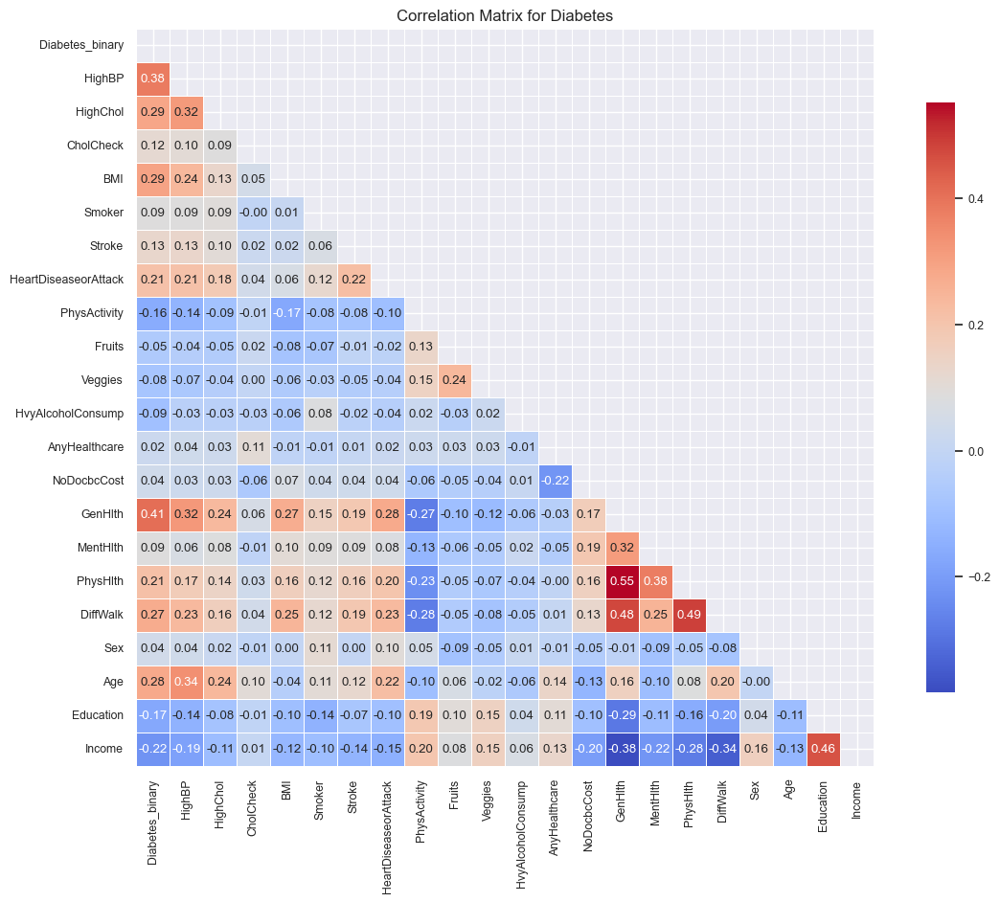

In [150]:
get_correl_matrix(df_3a, 'Diabetes', colormap = 'coolwarm', method = 'pearson')

Generating pair plot for features: GenHlth, PhysHlth, DiffWalk, BMI, HighBP, Income, Diabetes_binary


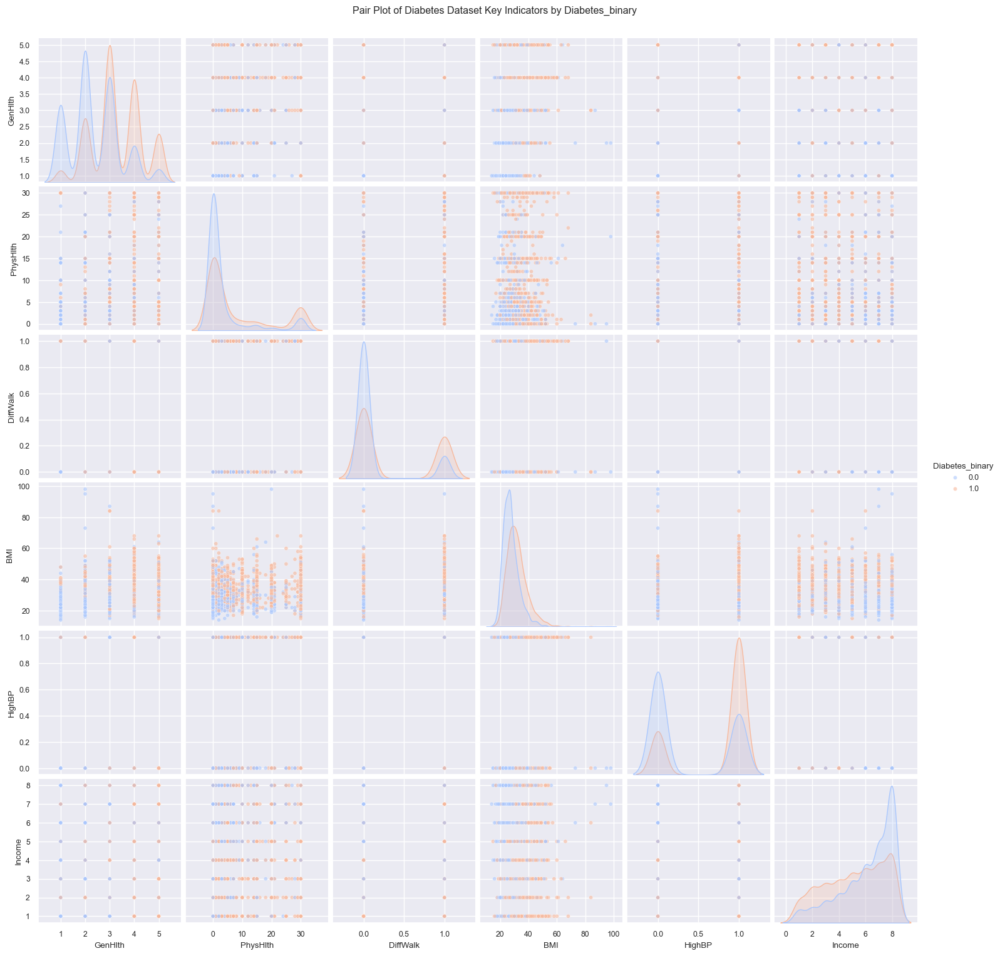

In [151]:
features_to_plot = ['GenHlth', 'PhysHlth', 'DiffWalk', 'BMI', 'HighBP','Income', 'Diabetes_binary']

create_pairplot(df_3a, features_to_plot, hue=target_col, dataset_title='Diabetes Dataset', sample_size=5000, palette='coolwarm')

### Numeric

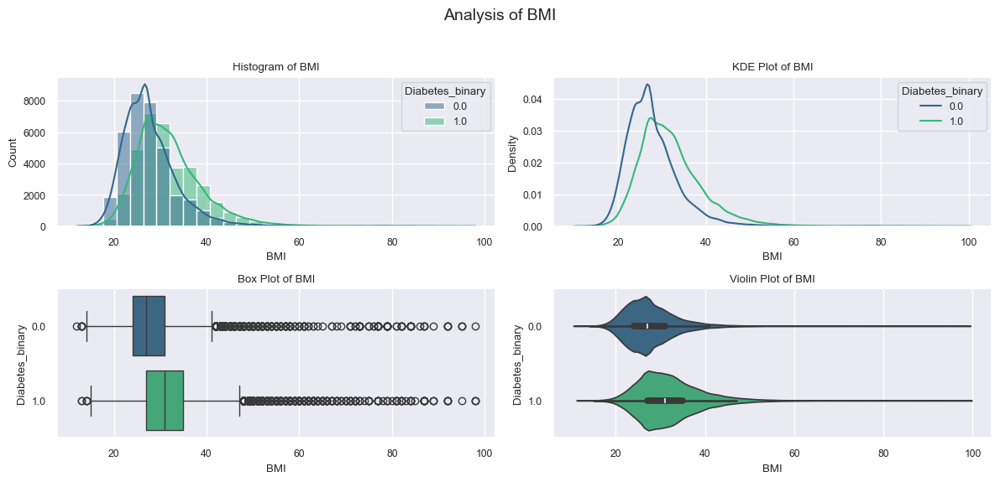

             BMI
Mean      29.857
Median    29.000
Mode      27.000
Min       12.000
Max       98.000
Range     86.000
IQR        8.000
Skewness   1.719
Kurtosis   7.164


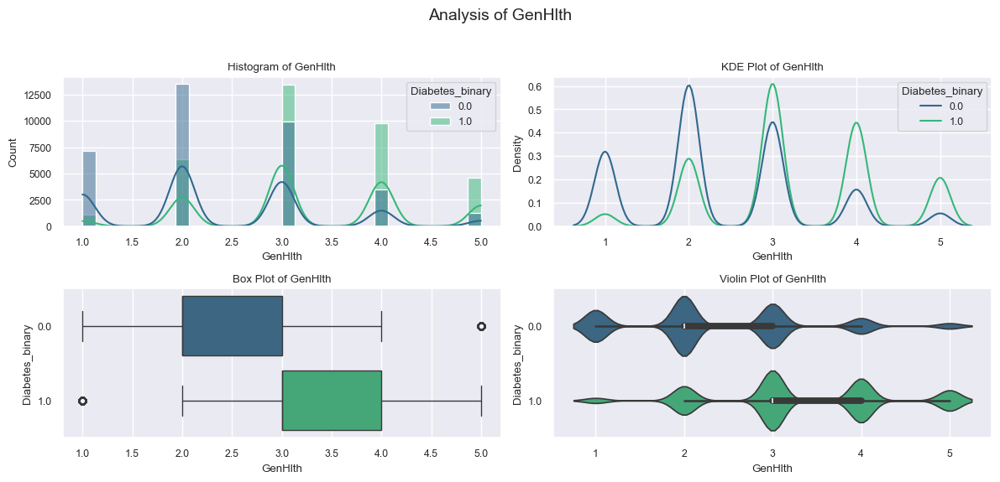

          GenHlth
Mean        2.837
Median      3.000
Mode        3.000
Min         1.000
Max         5.000
Range       4.000
IQR         2.000
Skewness    0.172
Kurtosis   -0.649


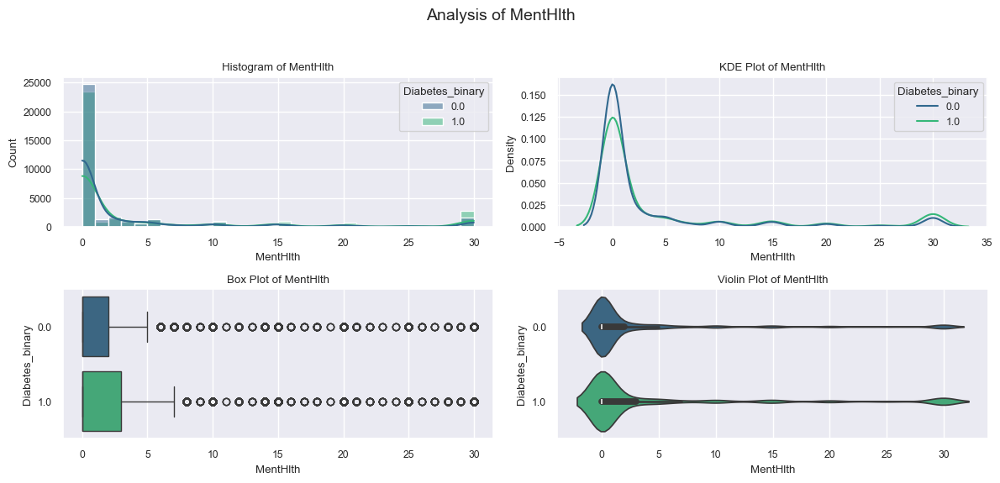

          MentHlth
Mean         3.752
Median       0.000
Mode         0.000
Min          0.000
Max         30.000
Range       30.000
IQR          2.000
Skewness     2.388
Kurtosis     4.492


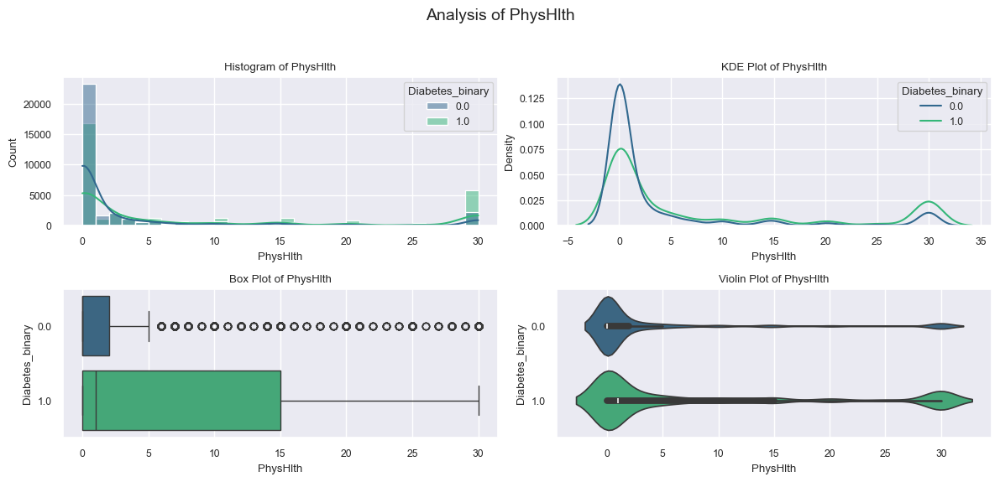

          PhysHlth
Mean         5.810
Median       0.000
Mode         0.000
Min          0.000
Max         30.000
Range       30.000
IQR          6.000
Skewness     1.657
Kurtosis     1.180


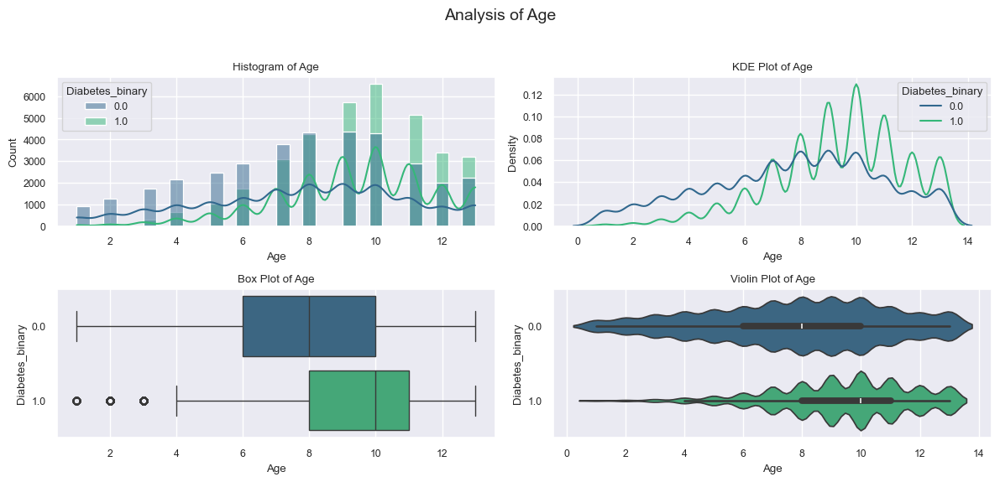

             Age
Mean       8.584
Median     9.000
Mode      10.000
Min        1.000
Max       13.000
Range     12.000
IQR        4.000
Skewness  -0.546
Kurtosis  -0.213


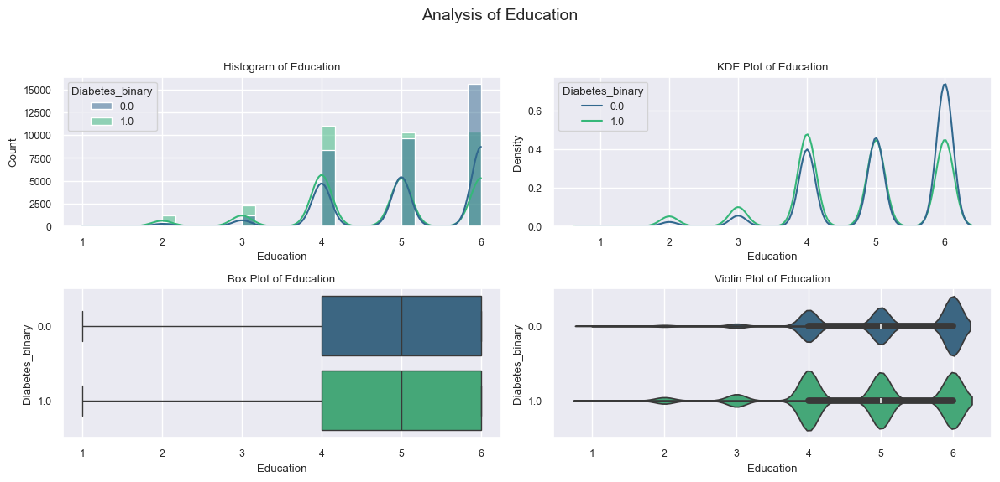

          Education
Mean          4.921
Median        5.000
Mode          6.000
Min           1.000
Max           6.000
Range         5.000
IQR           2.000
Skewness     -0.682
Kurtosis     -0.050


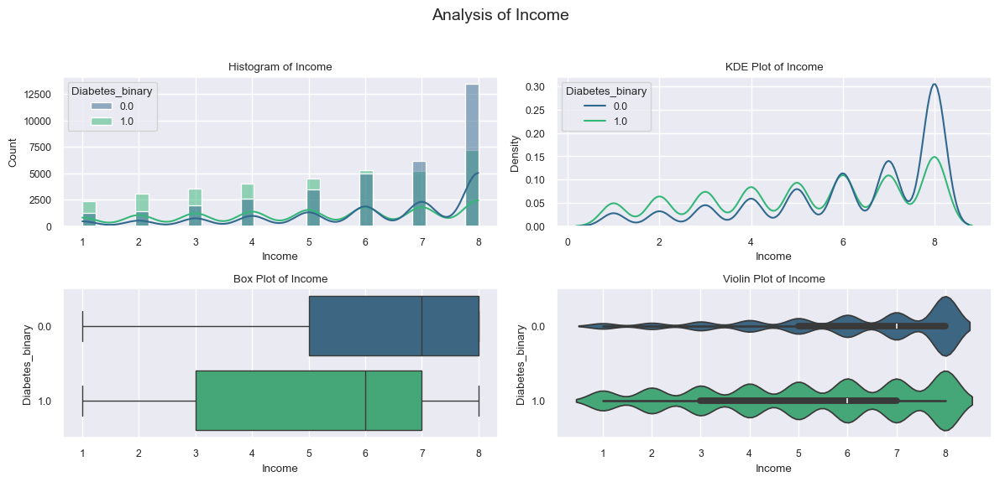

          Income
Mean       5.698
Median     6.000
Mode       8.000
Min        1.000
Max        8.000
Range      7.000
IQR        4.000
Skewness  -0.645
Kurtosis  -0.747


In [152]:
for col in numeric_cols:
    plot_numeric(df_3a, col, hue = target_col)

### Categorical

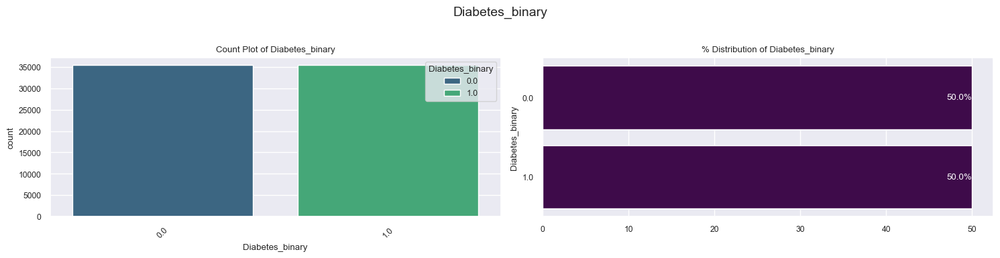


Value counts for Diabetes_binary:
Diabetes_binary
0.0    50.0%
1.0    50.0%
Name: proportion, dtype: object


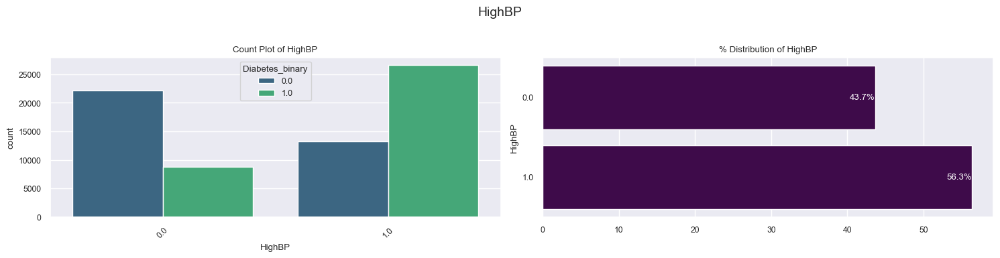


Value counts for HighBP:
HighBP
1.0    56.35%
0.0    43.65%
Name: proportion, dtype: object


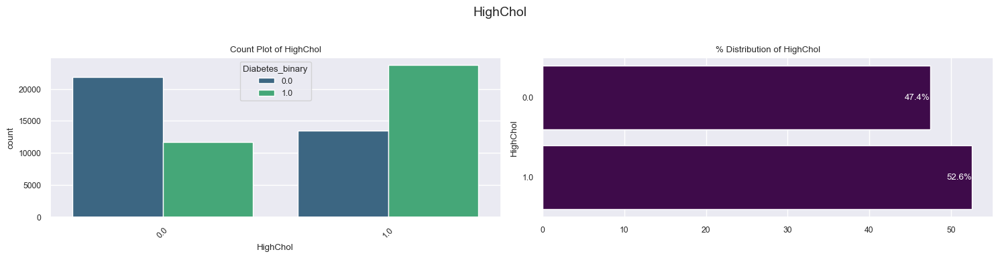


Value counts for HighChol:
HighChol
1.0    52.57%
0.0    47.43%
Name: proportion, dtype: object


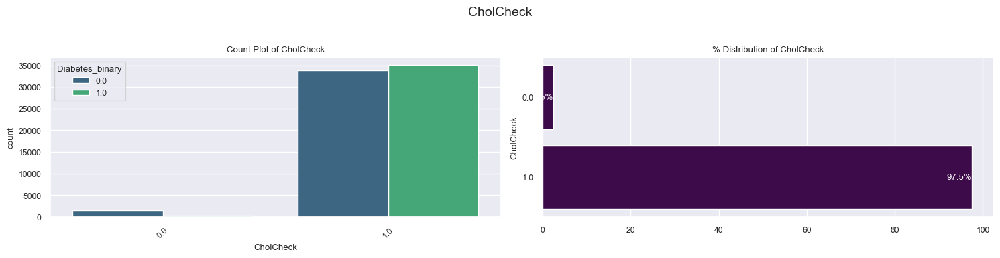


Value counts for CholCheck:
CholCheck
1.0    97.53%
0.0     2.47%
Name: proportion, dtype: object


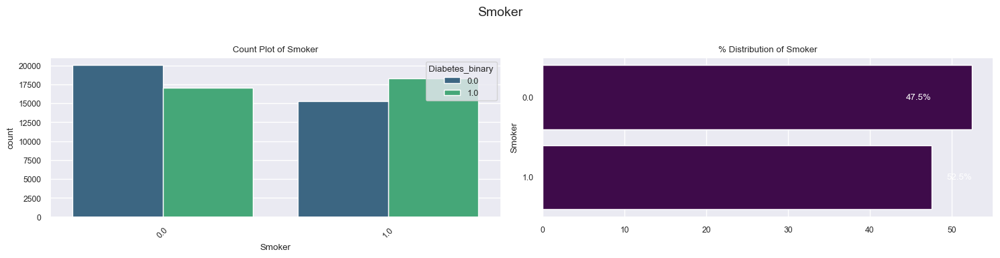


Value counts for Smoker:
Smoker
0.0    52.47%
1.0    47.53%
Name: proportion, dtype: object


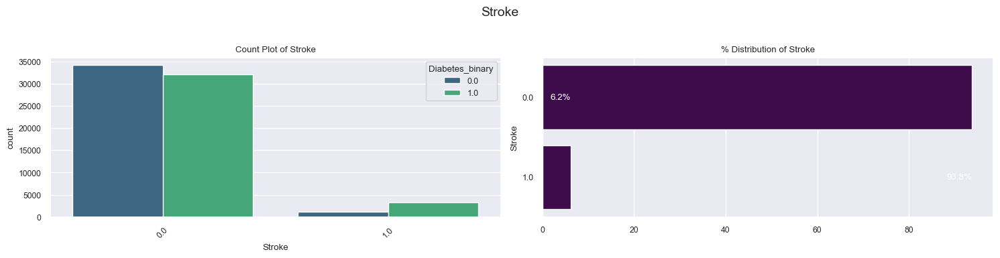


Value counts for Stroke:
Stroke
0.0    93.78%
1.0     6.22%
Name: proportion, dtype: object


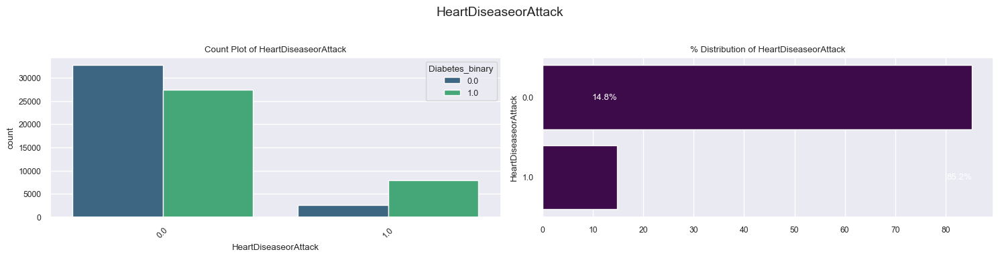


Value counts for HeartDiseaseorAttack:
HeartDiseaseorAttack
0.0    85.22%
1.0    14.78%
Name: proportion, dtype: object


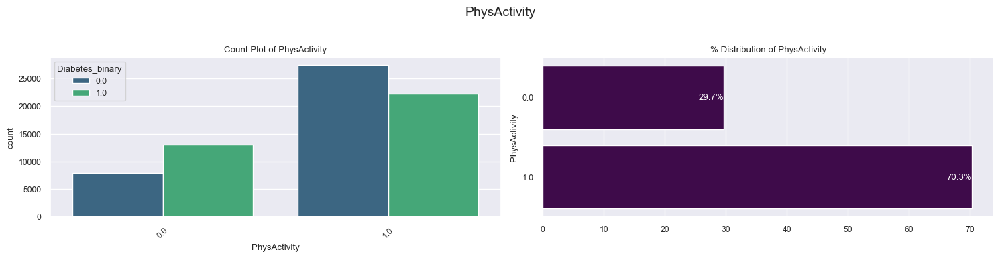


Value counts for PhysActivity:
PhysActivity
1.0    70.3%
0.0    29.7%
Name: proportion, dtype: object


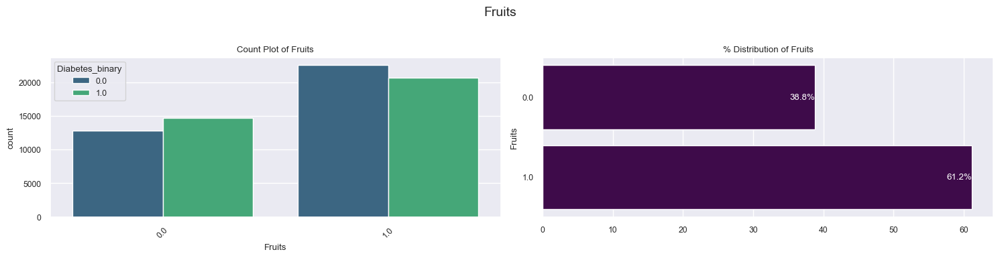


Value counts for Fruits:
Fruits
1.0    61.18%
0.0    38.82%
Name: proportion, dtype: object


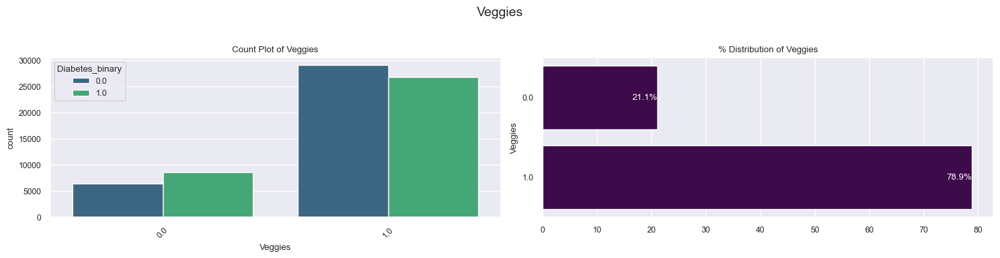


Value counts for Veggies:
Veggies
1.0    78.88%
0.0    21.12%
Name: proportion, dtype: object


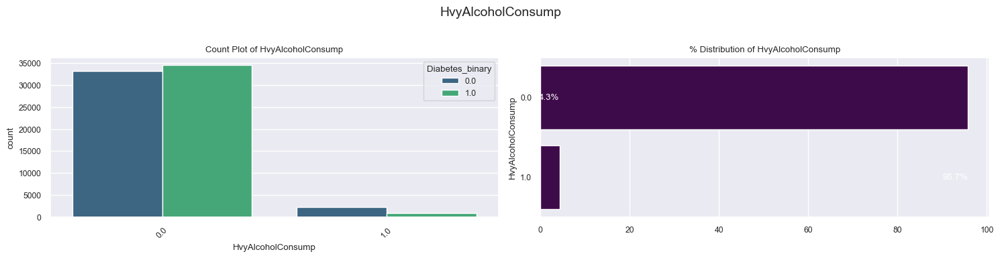


Value counts for HvyAlcoholConsump:
HvyAlcoholConsump
0.0    95.73%
1.0     4.27%
Name: proportion, dtype: object


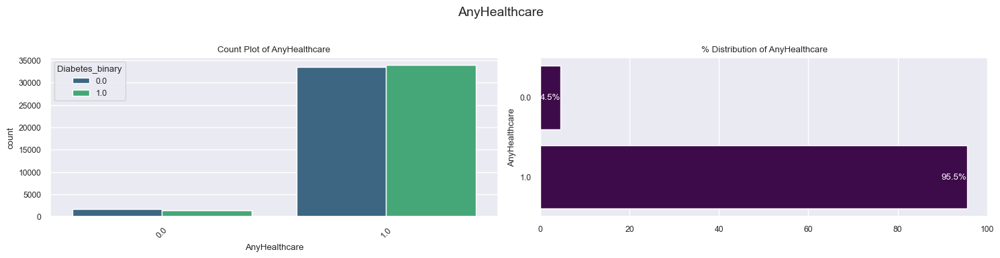


Value counts for AnyHealthcare:
AnyHealthcare
1.0    95.5%
0.0     4.5%
Name: proportion, dtype: object


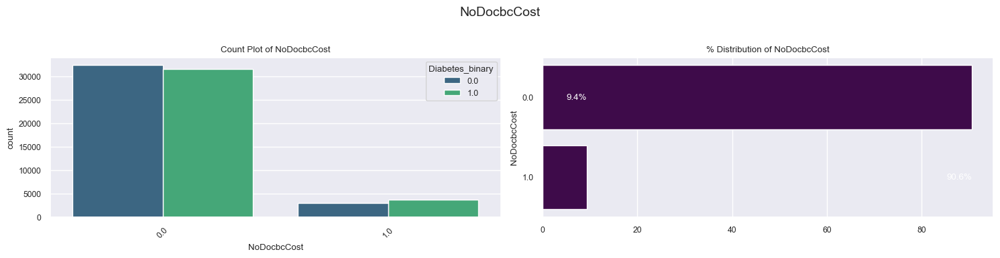


Value counts for NoDocbcCost:
NoDocbcCost
0.0    90.61%
1.0     9.39%
Name: proportion, dtype: object


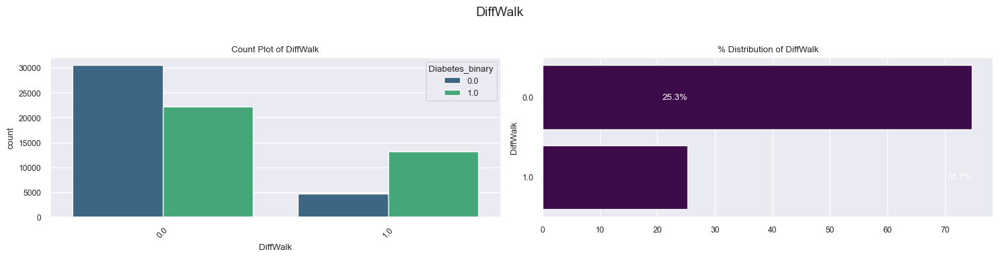


Value counts for DiffWalk:
DiffWalk
0.0    74.73%
1.0    25.27%
Name: proportion, dtype: object


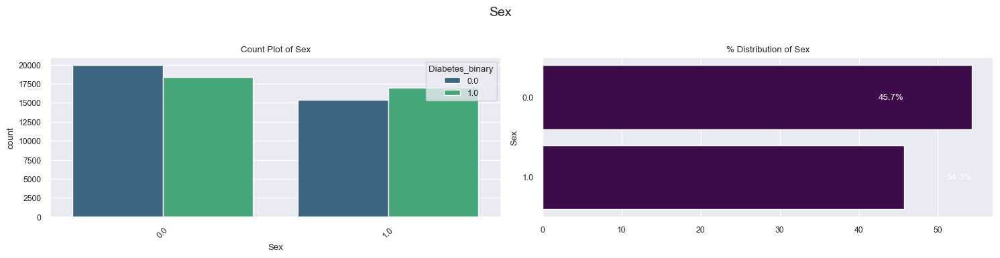


Value counts for Sex:
Sex
0.0    54.3%
1.0    45.7%
Name: proportion, dtype: object


In [153]:
for col in categorical_cols:
    plot_categorical(df_3a, col, hue = target_col)

### Profile

In [154]:
# profile = ProfileReport(
#     df_3a,
#     html    = {'style': {'primary_color': 'firebrick'}},
#     minimal = False,
#     plot    = {"dpi": 100, "image_format": "svg", "tight_layout": True},
# )
# profile

##  <font color='plum'> 3.b. Hypertension Risk Prediction Dataset

Includes lifestyle, demographic, and clinical data (e.g., BMI, cholesterol, stress,
salt intake, smoking, family history) from individuals across multiple countries. It is
labeled for classification tasks (low vs. high risk of hypertension).
https://www.kaggle.com/datasets/ankushpanday1/hypertension-risk-prediction-dataset

### Load

In [155]:

file_path = "ankushpanday1/hypertension-risk-prediction-dataset"
file_name = "hypertension_dataset.csv"

df_3b = kagglehub.dataset_load(
  KaggleDatasetAdapter.PANDAS,
  file_path,
  file_name,
)
df_3b.columns = df_3b.columns.str.strip() 
print(df_3b.shape)
df_3b.head()

(174982, 23)


,Country,Age,BMI,Cholesterol,Systolic_BP,Diastolic_BP,Smoking_Status,Alcohol_Intake,Physical_Activity_Level,Family_History,...,Sleep_Duration,Heart_Rate,LDL,HDL,Triglycerides,Glucose,Gender,Education_Level,Employment_Status,Hypertension
0,UK,58,29.5,230,160,79,Never,27.9,Low,Yes,...,6.1,80,100,75,72,179,Female,Primary,Unemployed,High
1,Spain,34,36.2,201,120,84,Never,27.5,High,Yes,...,9.8,56,77,47,90,113,Male,Secondary,Unemployed,High
2,Indonesia,73,18.2,173,156,60,Current,1.8,High,Yes,...,5.2,75,162,56,81,101,Male,Primary,Employed,Low
3,Canada,60,20.3,183,122,94,Never,11.6,Moderate,Yes,...,7.5,71,164,93,94,199,Female,Secondary,Retired,High
4,France,73,21.8,296,91,97,Never,29.1,Moderate,Yes,...,5.0,52,108,74,226,157,Female,Primary,Employed,High


### Summary

In [156]:
df_3b.describe()

,Age,BMI,Cholesterol,Systolic_BP,Diastolic_BP,Alcohol_Intake,Stress_Level,Salt_Intake,Sleep_Duration,Heart_Rate,LDL,HDL,Triglycerides,Glucose
count,174982.000000,174982.000000,174982.000000,174982.000000,174982.000000,174982.000000,174982.000000,174982.000000,174982.000000,174982.000000,174982.000000,174982.000000,174982.000000,174982.000000
mean,53.493319,27.494672,224.539335,134.505229,89.450315,14.991069,5.013041,8.482757,6.996468,74.495085,129.528271,64.573105,149.569836,134.488187
std,20.786353,7.213866,43.361589,26.019268,17.310789,8.652624,2.582341,3.750074,1.730731,14.438573,34.635795,20.190666,57.765006,37.526882
min,18.000000,15.000000,150.000000,90.000000,60.000000,0.000000,1.000000,2.000000,4.000000,50.000000,70.000000,30.000000,50.000000,70.000000
25%,36.000000,21.200000,187.000000,112.000000,74.000000,7.500000,3.000000,5.200000,5.500000,62.000000,100.000000,47.000000,100.000000,102.000000
50%,54.000000,27.500000,225.000000,135.000000,89.000000,15.000000,5.000000,8.500000,7.000000,74.000000,130.000000,65.000000,150.000000,134.000000
75%,71.000000,33.700000,262.000000,157.000000,104.000000,22.500000,7.000000,11.700000,8.500000,87.000000,160.000000,82.000000,200.000000,167.000000
max,89.000000,40.000000,299.000000,179.000000,119.000000,30.000000,9.000000,15.000000,10.000000,99.000000,189.000000,99.000000,249.000000,199.000000


In [157]:
df_3b.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 174982 entries, 0 to 174981
Data columns (total 23 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   Country                  174982 non-null  object 
 1   Age                      174982 non-null  int64  
 2   BMI                      174982 non-null  float64
 3   Cholesterol              174982 non-null  int64  
 4   Systolic_BP              174982 non-null  int64  
 5   Diastolic_BP             174982 non-null  int64  
 6   Smoking_Status           174982 non-null  object 
 7   Alcohol_Intake           174982 non-null  float64
 8   Physical_Activity_Level  174982 non-null  object 
 9   Family_History           174982 non-null  object 
 10  Diabetes                 174982 non-null  object 
 11  Stress_Level             174982 non-null  int64  
 12  Salt_Intake              174982 non-null  float64
 13  Sleep_Duration           174982 non-null  float64
 14  Hear

In [158]:
target_col = 'Hypertension'
categorical_cols    = ['Country', 'Smoking_Status', 'Physical_Activity_Level', 'Family_History', 'Diabetes', 'Gender', 'Education_Level', 'Employment_Status', 'Hypertension']
numeric_cols        = ['Age', 'BMI', 'Cholesterol', 'Systolic_BP', 'Diastolic_BP', 'Alcohol_Intake', 'Stress_Level', 'Salt_Intake', 'Sleep_Duration', 'Heart_Rate', 'LDL', 'HDL', 'Triglycerides', 'Glucose']
len(categorical_cols), len(numeric_cols)

for col in categorical_cols:
    print(f'{col}: {df_3b[col].unique()},\n{df_3b[col].nunique()} unique values\n')

Country: ['UK' 'Spain' 'Indonesia' 'Canada' 'France' 'South Korea' 'Brazil' 'China'
 'India' 'Italy' 'Germany' 'USA' 'Argentina' 'Australia' 'Saudi Arabia'
 'Russia' 'Japan' 'Turkey' 'Mexico' 'South Africa'],
20 unique values

Smoking_Status: ['Never' 'Current' 'Former'],
3 unique values

Physical_Activity_Level: ['Low' 'High' 'Moderate'],
3 unique values

Family_History: ['Yes' 'No'],
2 unique values

Diabetes: ['Yes' 'No'],
2 unique values

Gender: ['Female' 'Male'],
2 unique values

Education_Level: ['Primary' 'Secondary' 'Tertiary'],
3 unique values

Employment_Status: ['Unemployed' 'Employed' 'Retired'],
3 unique values

Hypertension: ['High' 'Low'],
2 unique values



### Correlation & Pair Plots

In [159]:
# Compute correlations for CKD dataset

# correlations = {}

# # Point-biserial for numerical features
# for col in numeric_cols:
# 	if df_3b[col].isnull().any():
# 		continue
# 	corr, _ = pointbiserialr(df_3b[target_col], df_3b[col])
# 	correlations[col] = abs(corr)

# # Cramér's V for categorical features
# def cramers_v(x, y):
# 	confusion_matrix = pd.crosstab(x, y)
# 	chi2 	= chi2_contingency(confusion_matrix)[0]
# 	n 		= confusion_matrix.sum().sum()
# 	phi2 	= chi2 / n
# 	r, k 	= confusion_matrix.shape
# 	return np.sqrt(phi2 / min(k - 1, r - 1))

# for col in categorical_cols:
# 	try:
# 		correlations[col] = cramers_v(df_3b[col], df_3b[target_col])
# 	except Exception:
# 		continue

# # Sort and get top 15
# sorted_corr = sorted(correlations.items(), key=lambda x: x[1], reverse=True)[:15]
# top_features, top_values = zip(*sorted_corr)

# # Plot
# plt.figure(figsize=(10, 8))
# sns.barplot(x=top_values, y=top_features, hue=top_features, palette="coolwarm", legend=False)
# plt.xlabel(f"Correlation with {target_col}")
# plt.ylabel("Feature")
# plt.title("Top 15 Feature Correlations")
# plt.tight_layout()
# plt.show()

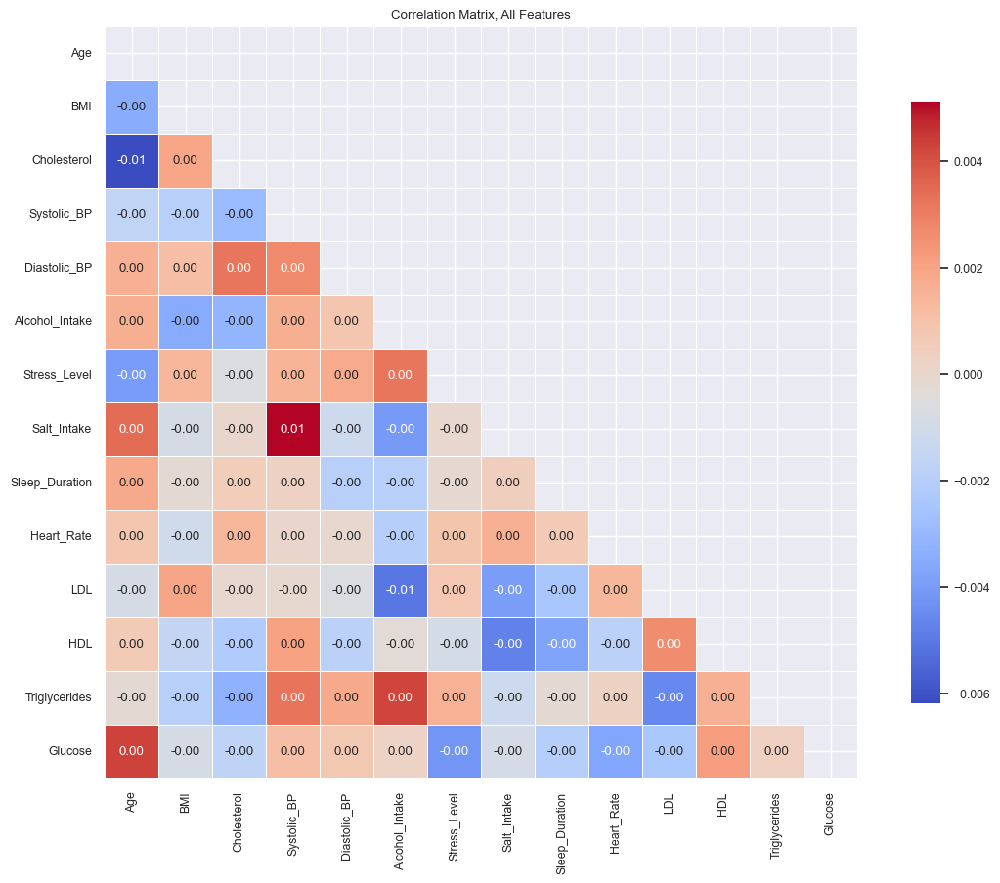

In [160]:
corr_matrix = df_3b[numeric_cols].corr()

# Create mask for upper triangle
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

# Plot heatmap
plt.figure(figsize=(14, 10))
# annotation_kwargs = {"size": 8} # You can adjust this number
sns.set(font_scale=0.8)  # Adjust font size for better readability


sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap = 'coolwarm', linewidths=.5, square=True, mask=mask, cbar_kws={"shrink": .8})
plt.title('Correlation Matrix, All Features')
plt.show()

Generating pair plot for features: Systolic_BP, Diastolic_BP, Age, BMI, Hypertension


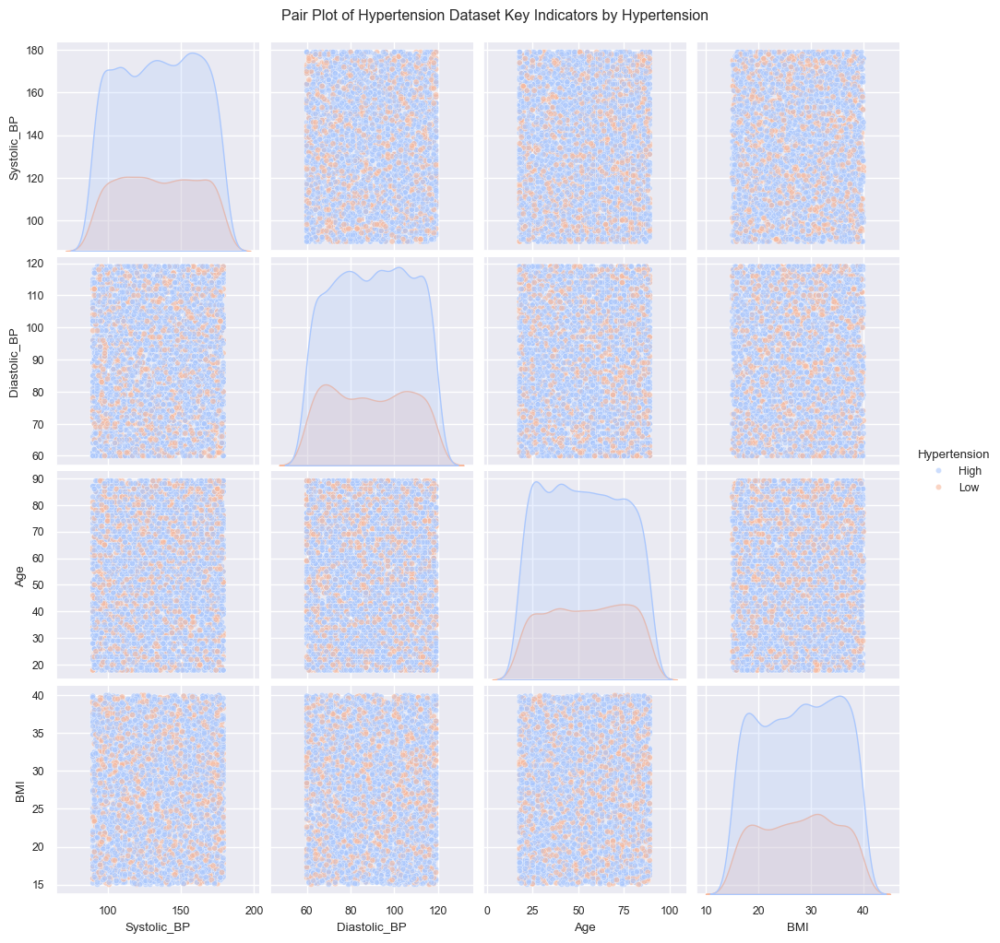

In [161]:
features_to_plot = ['Systolic_BP', 'Diastolic_BP', 'Age', 'BMI', 'Hypertension']
create_pairplot(df_3b, features_to_plot, hue=target_col, dataset_title='Hypertension Dataset', sample_size=5000, palette='coolwarm')

### Numerical Analysis

### Categorical Analysis

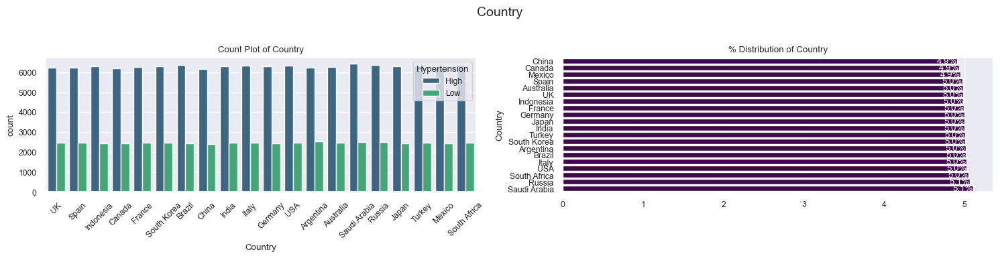


Value counts for Country:
Country
Saudi Arabia     5.1%
Russia          5.06%
South Africa    5.05%
USA             5.03%
Italy           5.03%
Brazil          5.02%
Argentina       5.01%
South Korea     5.01%
Turkey          5.01%
India            5.0%
Japan            5.0%
Germany          5.0%
France          4.99%
Indonesia       4.99%
UK              4.98%
Australia       4.98%
Spain           4.97%
Mexico          4.95%
Canada          4.93%
China           4.91%
Name: proportion, dtype: object


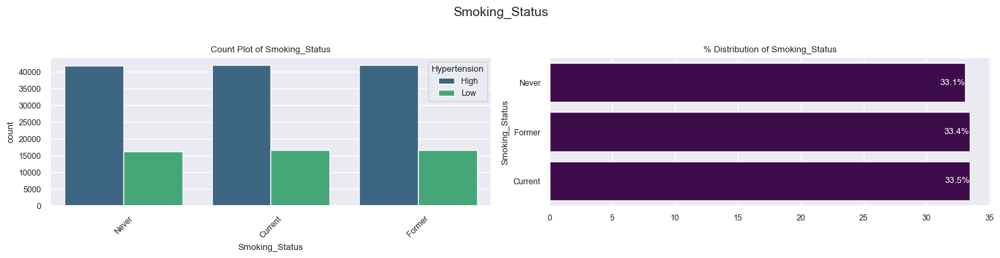


Value counts for Smoking_Status:
Smoking_Status
Current    33.47%
Former     33.44%
Never      33.09%
Name: proportion, dtype: object


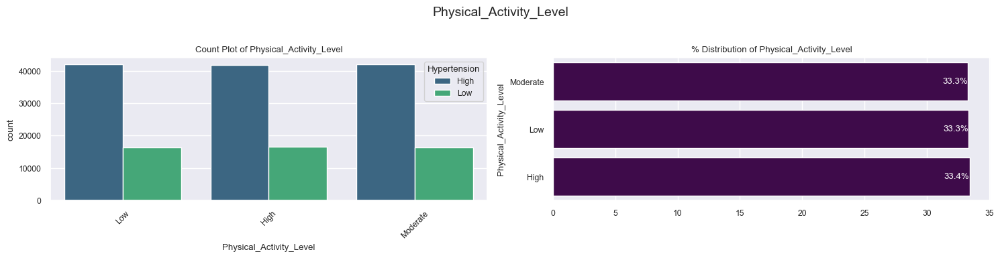


Value counts for Physical_Activity_Level:
Physical_Activity_Level
High        33.41%
Low         33.31%
Moderate    33.28%
Name: proportion, dtype: object


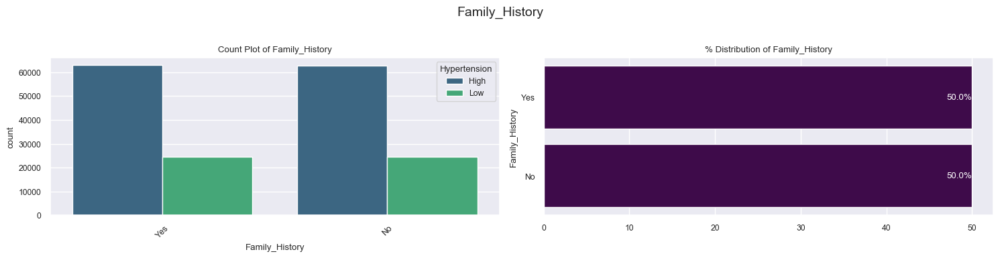


Value counts for Family_History:
Family_History
Yes    50.0%
No     50.0%
Name: proportion, dtype: object


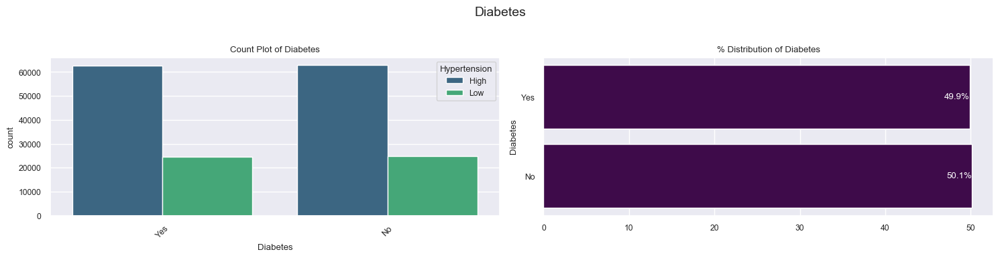


Value counts for Diabetes:
Diabetes
No     50.14%
Yes    49.86%
Name: proportion, dtype: object


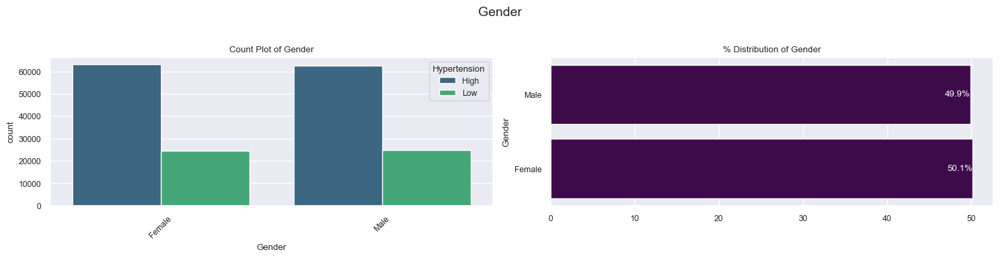


Value counts for Gender:
Gender
Female    50.11%
Male      49.89%
Name: proportion, dtype: object


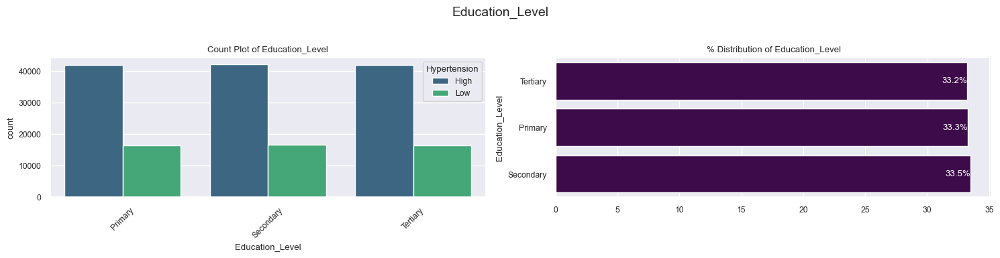


Value counts for Education_Level:
Education_Level
Secondary    33.51%
Primary      33.27%
Tertiary     33.22%
Name: proportion, dtype: object


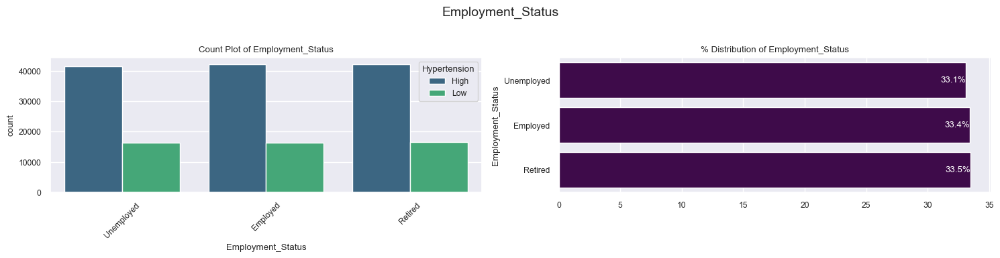


Value counts for Employment_Status:
Employment_Status
Retired       33.47%
Employed      33.43%
Unemployed     33.1%
Name: proportion, dtype: object


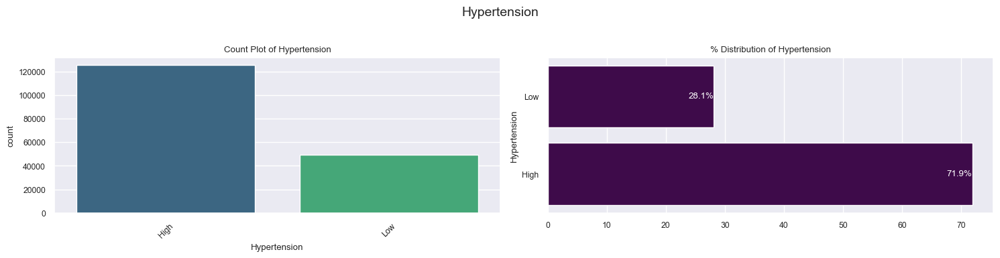


Value counts for Hypertension:
Hypertension
High    71.88%
Low     28.12%
Name: proportion, dtype: object


In [162]:
for col in categorical_cols:
    plot_categorical(df_3b, col, hue = target_col)

### Profile

In [163]:

# profile = ProfileReport(
#     df_3b,
#     html    = {'style': {'primary_color': 'firebrick'}},
#     minimal = False,
#     plot    = {"dpi": 100, "image_format": "svg", "tight_layout": True},
# )
# profile

## <font color='plum'> 3.c. Chronic Kidney Disease Dataset

Contains comprehensive data for 1,659 patients, including 54 variables spanning medical history, lab results, medication usage, quality of life, and environmental
exposure. Ideal for regression, classification, and clustering analyses.
https://www.kaggle.com/datasets/rabieelkharoua/chronic-kidney-disease-dataset-analysis

### Load

In [164]:
file_path = "rabieelkharoua/chronic-kidney-disease-dataset-analysis"
file_name = "Chronic_Kidney_Dsease_data.csv"

# Load the latest version
df_3c = kagglehub.dataset_load(
  KaggleDatasetAdapter.PANDAS,
  file_path,
  file_name,
)

df_3c.head()

,PatientID,Age,Gender,Ethnicity,SocioeconomicStatus,EducationLevel,BMI,Smoking,AlcoholConsumption,PhysicalActivity,...,Itching,QualityOfLifeScore,HeavyMetalsExposure,OccupationalExposureChemicals,WaterQuality,MedicalCheckupsFrequency,MedicationAdherence,HealthLiteracy,Diagnosis,DoctorInCharge
0,1,71,0,0,0,2,31.069414,1,5.128112,1.676220,...,7.556302,76.076800,0,0,1,1.018824,4.966808,9.871449,1,Confidential
1,2,34,0,0,1,3,29.692119,1,18.609552,8.377574,...,6.836766,40.128498,0,0,0,3.923538,8.189275,7.161765,1,Confidential
2,3,80,1,1,0,1,37.394822,1,11.882429,9.607401,...,2.144722,92.872842,0,1,1,1.429906,7.624028,7.354632,1,Confidential
3,4,40,0,2,0,1,31.329680,0,16.020165,0.408871,...,7.077188,90.080321,0,0,0,3.226416,3.282688,6.629587,1,Confidential
4,5,43,0,1,1,2,23.726311,0,7.944146,0.780319,...,3.553118,5.258372,0,0,1,0.285466,3.849498,1.437385,1,Confidential


### Summary

In [165]:
df_3c.columns = df_3c.columns.str.strip()
df_3c.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1659 entries, 0 to 1658
Data columns (total 54 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   PatientID                      1659 non-null   int64  
 1   Age                            1659 non-null   int64  
 2   Gender                         1659 non-null   int64  
 3   Ethnicity                      1659 non-null   int64  
 4   SocioeconomicStatus            1659 non-null   int64  
 5   EducationLevel                 1659 non-null   int64  
 6   BMI                            1659 non-null   float64
 7   Smoking                        1659 non-null   int64  
 8   AlcoholConsumption             1659 non-null   float64
 9   PhysicalActivity               1659 non-null   float64
 10  DietQuality                    1659 non-null   float64
 11  SleepQuality                   1659 non-null   float64
 12  FamilyHistoryKidneyDisease     1659 non-null   i

In [166]:
columns_to_drop = ['PatientID', 'DoctorInCharge']  # Columns to drop
df_3c.drop(columns=columns_to_drop, inplace=True, errors='ignore')  # Drop specified columns

df_3c.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,1659.0,54.441230,20.549757,20.000000,36.000000,54.000000,72.000000,90.000000
Gender,1659.0,0.515371,0.499914,0.000000,0.000000,1.000000,1.000000,1.000000
Ethnicity,1659.0,0.713080,1.000430,0.000000,0.000000,0.000000,1.000000,3.000000
SocioeconomicStatus,1659.0,0.977697,0.776686,0.000000,0.000000,1.000000,2.000000,2.000000
EducationLevel,1659.0,1.693189,0.910611,0.000000,1.000000,2.000000,2.000000,3.000000
BMI,1659.0,27.620049,7.288670,15.033888,21.471449,27.652077,34.015849,39.993532
Smoking,1659.0,0.292948,0.455252,0.000000,0.000000,0.000000,1.000000,1.000000
AlcoholConsumption,1659.0,9.969831,5.798787,0.021740,5.051156,9.951503,14.967100,19.992713
PhysicalActivity,1659.0,5.024247,2.866274,0.001186,2.555038,5.072395,7.460563,9.998167
DietQuality,1659.0,5.028544,2.865777,0.002407,2.558443,4.989810,7.428290,9.998927


In [167]:
target_col          = 'Diagnosis'
categorical_cols    = []
numeric_cols        = []


for col in df_3c.drop(columns = [target_col]):
    if len(df_3c[col].unique()) < 5:
        categorical_cols.append(col);
    else:
        numeric_cols.append(col);
    print(f'{col}: {df_3c[col].unique()},\n{df_3c[col].nunique()} unique values\n')

Age: [71 34 80 40 43 22 41 72 21 49 57 83 79 52 77 68 78 61 81 66 70 74 26 58
 37 23 33 28 90 63 27 54 55 69 25 73 82 53 67 59 45 60 48 64 84 20 30 24
 47 31 42 56 46 62 32 51 85 76 89 75 38 87 36 88 35 39 86 50 44 65 29],
71 unique values

Gender: [0 1],
2 unique values

Ethnicity: [0 1 2 3],
4 unique values

SocioeconomicStatus: [0 1 2],
3 unique values

EducationLevel: [2 3 1 0],
4 unique values

BMI: [31.06941375 29.69211876 37.39482182 ... 21.95121871 24.96414904
 19.25325818],
1659 unique values

Smoking: [1 0],
2 unique values

AlcoholConsumption: [ 5.12811186 18.60955184 11.88242933 ... 15.82595492 12.96746151
 11.39650955],
1659 unique values

PhysicalActivity: [1.67621971 8.37757445 9.6074011  ... 7.34996438 0.61861424 7.44631444],
1659 unique values

DietQuality: [0.24038556 6.50323323 2.10482836 ... 5.0381937  4.55757703 0.75739645],
1659 unique values

SleepQuality: [4.07643366 7.65281255 4.39278611 ... 8.44085924 5.5270997  8.19167801],
1659 unique values

FamilyHistoryKi

In [168]:
print(f"Categorical columns: {categorical_cols}")
print(f"Numeric columns: {numeric_cols}")
print(len(categorical_cols), len(numeric_cols))


demographics            = ["Age", "Gender", "Ethnicity", "SocioeconomicStatus", "EducationLevel"]
lifestyle_factors       = ["BMI", "Smoking", "AlcoholConsumption", "PhysicalActivity", "DietQuality", "SleepQuality"]
family_medical_history  = ["FamilyHistoryKidneyDisease", "FamilyHistoryHypertension", "FamilyHistoryDiabetes"]
medical_history         = ["PreviousAcuteKidneyInjury", "UrinaryTractInfections"]

vital_signs_lab_results = [
    "SystolicBP", "DiastolicBP", "FastingBloodSugar", "HbA1c", "SerumCreatinine", "BUNLevels", "GFR",
    "ProteinInUrine", "ACR", "SerumElectrolytesSodium", "SerumElectrolytesPotassium",
    "SerumElectrolytesCalcium", "SerumElectrolytesPhosphorus", "HemoglobinLevels",
    "CholesterolTotal", "CholesterolLDL", "CholesterolHDL", "CholesterolTriglycerides"
]

medications                 = ["ACEInhibitors", "Diuretics", "NSAIDsUse", "Statins", "AntidiabeticMedications"]
symptoms                    = ["Edema", "FatigueLevels", "NauseaVomiting", "MuscleCramps", "Itching"]
quality_of_life_environment = ["QualityOfLifeScore", "HeavyMetalsExposure", "OccupationalExposureChemicals", "WaterQuality"]
healthcare_engagement       = ["MedicalCheckupsFrequency", "MedicationAdherence", "HealthLiteracy"]


dict_variable_groups = {
    "Demographics": demographics,
    "Lifestyle Factors": lifestyle_factors,
    "Family Medical History": family_medical_history,
    "Medical History": medical_history,
    "Vital Signs & Lab Results": vital_signs_lab_results,
    "Medications": medications,
    "Symptoms": symptoms,
    "Quality of Life & Environment": quality_of_life_environment,
    "Healthcare Engagement": healthcare_engagement
}

Categorical columns: ['Gender', 'Ethnicity', 'SocioeconomicStatus', 'EducationLevel', 'Smoking', 'FamilyHistoryKidneyDisease', 'FamilyHistoryHypertension', 'FamilyHistoryDiabetes', 'PreviousAcuteKidneyInjury', 'UrinaryTractInfections', 'ACEInhibitors', 'Diuretics', 'Statins', 'AntidiabeticMedications', 'Edema', 'HeavyMetalsExposure', 'OccupationalExposureChemicals', 'WaterQuality']
Numeric columns: ['Age', 'BMI', 'AlcoholConsumption', 'PhysicalActivity', 'DietQuality', 'SleepQuality', 'SystolicBP', 'DiastolicBP', 'FastingBloodSugar', 'HbA1c', 'SerumCreatinine', 'BUNLevels', 'GFR', 'ProteinInUrine', 'ACR', 'SerumElectrolytesSodium', 'SerumElectrolytesPotassium', 'SerumElectrolytesCalcium', 'SerumElectrolytesPhosphorus', 'HemoglobinLevels', 'CholesterolTotal', 'CholesterolLDL', 'CholesterolHDL', 'CholesterolTriglycerides', 'NSAIDsUse', 'FatigueLevels', 'NauseaVomiting', 'MuscleCramps', 'Itching', 'QualityOfLifeScore', 'MedicalCheckupsFrequency', 'MedicationAdherence', 'HealthLiteracy']
1

### Variable Group plots

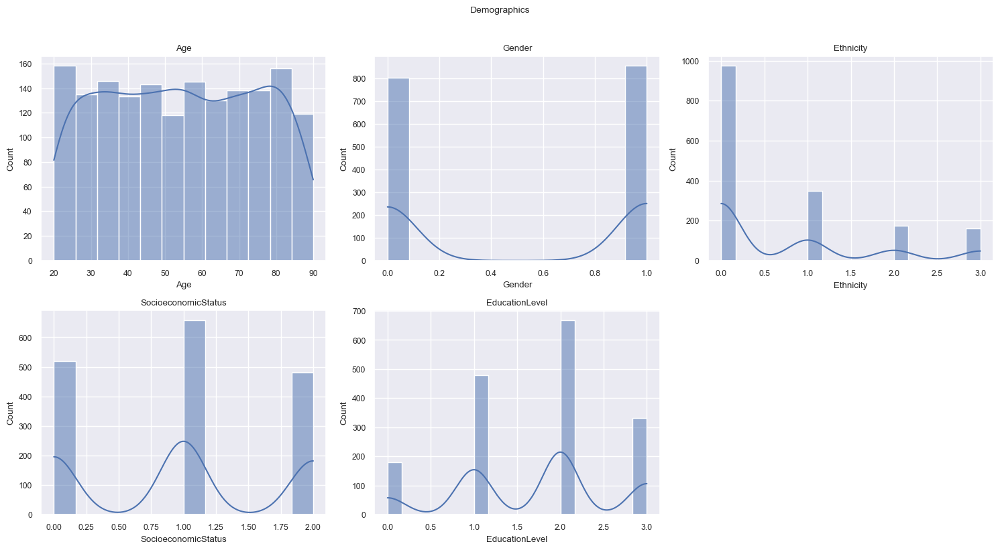

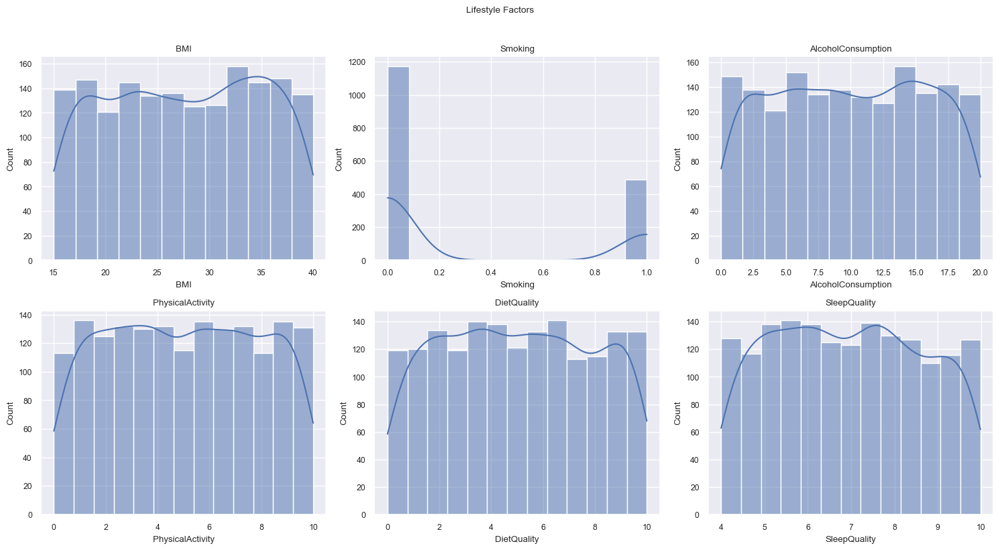

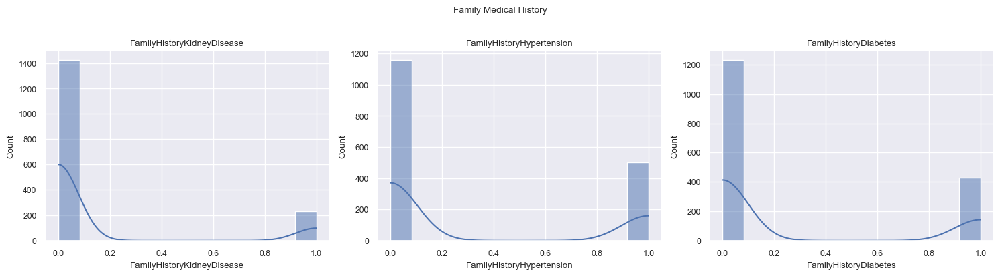

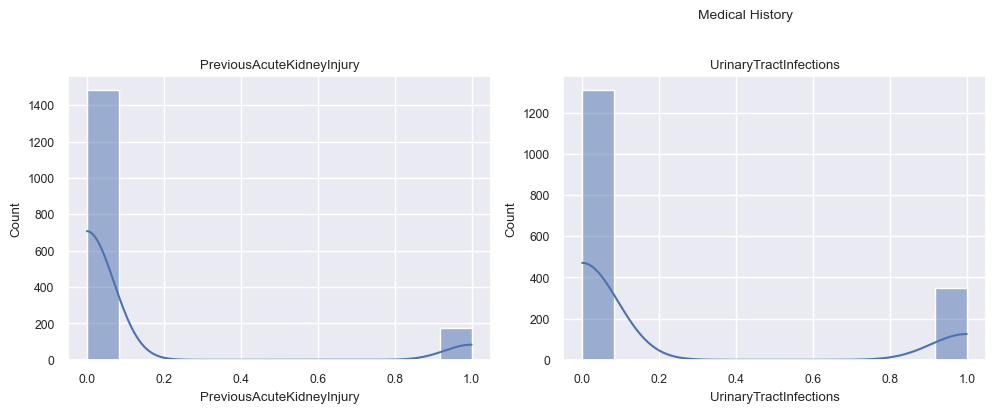

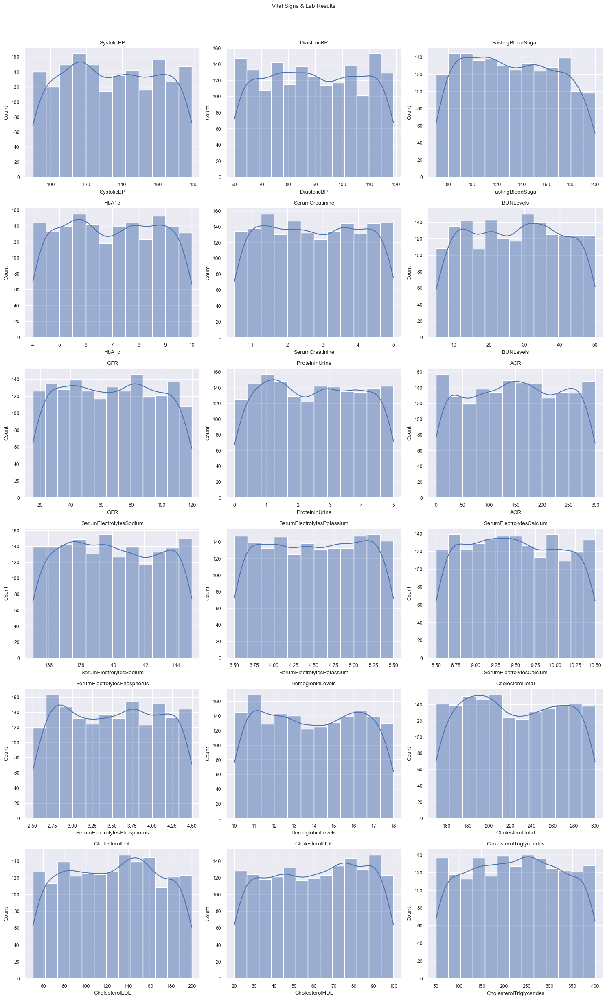

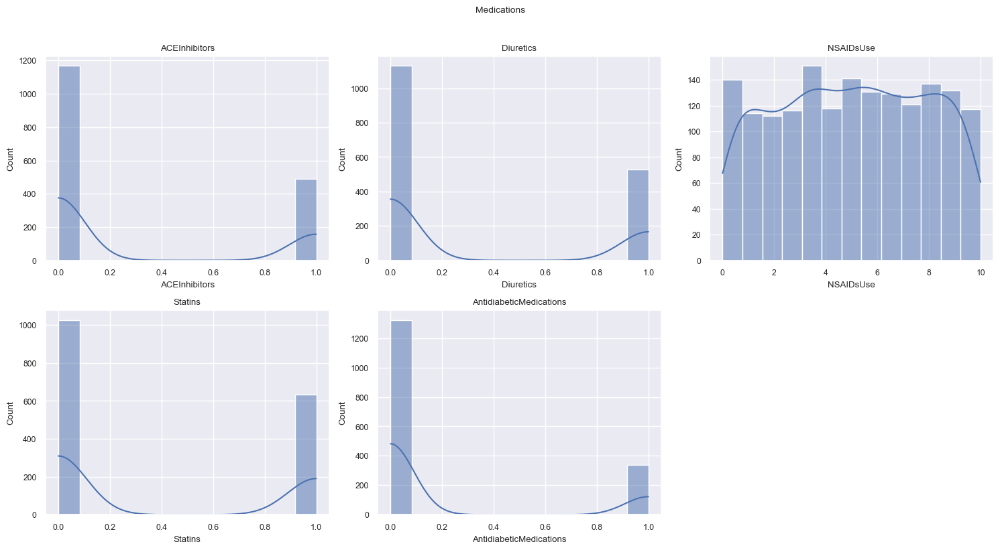

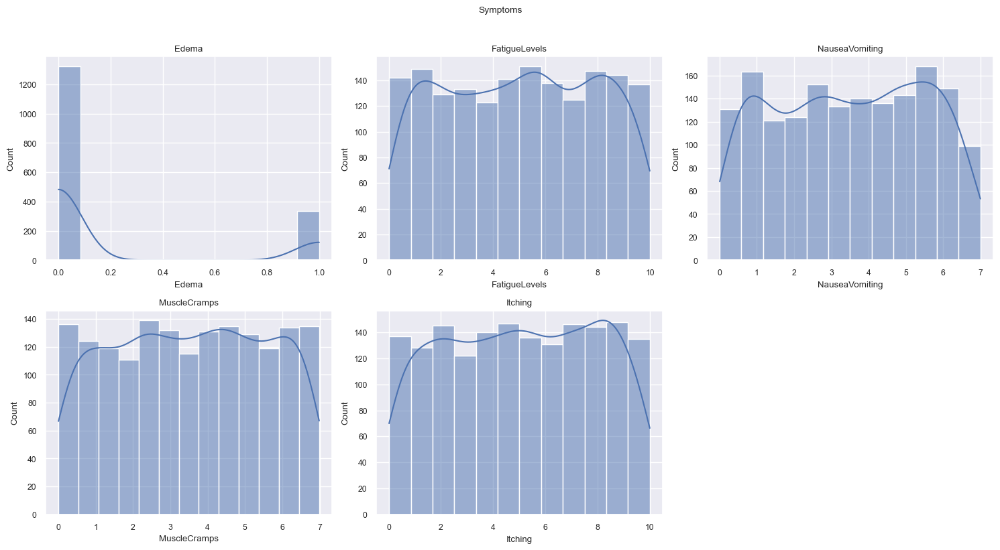

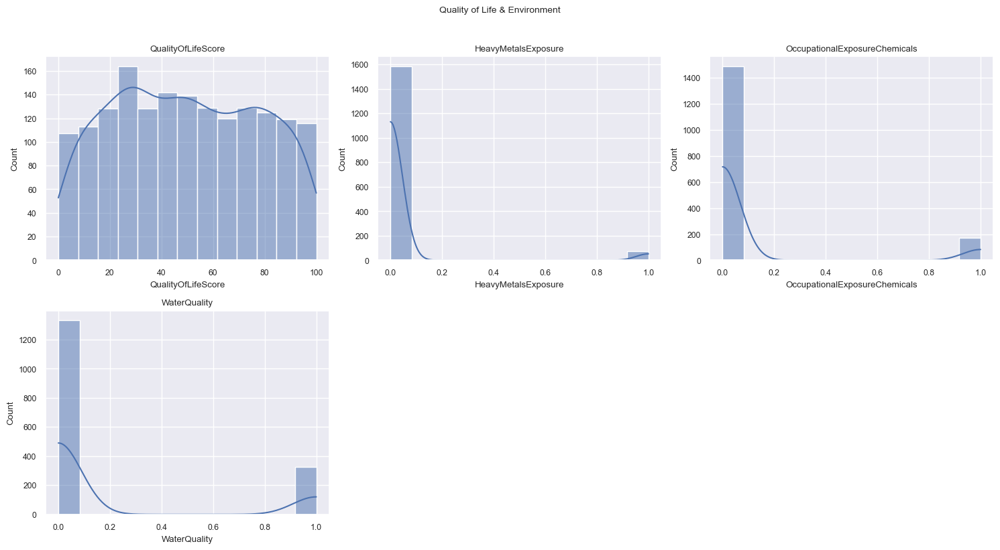

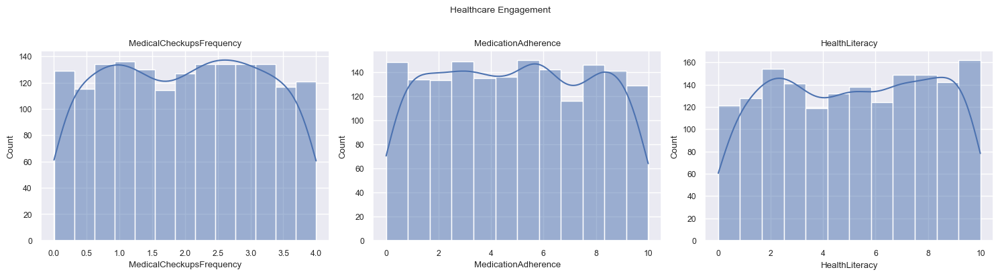

In [169]:
for key,val in dict_variable_groups.items():
    plot_variable_group(df_3c, val, key)

### Correlation & Pair Plots

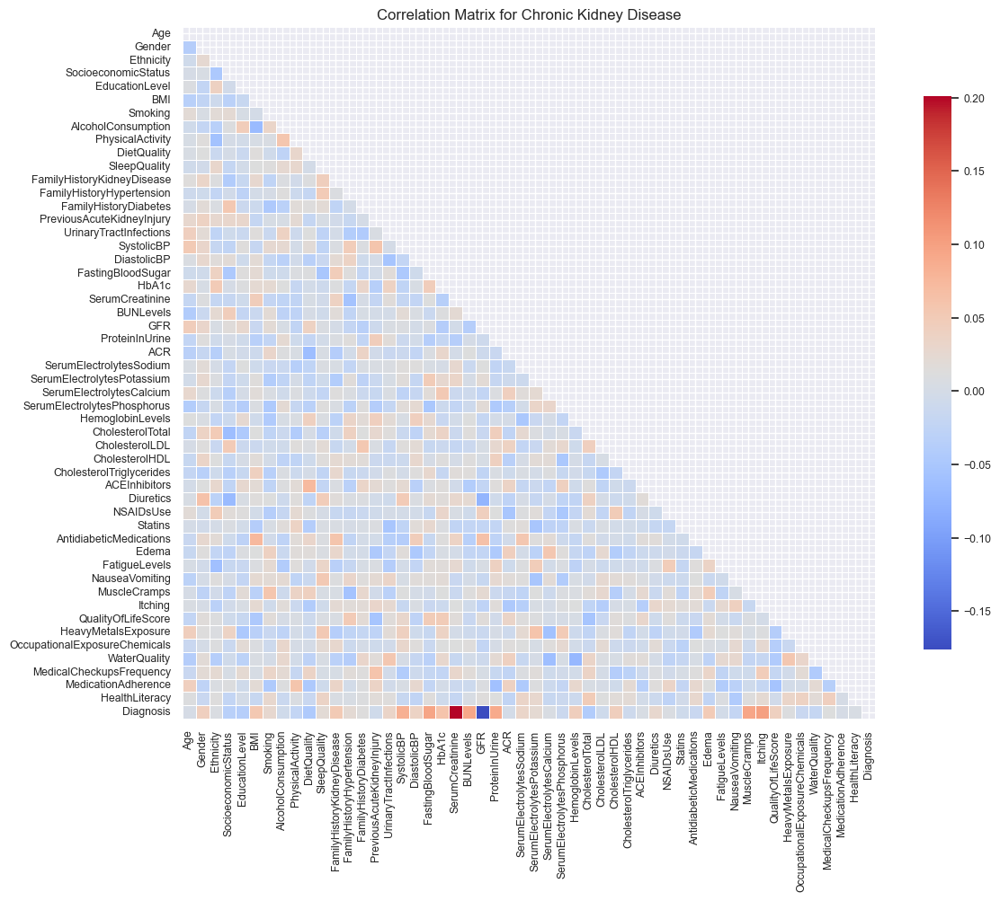

In [170]:
get_correl_matrix(df_3c, 'Chronic Kidney Disease', data_labels=False, colormap = 'coolwarm', method = 'pearson') 

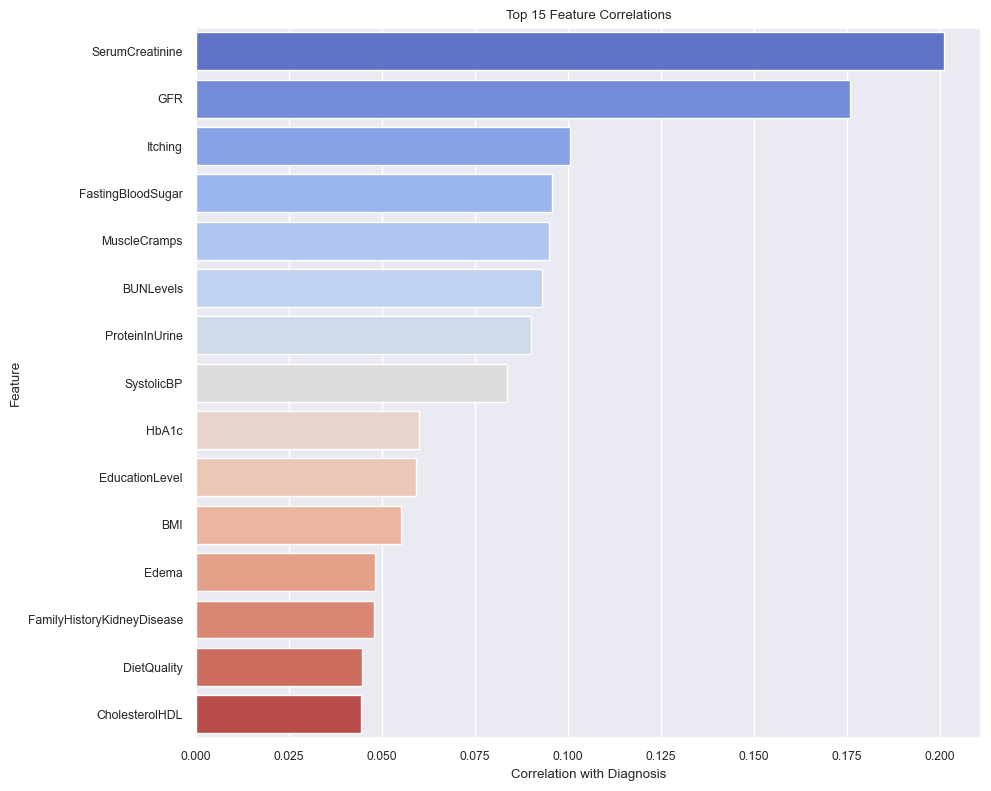

In [171]:


# Compute correlations for CKD dataset

correlations = {}

# Point-biserial for numerical features
for col in numeric_cols:
	if df_3c[col].isnull().any():
		continue
	corr, _ = pointbiserialr(df_3c[target_col], df_3c[col])
	correlations[col] = abs(corr)

# Cramér's V for categorical features
def cramers_v(x, y):
	confusion_matrix = pd.crosstab(x, y)
	chi2 	= chi2_contingency(confusion_matrix)[0]
	n 		= confusion_matrix.sum().sum()
	phi2 	= chi2 / n
	r, k 	= confusion_matrix.shape
	return np.sqrt(phi2 / min(k - 1, r - 1))

for col in categorical_cols:
	try:
		correlations[col] = cramers_v(df_3c[col], df_3c[target_col])
	except Exception:
		continue

# Sort and get top 15
sorted_corr = sorted(correlations.items(), key=lambda x: x[1], reverse=True)[:15]
top_features, top_values = zip(*sorted_corr)

# Plot
plt.figure(figsize=(10, 8))
sns.barplot(x=top_values, y=top_features, hue=top_features, palette="coolwarm", legend=False)
plt.xlabel(f"Correlation with {target_col}")
plt.ylabel("Feature")
plt.title("Top 15 Feature Correlations")
plt.tight_layout()
plt.show()

Generating pair plot for features: Age, Gender, Ethnicity, SocioeconomicStatus, EducationLevel, Diagnosis


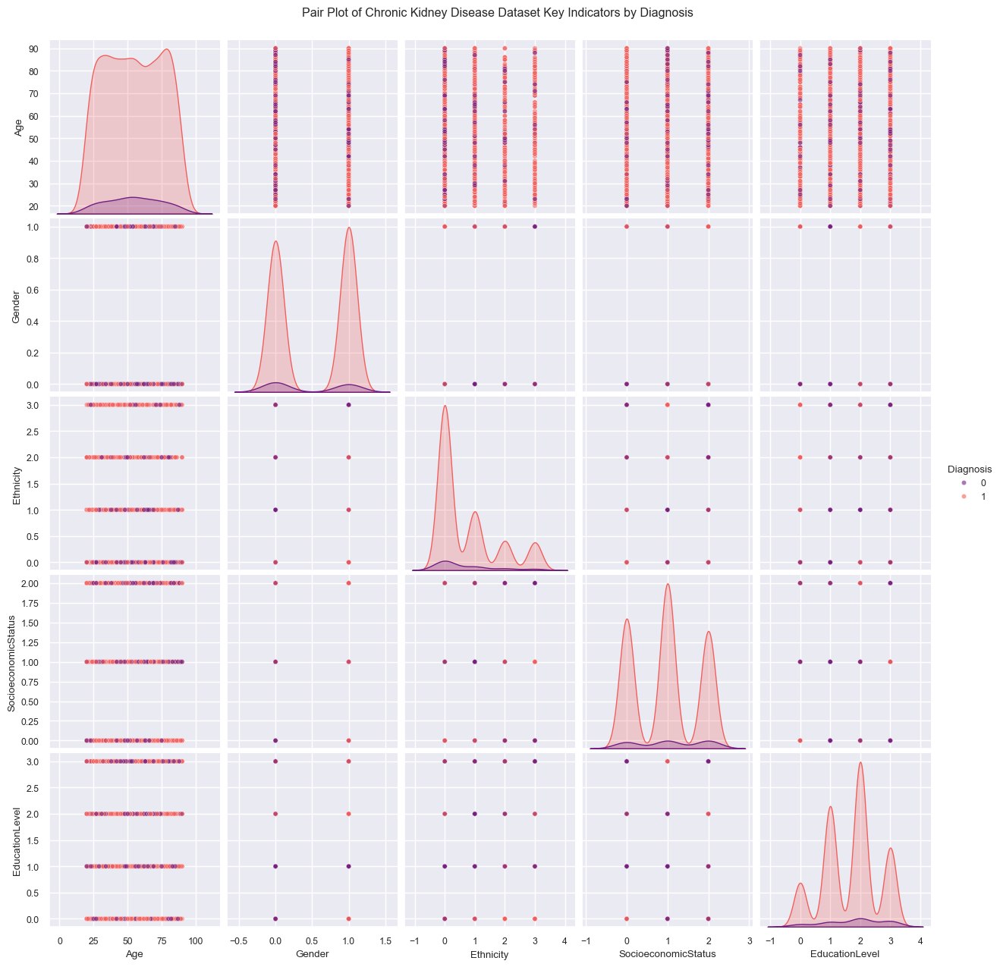

In [172]:
features_to_plot = dict_variable_groups['Demographics'] + ['Diagnosis']
create_pairplot(df_3c, features_to_plot, hue=target_col, dataset_title='Chronic Kidney Disease Dataset', sample_size=5000, palette='magma')

Generating pair plot for features: HbA1c, SerumCreatinine, BUNLevels, GFR, ProteinInUrine, MuscleCramps, Itching


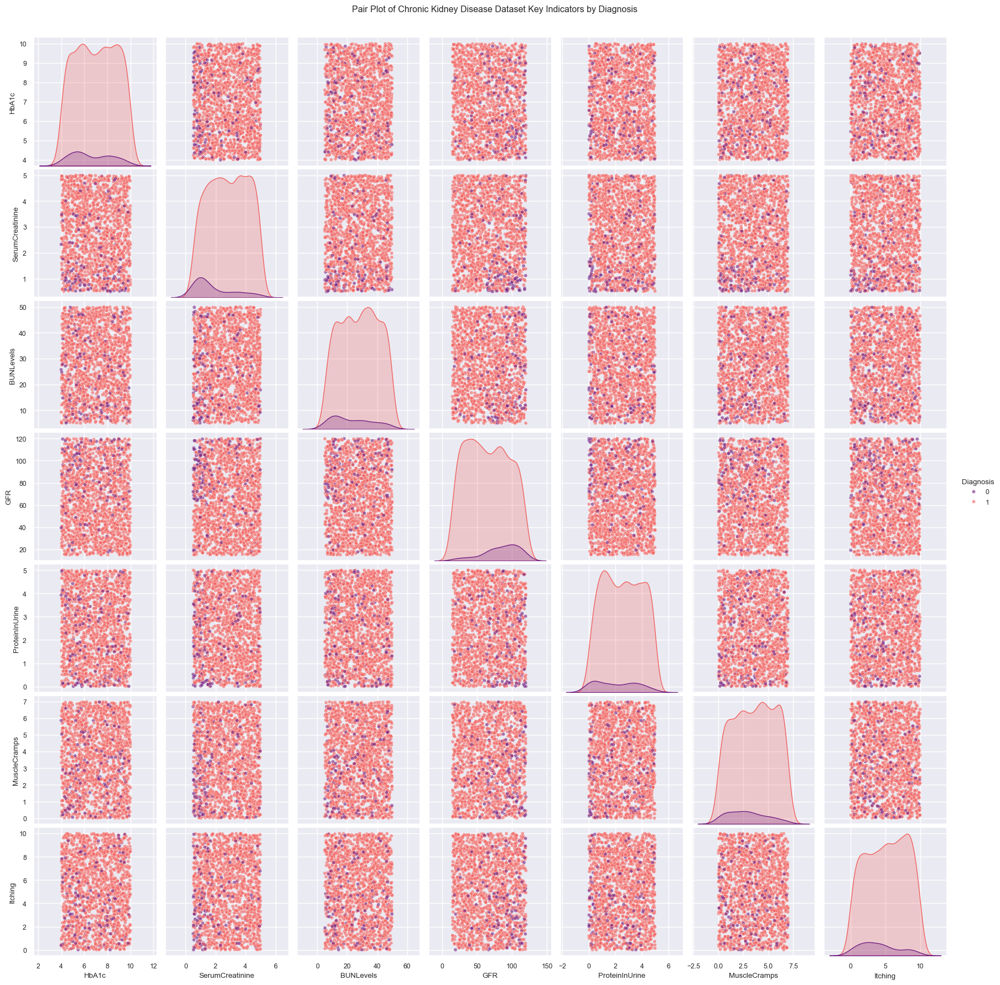

In [173]:
more_features = ['HbA1c', 'SerumCreatinine', 'BUNLevels', 'GFR', 'ProteinInUrine', 'MuscleCramps','Itching']
create_pairplot(df_3c, more_features, hue=target_col, dataset_title='Chronic Kidney Disease Dataset', sample_size=5000, palette='magma')

### Numerical Analysis

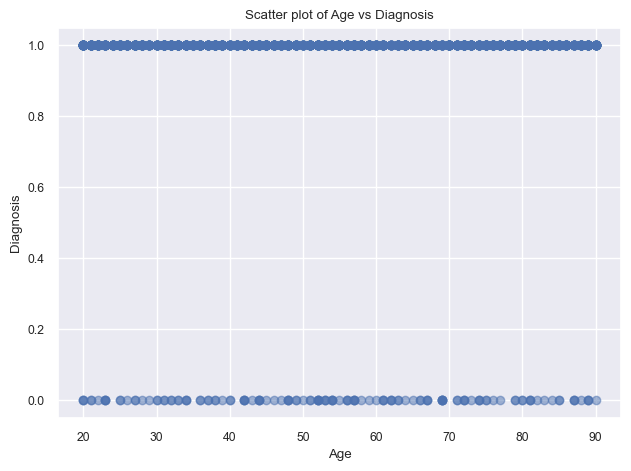

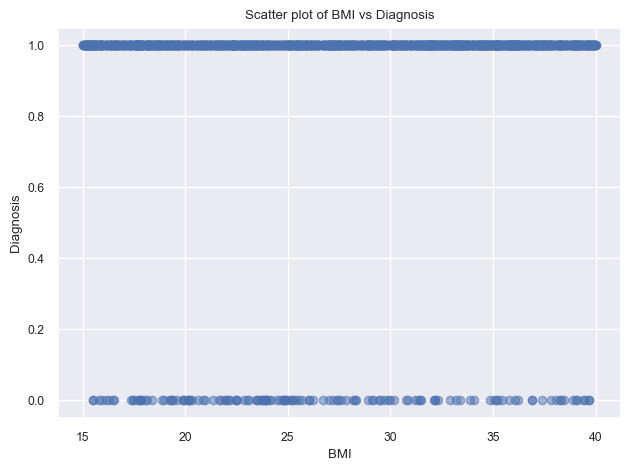

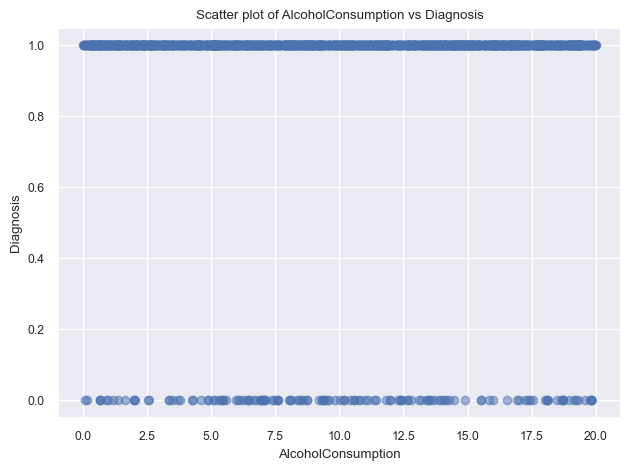

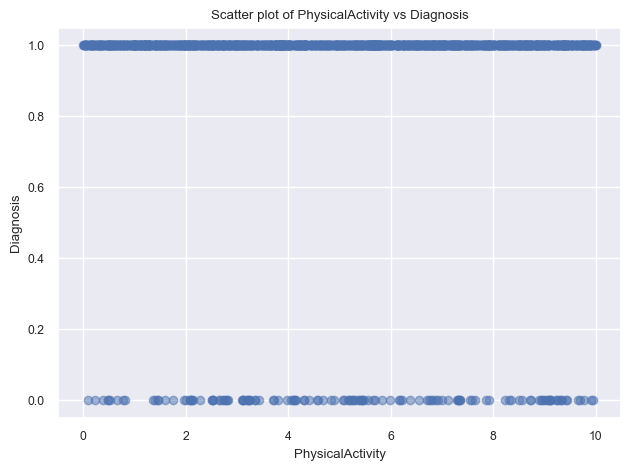

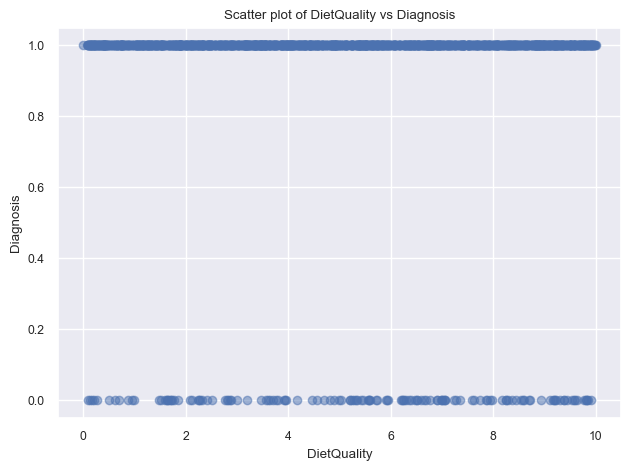

...

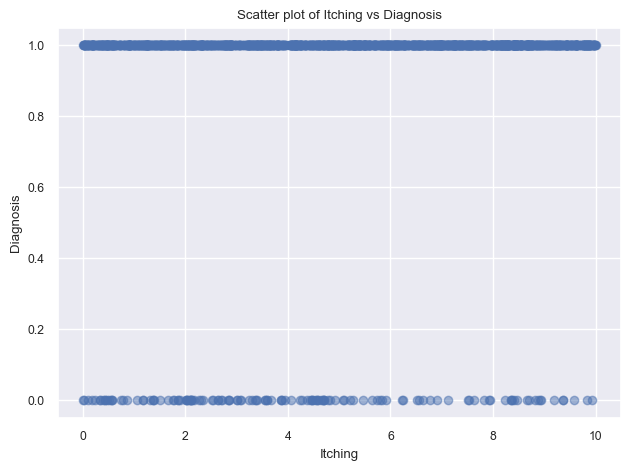

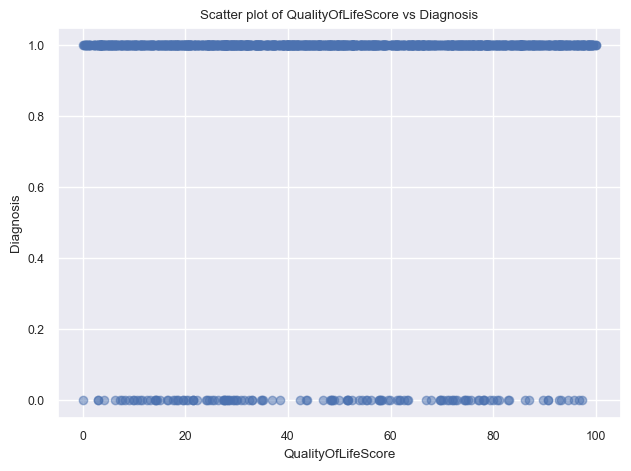

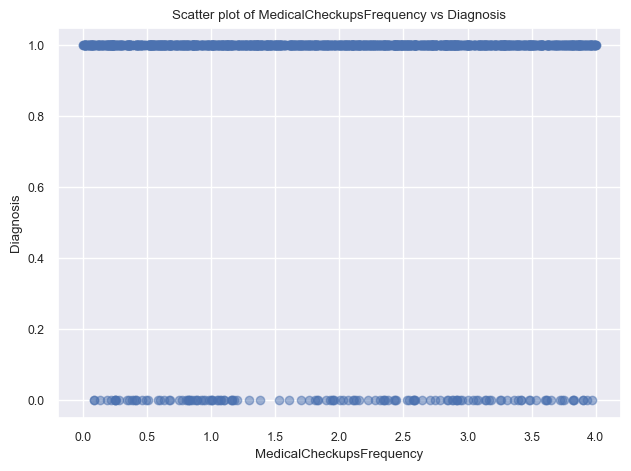

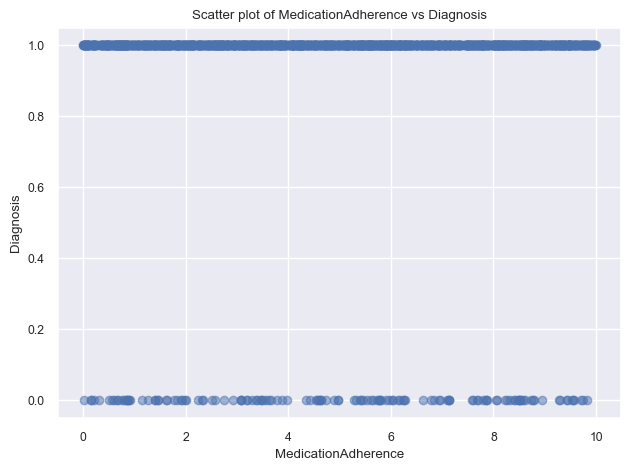

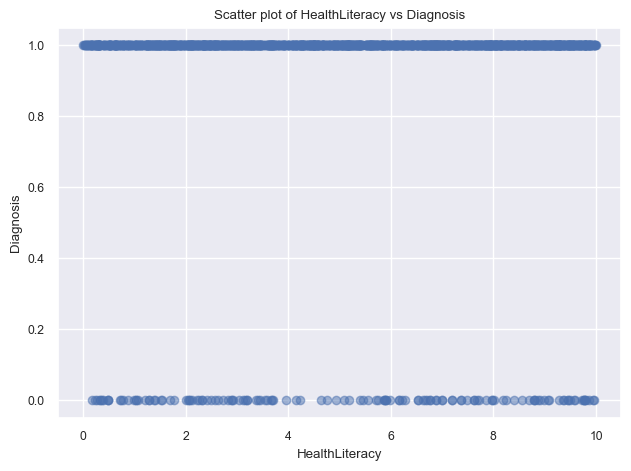

In [174]:
for col in numeric_cols:
    plt.scatter(df_3c[col], df_3c[target_col], alpha=0.5)
    plt.xlabel(col)
    plt.ylabel(target_col)
    plt.title(f'Scatter plot of {col} vs {target_col}')
    plt.tight_layout()
    plt.show()

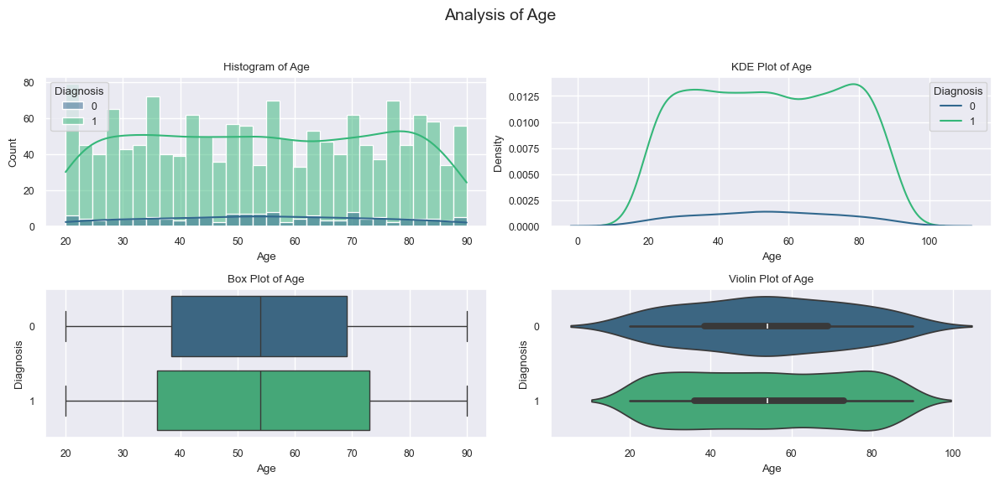

             Age
Mean      54.441
Median    54.000
Mode      81.000
Min       20.000
Max       90.000
Range     70.000
IQR       36.000
Skewness   0.003
Kurtosis  -1.213


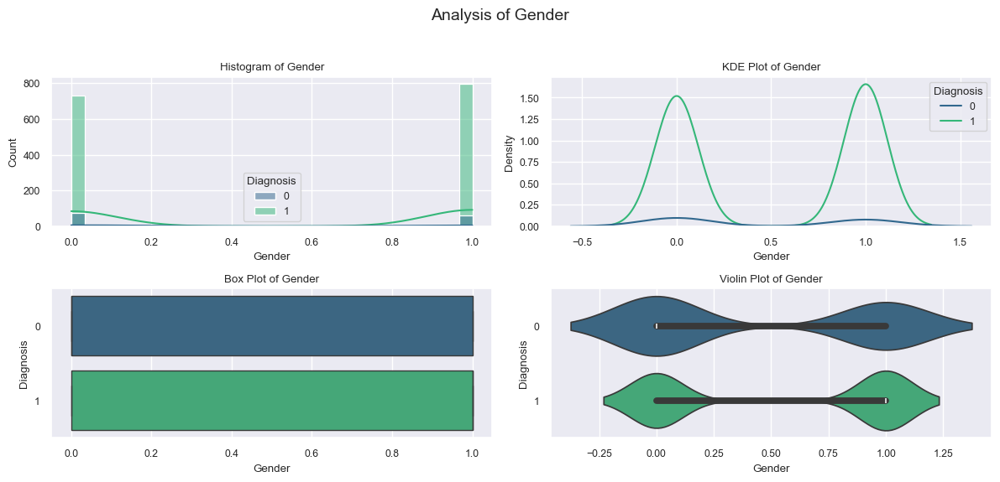

          Gender
Mean       0.515
Median     1.000
Mode       1.000
Min        0.000
Max        1.000
Range      1.000
IQR        1.000
Skewness  -0.062
Kurtosis  -1.999


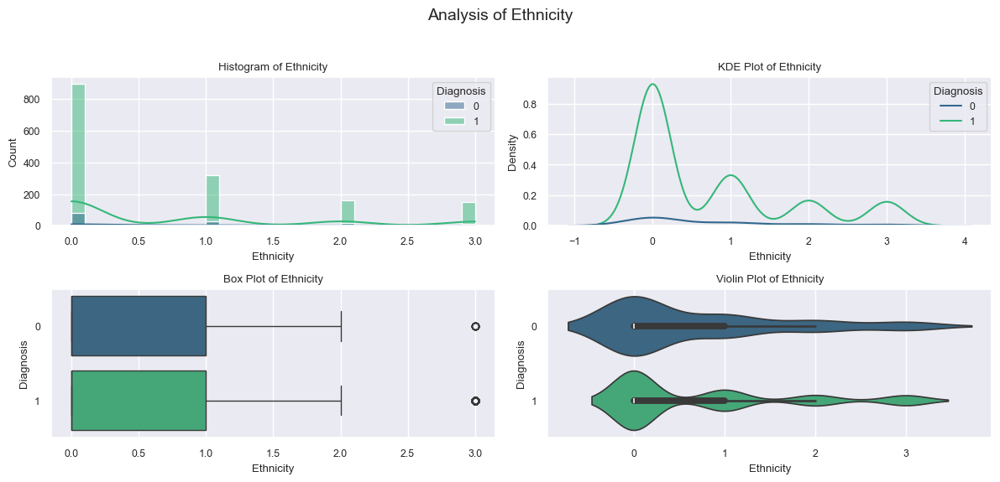

          Ethnicity
Mean          0.713
Median        0.000
Mode          0.000
Min           0.000
Max           3.000
Range         3.000
IQR           1.000
Skewness      1.184
Kurtosis      0.114


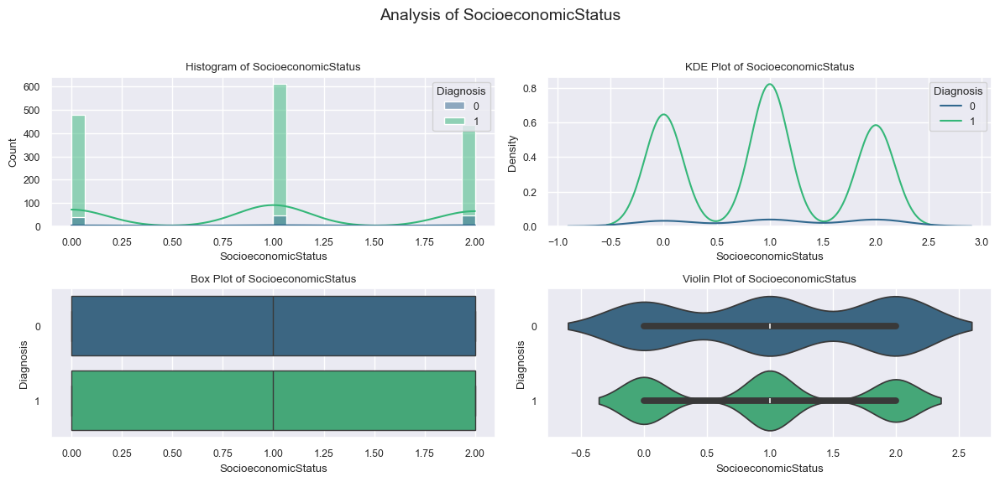

          SocioeconomicStatus
Mean                    0.978
Median                  1.000
Mode                    1.000
Min                     0.000
Max                     2.000
Range                   2.000
IQR                     2.000
Skewness                0.039
Kurtosis               -1.341


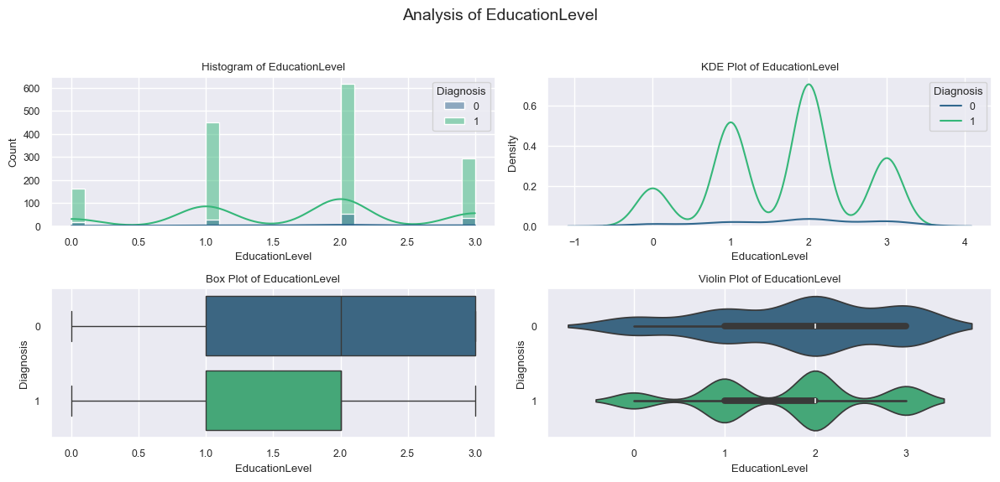

          EducationLevel
Mean               1.693
Median             2.000
Mode               2.000
Min                0.000
Max                3.000
Range              3.000
IQR                1.000
Skewness          -0.220
Kurtosis          -0.750


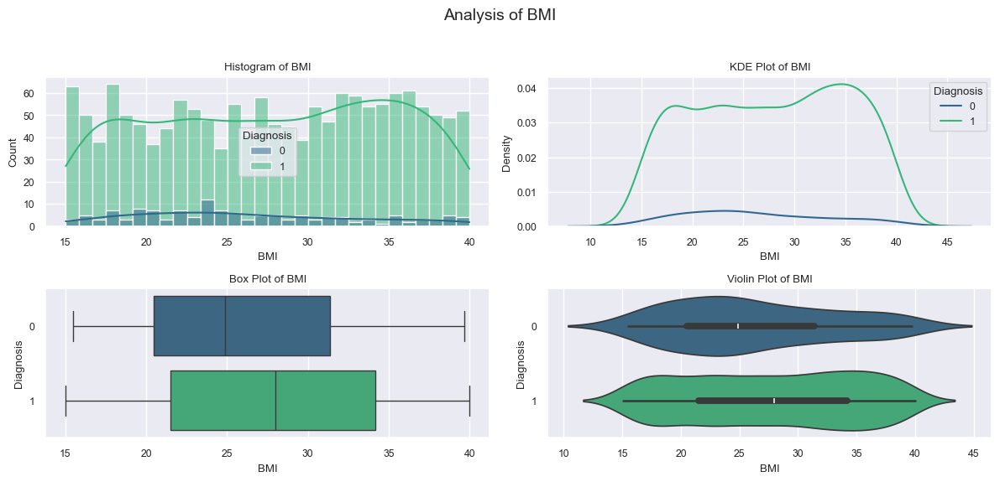

                                                        BMI
Mean                                              27.620049
Median                                            27.652077
Mode      15.033888112448722, 15.039485526947797, 15.039...
Min                                               15.033888
Max                                               39.993532
Range                                             24.959644
IQR                                                 12.5444
Skewness                                          -0.041887
Kurtosis                                          -1.226092


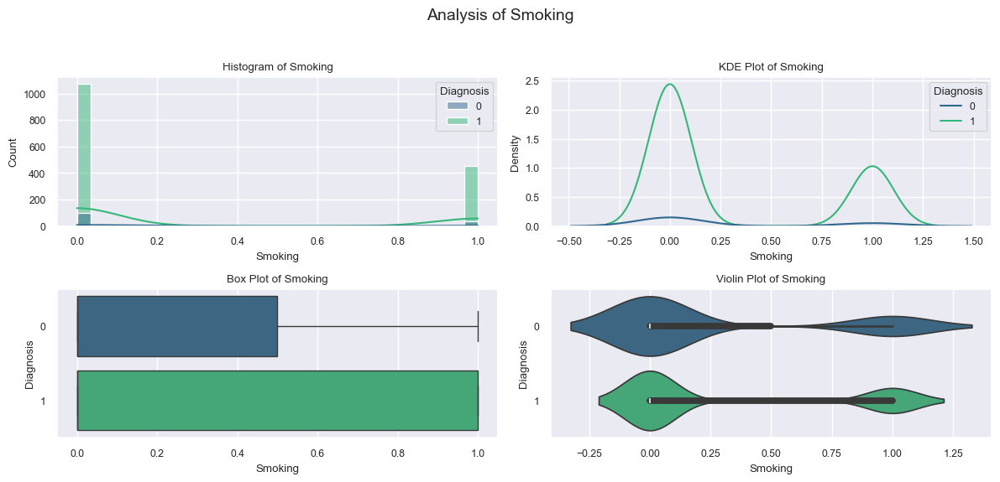

          Smoking
Mean        0.293
Median      0.000
Mode        0.000
Min         0.000
Max         1.000
Range       1.000
IQR         1.000
Skewness    0.911
Kurtosis   -1.172


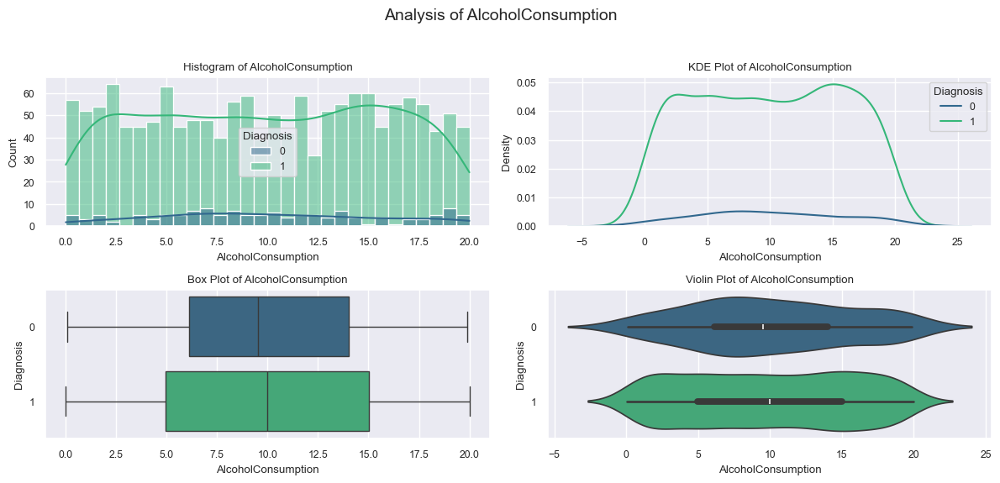

                                         AlcoholConsumption
Mean                                               9.969831
Median                                             9.951503
Mode      0.0217403960986506, 0.027359687270736, 0.04368...
Min                                                 0.02174
Max                                               19.992713
Range                                             19.970972
IQR                                                9.915944
Skewness                                          -0.010258
Kurtosis                                          -1.215995


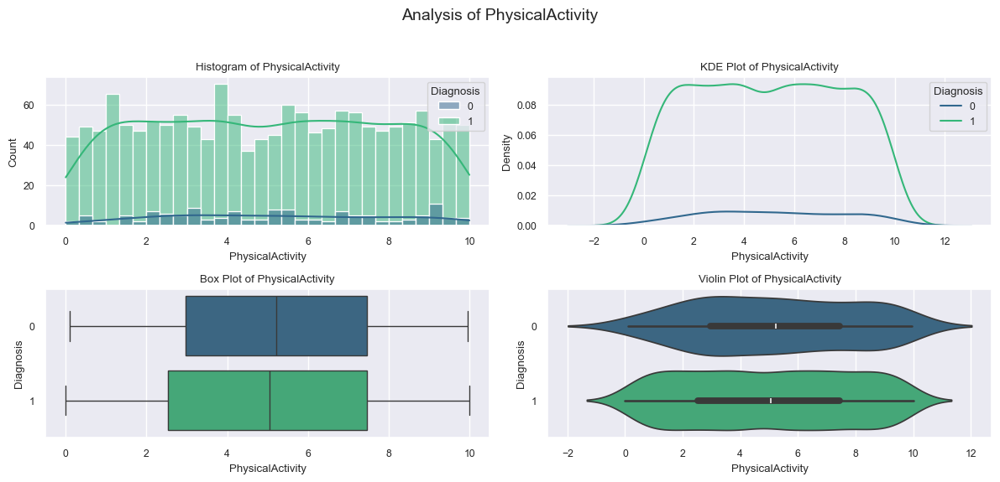

                                           PhysicalActivity
Mean                                               5.024247
Median                                             5.072395
Mode      0.0011864491085, 0.006394608605349, 0.01128622...
Min                                                0.001186
Max                                                9.998167
Range                                              9.996981
IQR                                                4.905525
Skewness                                           0.006964
Kurtosis                                          -1.198921


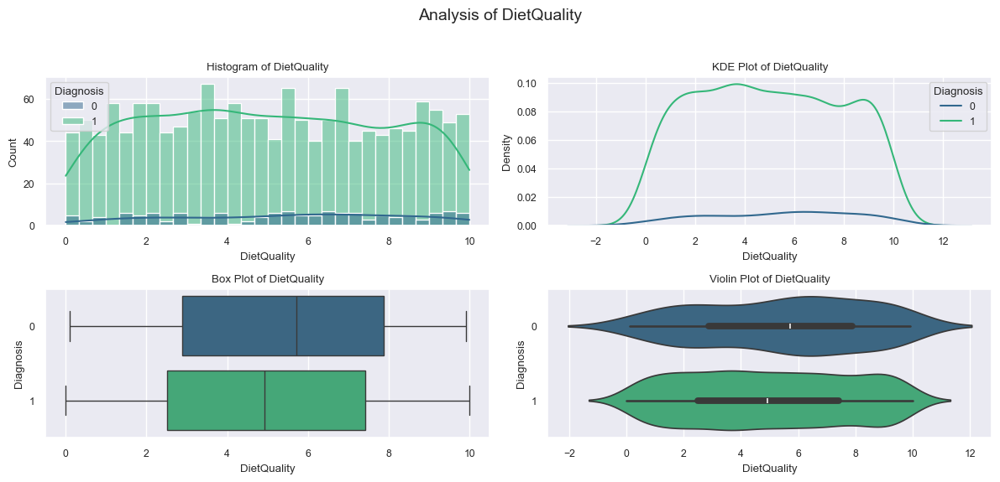

                                                DietQuality
Mean                                               5.028544
Median                                              4.98981
Mode      0.0024066974290226, 0.0717443835045383, 0.0882...
Min                                                0.002407
Max                                                9.998927
Range                                               9.99652
IQR                                                4.869846
Skewness                                           0.023528
Kurtosis                                          -1.178241


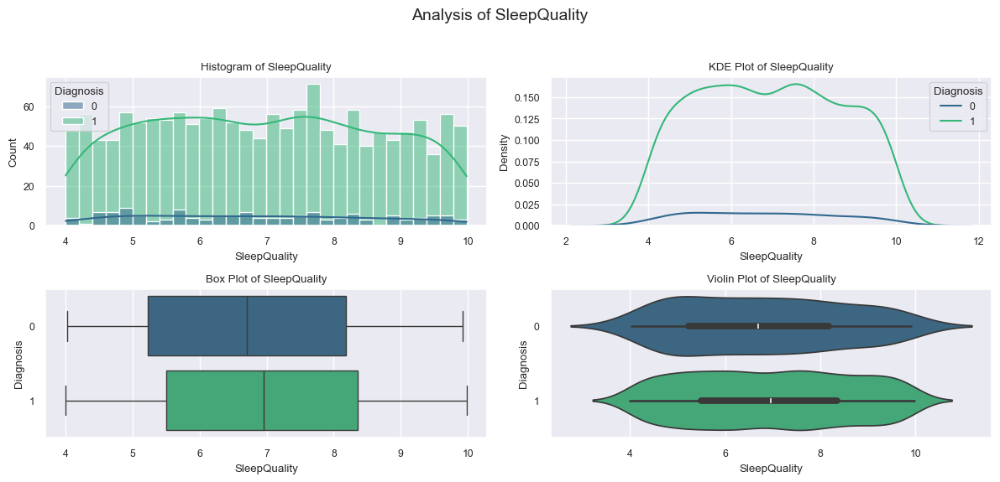

                                               SleepQuality
Mean                                               6.942324
Median                                             6.933255
Mode      4.00105309514754, 4.002538771360914, 4.0069819...
Min                                                4.001053
Max                                                9.984197
Range                                              5.983144
IQR                                                2.859215
Skewness                                           0.052256
Kurtosis                                          -1.150765


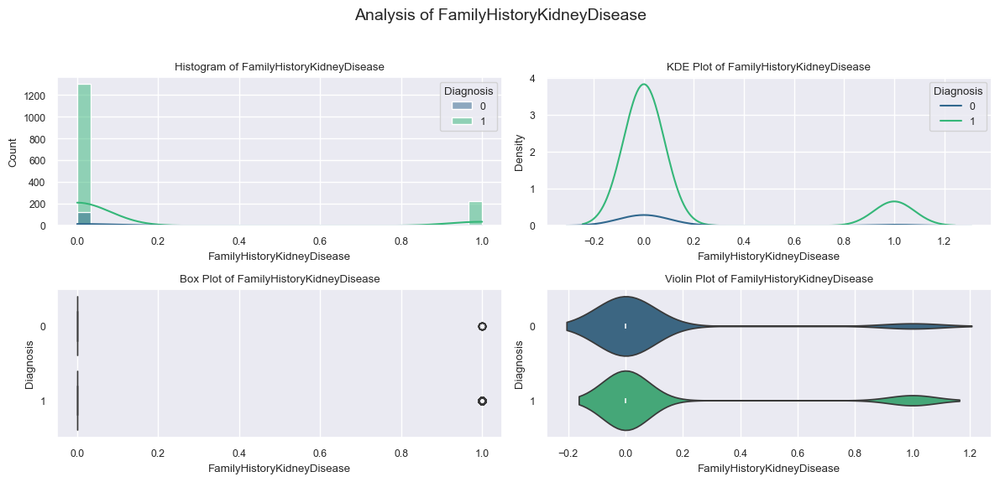

          FamilyHistoryKidneyDisease
Mean                           0.141
Median                         0.000
Mode                           0.000
Min                            0.000
Max                            1.000
Range                          1.000
IQR                            0.000
Skewness                       2.064
Kurtosis                       2.264


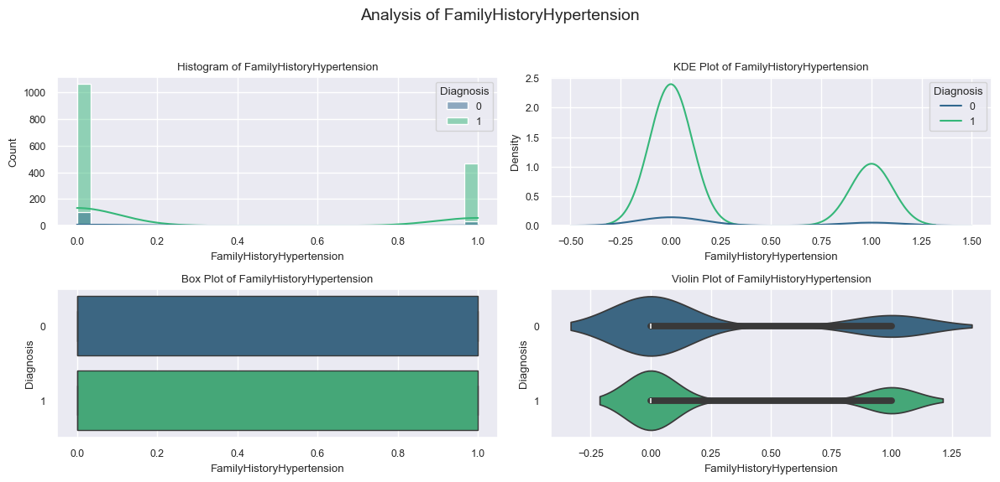

          FamilyHistoryHypertension
Mean                          0.301
Median                        0.000
Mode                          0.000
Min                           0.000
Max                           1.000
Range                         1.000
IQR                           1.000
Skewness                      0.866
Kurtosis                     -1.251


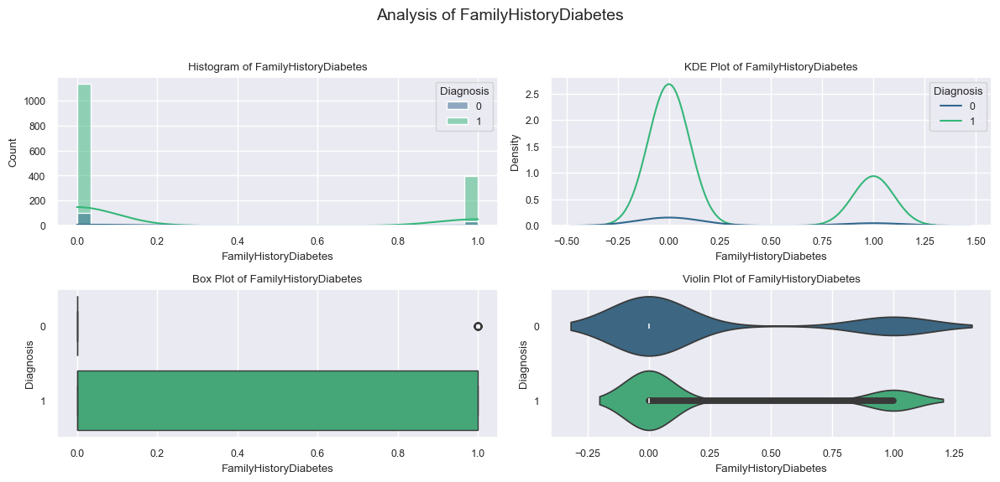

          FamilyHistoryDiabetes
Mean                      0.257
Median                    0.000
Mode                      0.000
Min                       0.000
Max                       1.000
Range                     1.000
IQR                       1.000
Skewness                  1.111
Kurtosis                 -0.767


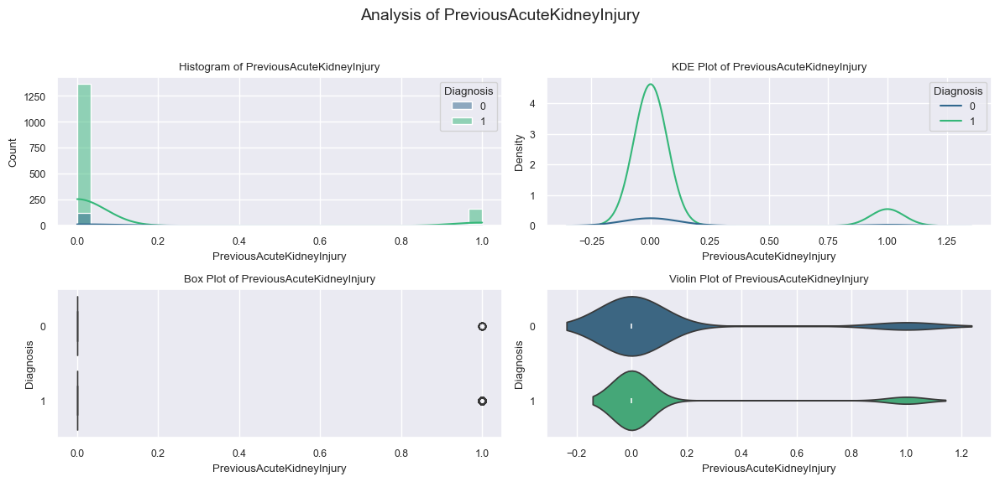

          PreviousAcuteKidneyInjury
Mean                          0.105
Median                        0.000
Mode                          0.000
Min                           0.000
Max                           1.000
Range                         1.000
IQR                           0.000
Skewness                      2.571
Kurtosis                      4.615


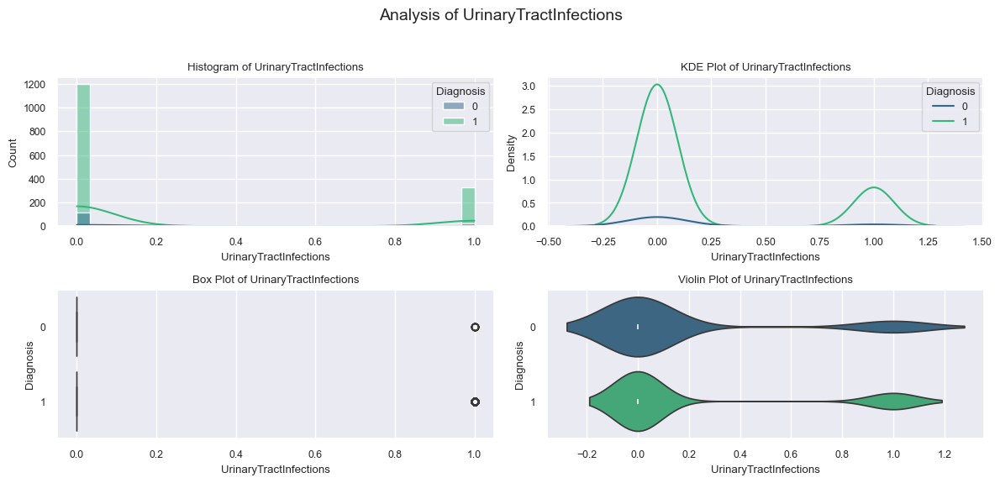

          UrinaryTractInfections
Mean                       0.210
Median                     0.000
Mode                       0.000
Min                        0.000
Max                        1.000
Range                      1.000
IQR                        0.000
Skewness                   1.423
Kurtosis                   0.024


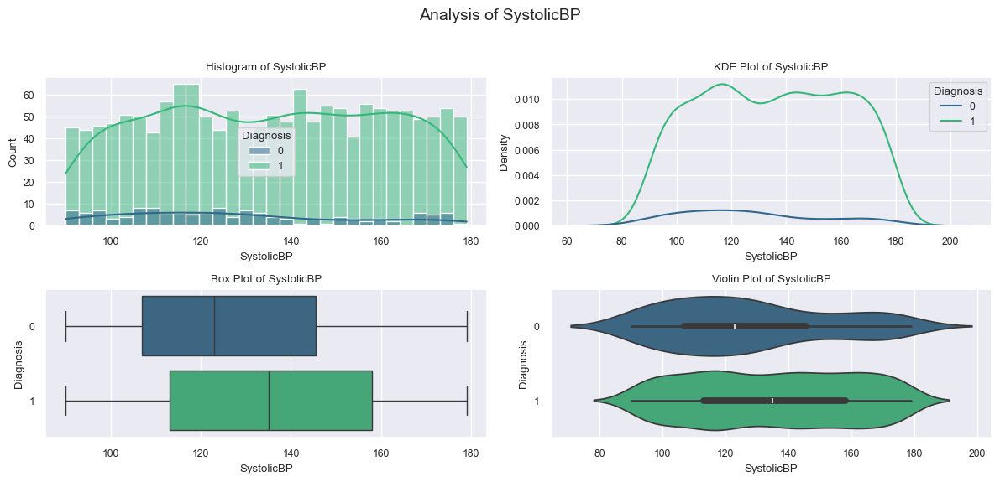

          SystolicBP
Mean         134.392
Median       134.000
Mode         116.000
Min           90.000
Max          179.000
Range         89.000
IQR           44.000
Skewness       0.031
Kurtosis      -1.195


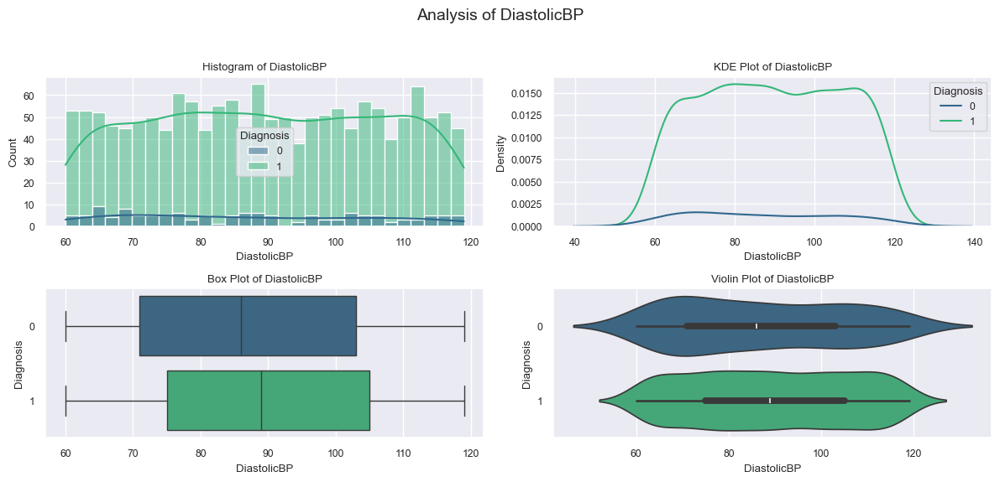

          DiastolicBP
Mean           89.313
Median         89.000
Mode           89.000
Min            60.000
Max           119.000
Range          59.000
IQR            29.000
Skewness        0.011
Kurtosis       -1.204


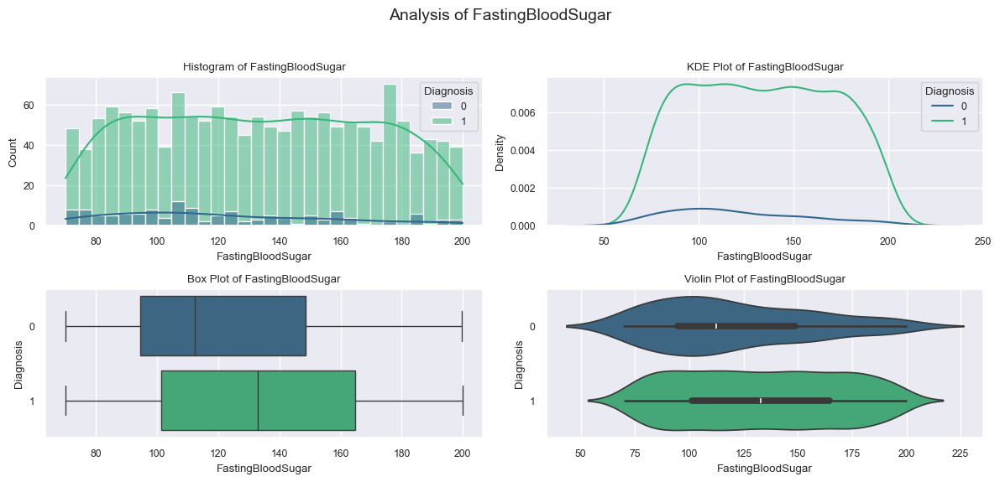

                                          FastingBloodSugar
Mean                                             132.529429
Median                                           131.478423
Mode      70.04476783799034, 70.16157422432828, 70.28259...
Min                                               70.044768
Max                                              199.960429
Range                                            129.915661
IQR                                               62.603648
Skewness                                           0.081009
Kurtosis                                          -1.165798


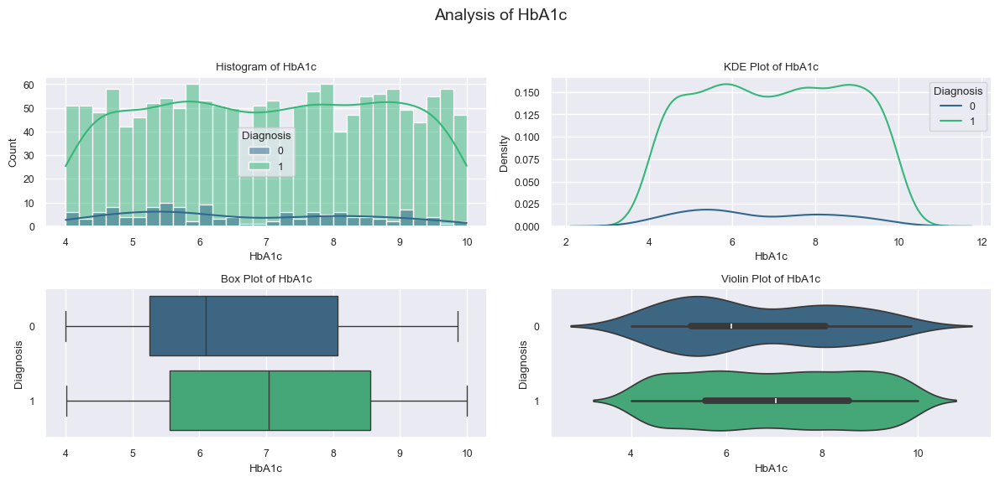

                                                      HbA1c
Mean                                               6.983682
Median                                             6.988001
Mode      4.000404985879447, 4.011772109865732, 4.012342...
Min                                                4.000405
Max                                                9.998393
Range                                              5.997988
IQR                                                3.028573
Skewness                                           0.009469
Kurtosis                                          -1.223625


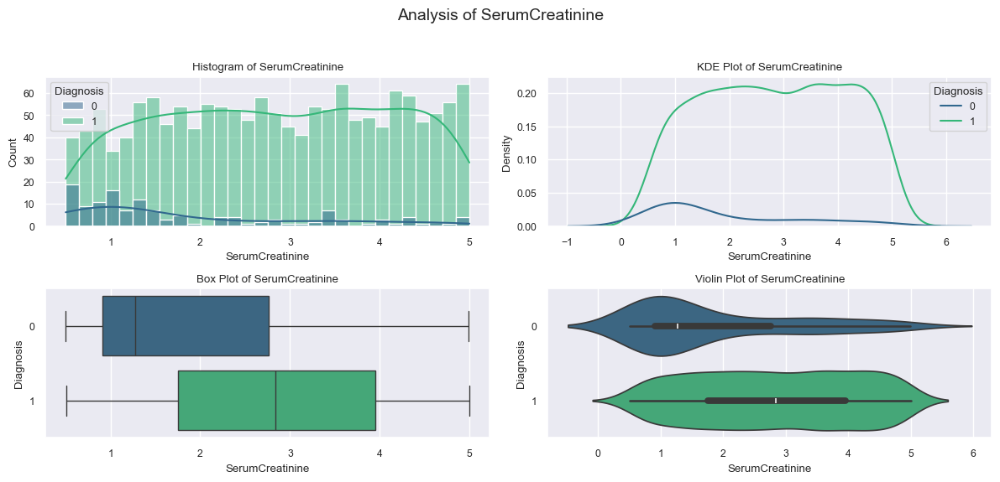

                                            SerumCreatinine
Mean                                               2.753198
Median                                             2.732006
Mode      0.5017986166519621, 0.5065924688113561, 0.5195...
Min                                                0.501799
Max                                                4.998637
Range                                              4.496839
IQR                                                2.306575
Skewness                                           0.010361
Kurtosis                                          -1.226538


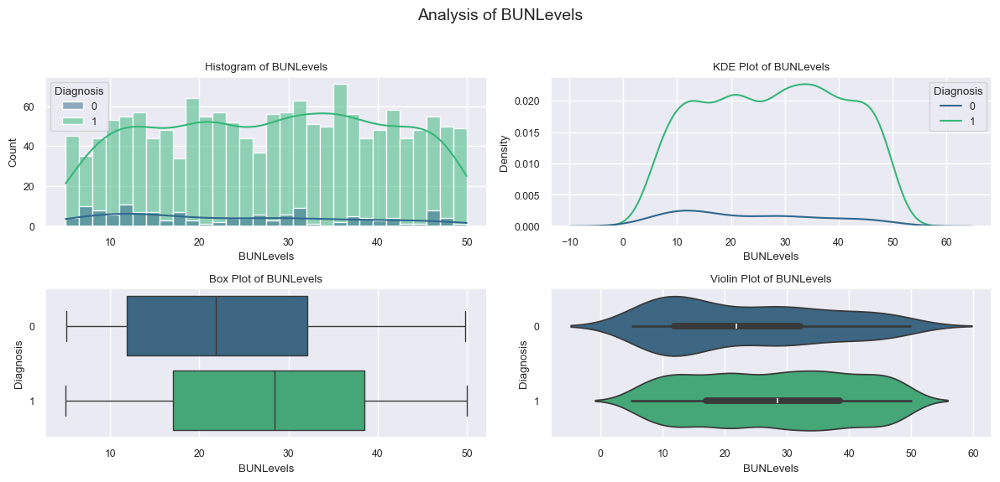

                                                  BUNLevels
Mean                                              27.578147
Median                                            28.077796
Mode      5.00024915040821, 5.004390630286709, 5.0366577...
Min                                                5.000249
Max                                               49.990522
Range                                             44.990273
IQR                                               21.729117
Skewness                                          -0.007497
Kurtosis                                          -1.182037


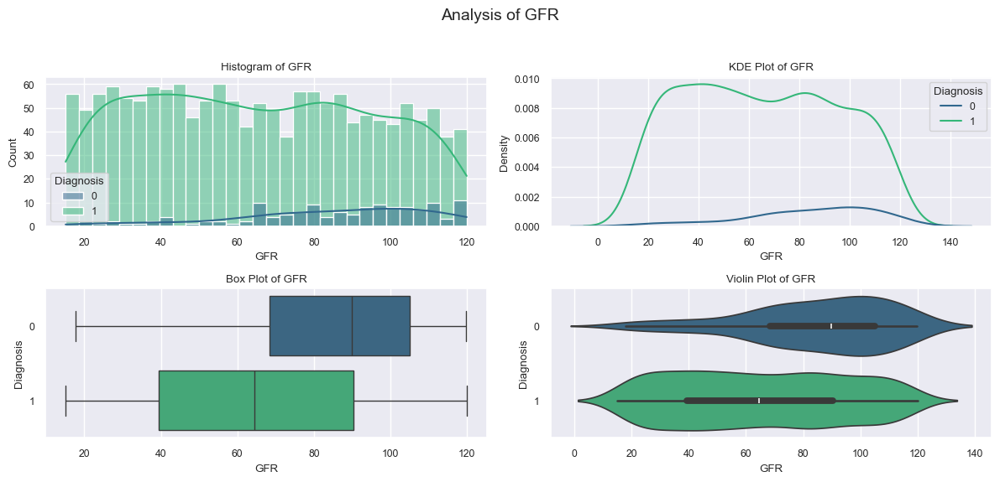

                                                        GFR
Mean                                              66.829202
Median                                            66.555207
Mode      15.107849554132432, 15.13126338944246, 15.1860...
Min                                                15.10785
Max                                              119.920261
Range                                            104.812411
IQR                                               51.238944
Skewness                                           0.015337
Kurtosis                                           -1.19226


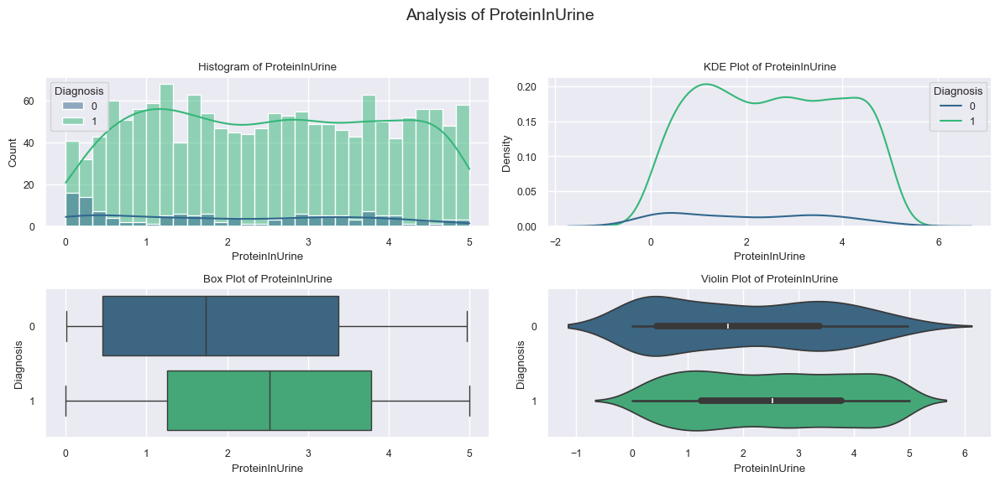

                                             ProteinInUrine
Mean                                               2.493736
Median                                              2.50526
Mode      0.0009001949198139, 0.0044086345406035, 0.0061...
Min                                                  0.0009
Max                                                4.996343
Range                                              4.995443
IQR                                                2.522361
Skewness                                           0.024299
Kurtosis                                          -1.217976


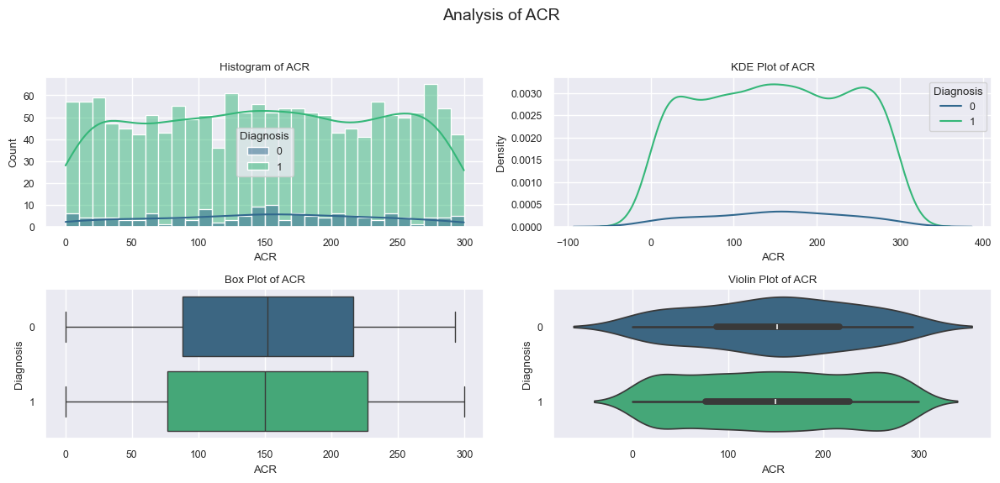

                                                        ACR
Mean                                             149.881615
Median                                           150.195312
Mode      0.1784274127972218, 0.2071423446147857, 0.4178...
Min                                                0.178427
Max                                              299.580019
Range                                            299.401592
IQR                                               148.27353
Skewness                                          -0.020966
Kurtosis                                          -1.180866


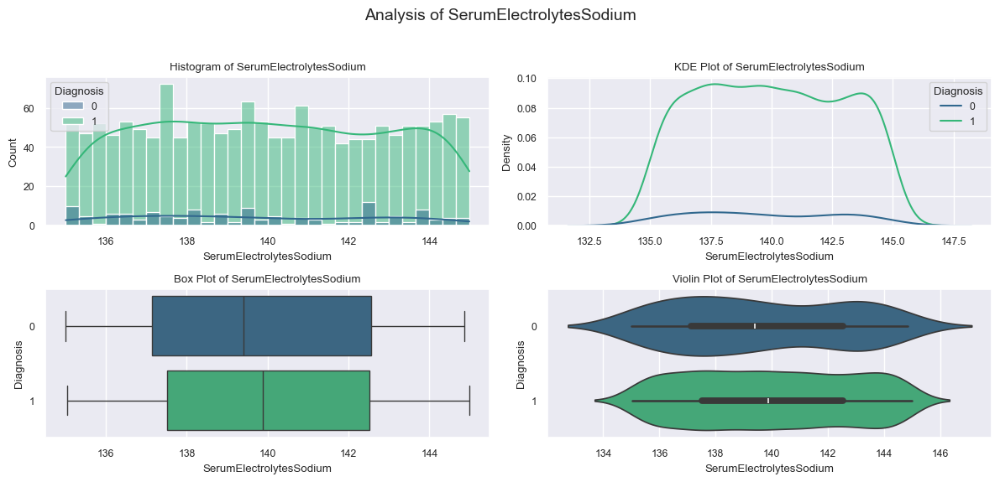

                                    SerumElectrolytesSodium
Mean                                             139.968984
Median                                           139.863171
Mode      135.00648869577225, 135.01295879911777, 135.01...
Min                                              135.006489
Max                                              144.987495
Range                                              9.981006
IQR                                                5.050897
Skewness                                           0.041241
Kurtosis                                           -1.20078


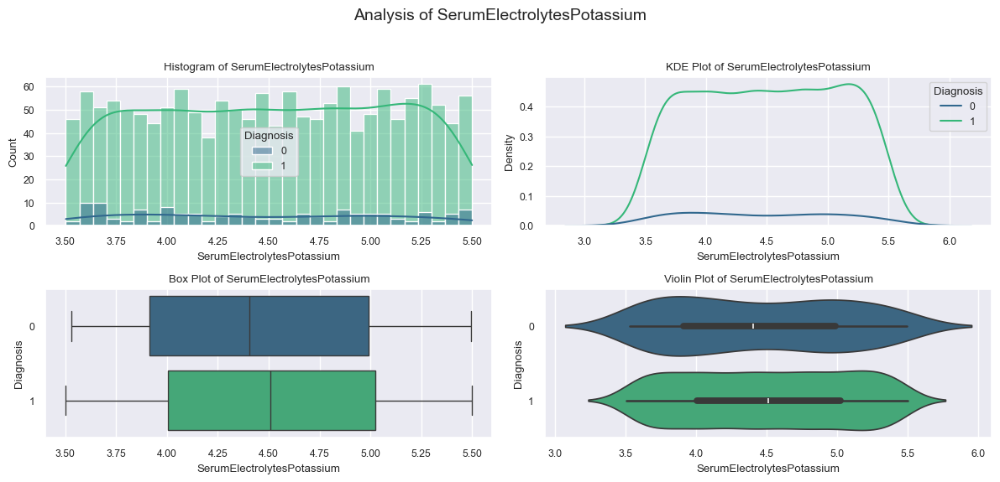

                                 SerumElectrolytesPotassium
Mean                                               4.505336
Median                                             4.505416
Mode      3.5034076560821124, 3.503688633836483, 3.50444...
Min                                                3.503408
Max                                                5.499781
Range                                              1.996373
IQR                                                1.029423
Skewness                                           -0.01108
Kurtosis                                          -1.227261


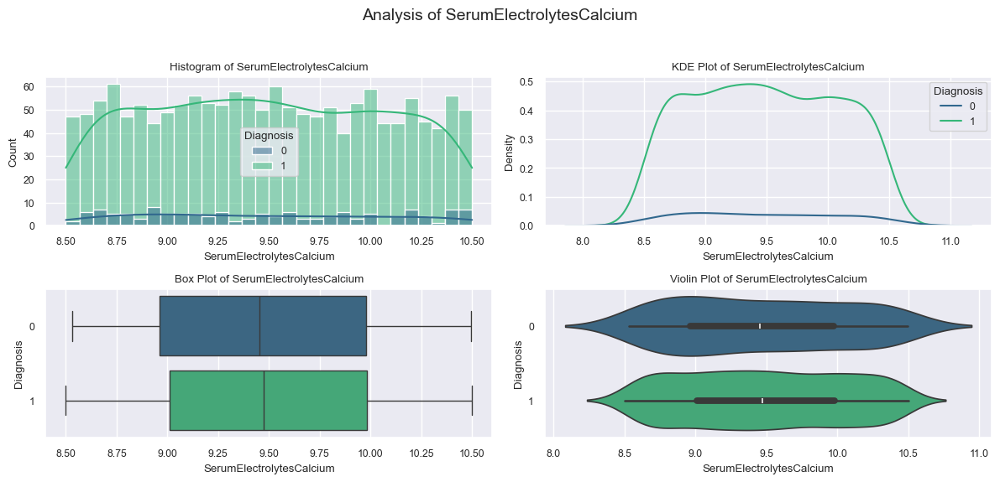

                                   SerumElectrolytesCalcium
Mean                                               9.489156
Median                                             9.470789
Mode      8.50003347251587, 8.500187187716545, 8.5012257...
Min                                                8.500033
Max                                               10.499944
Range                                              1.999911
IQR                                                0.979027
Skewness                                           0.045467
Kurtosis                                          -1.177052


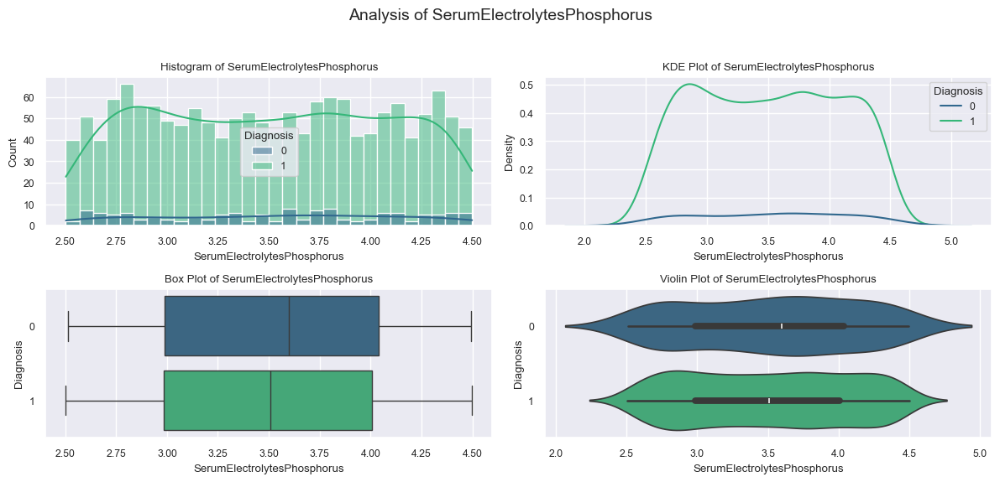

                                SerumElectrolytesPhosphorus
Mean                                               3.505543
Median                                             3.511712
Mode      2.503726770674727, 2.504104083041282, 2.509616...
Min                                                2.503727
Max                                                4.498314
Range                                              1.994587
IQR                                                1.024787
Skewness                                           0.004036
Kurtosis                                          -1.230375


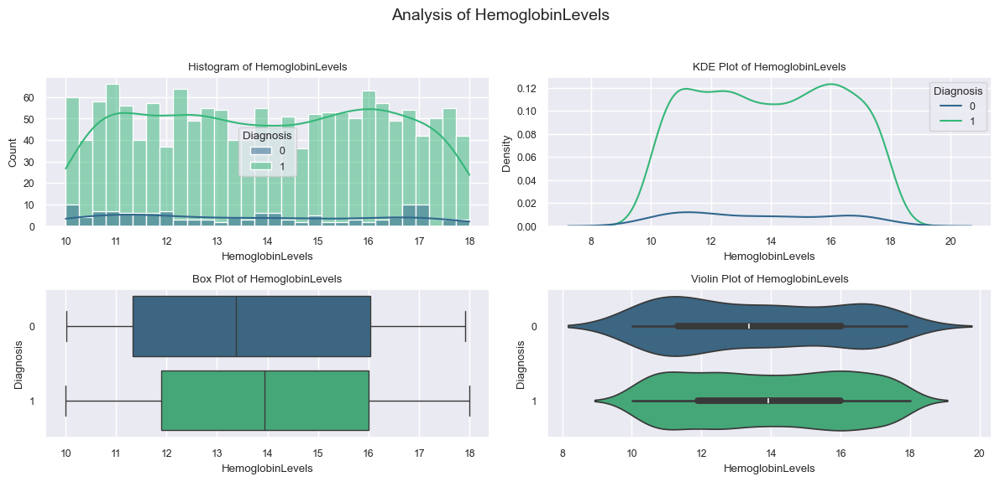

                                           HemoglobinLevels
Mean                                              13.927304
Median                                            13.909388
Mode      10.004222749486658, 10.014562287634888, 10.019...
Min                                               10.004223
Max                                               17.999656
Range                                              7.995433
IQR                                                4.172606
Skewness                                           0.015501
Kurtosis                                           -1.25769


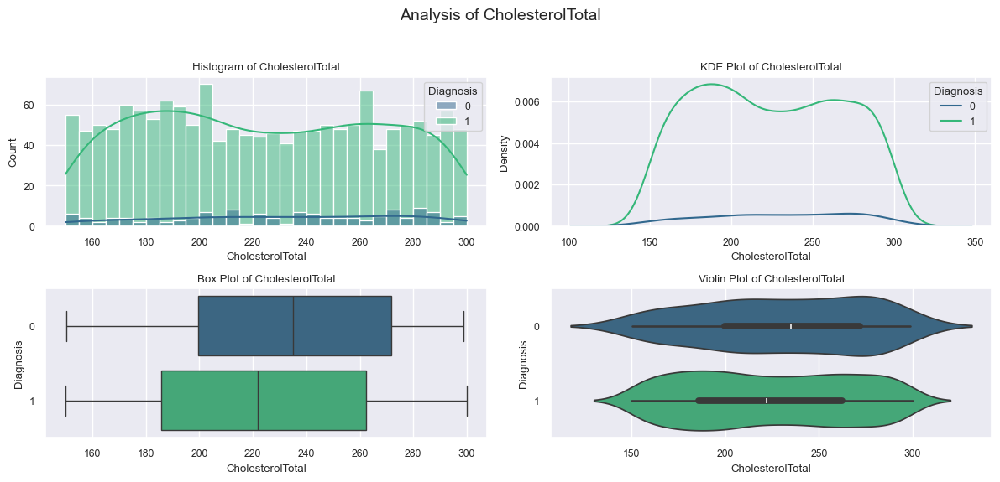

                                           CholesterolTotal
Mean                                             224.251158
Median                                           223.202106
Mode      150.01570661972153, 150.04665187932014, 150.07...
Min                                              150.015707
Max                                              299.950846
Range                                            149.935139
IQR                                               76.240945
Skewness                                            0.03822
Kurtosis                                          -1.231411


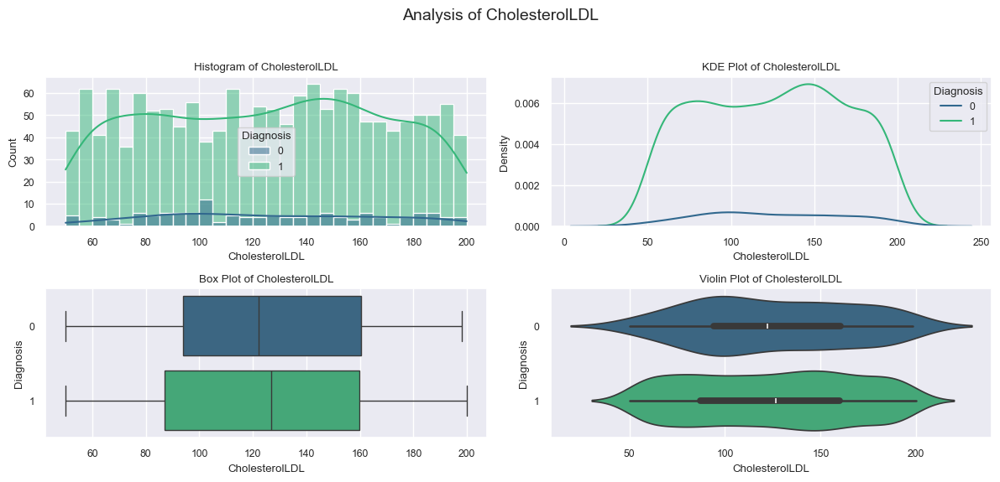

                                             CholesterolLDL
Mean                                             125.044597
Median                                            126.53752
Mode      50.07459725796847, 50.11164723336216, 50.22249...
Min                                               50.074597
Max                                              199.909911
Range                                            149.835314
IQR                                                72.22695
Skewness                                          -0.019932
Kurtosis                                          -1.165706


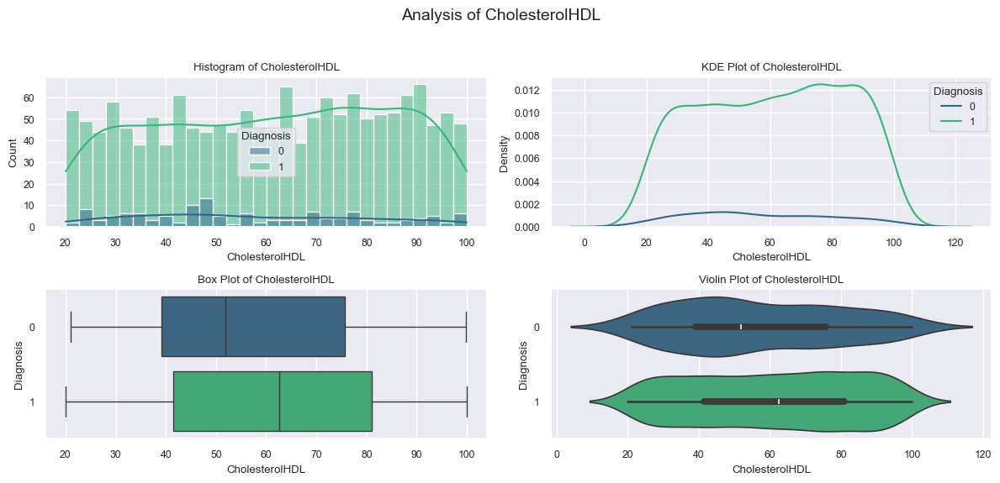

                                             CholesterolHDL
Mean                                              60.746861
Median                                            61.845056
Mode      20.03099303763556, 20.045920933400172, 20.0497...
Min                                               20.030993
Max                                               99.987304
Range                                             79.956311
IQR                                               39.136121
Skewness                                          -0.066157
Kurtosis                                          -1.207319


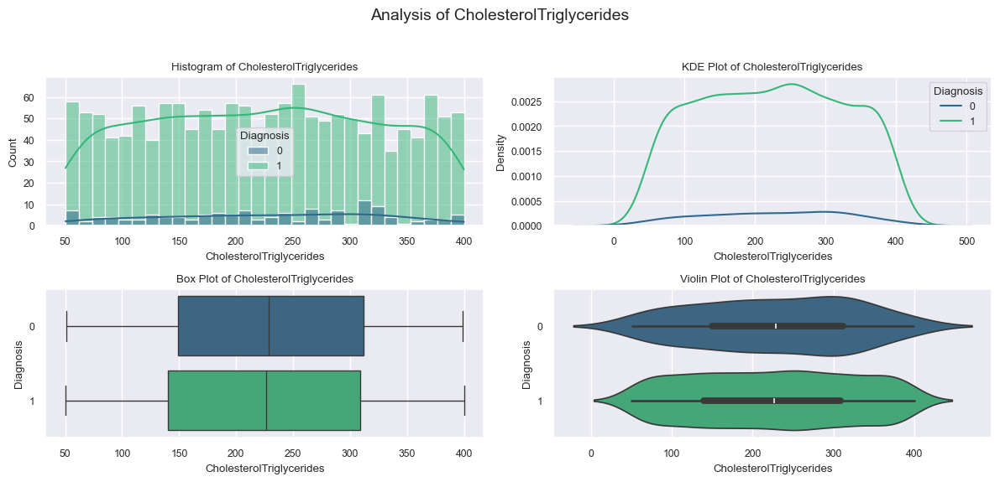

                                   CholesterolTriglycerides
Mean                                             224.804603
Median                                           226.466365
Mode      50.26766821287434, 50.3947922180174, 50.531912...
Min                                               50.267668
Max                                              399.919138
Range                                            349.651469
IQR                                              169.547281
Skewness                                           -0.00782
Kurtosis                                           -1.14457


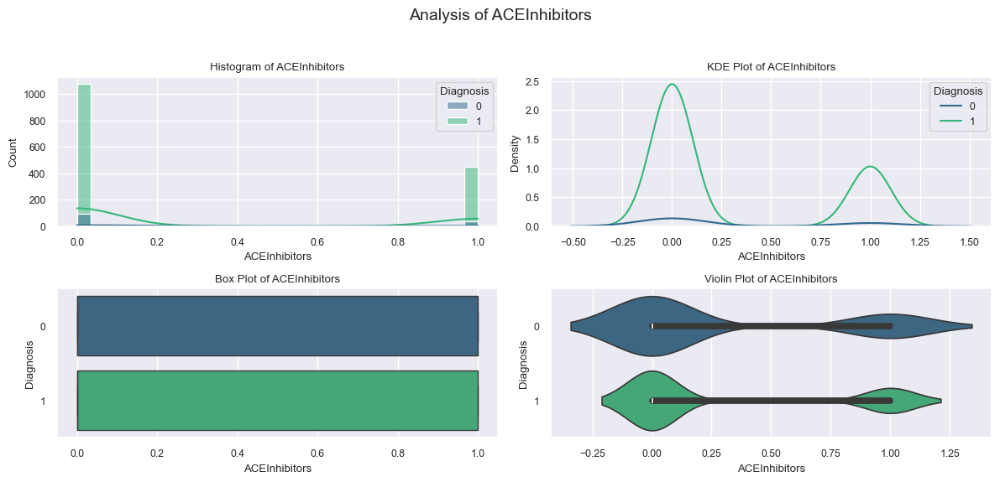

          ACEInhibitors
Mean              0.295
Median            0.000
Mode              0.000
Min               0.000
Max               1.000
Range             1.000
IQR               1.000
Skewness          0.898
Kurtosis         -1.195


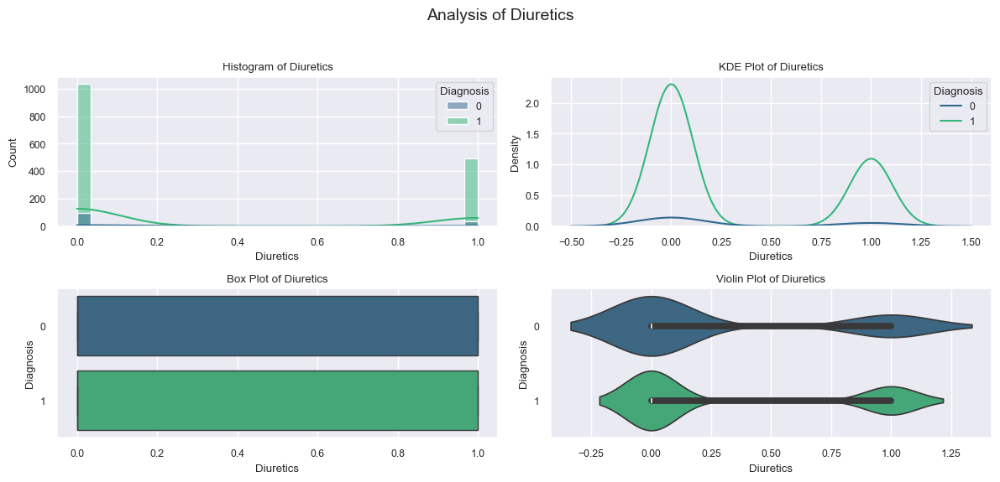

          Diuretics
Mean          0.318
Median        0.000
Mode          0.000
Min           0.000
Max           1.000
Range         1.000
IQR           1.000
Skewness      0.781
Kurtosis     -1.392


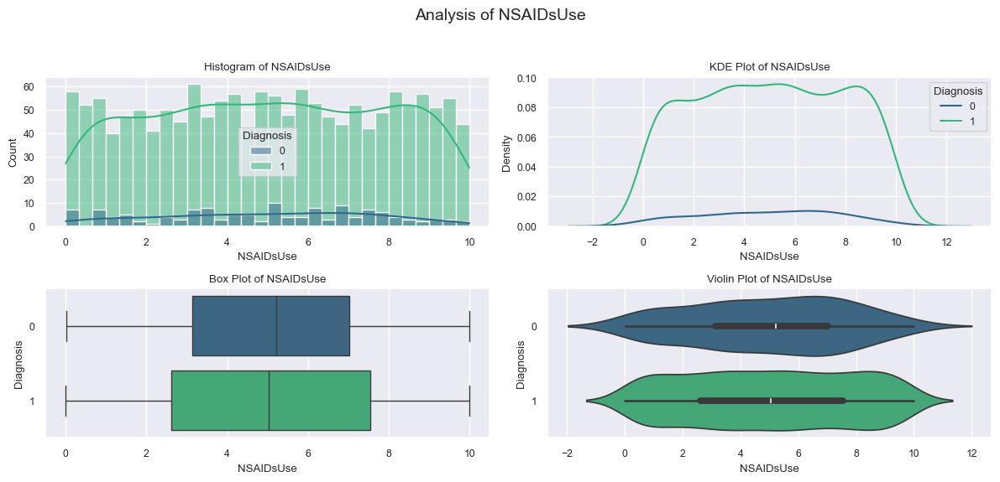

                                                  NSAIDsUse
Mean                                               5.011715
Median                                             5.078511
Mode      0.000468697916065, 0.0032323168081394, 0.01021...
Min                                                0.000469
Max                                                9.999397
Range                                              9.998928
IQR                                                 4.86609
Skewness                                          -0.029802
Kurtosis                                             -1.166


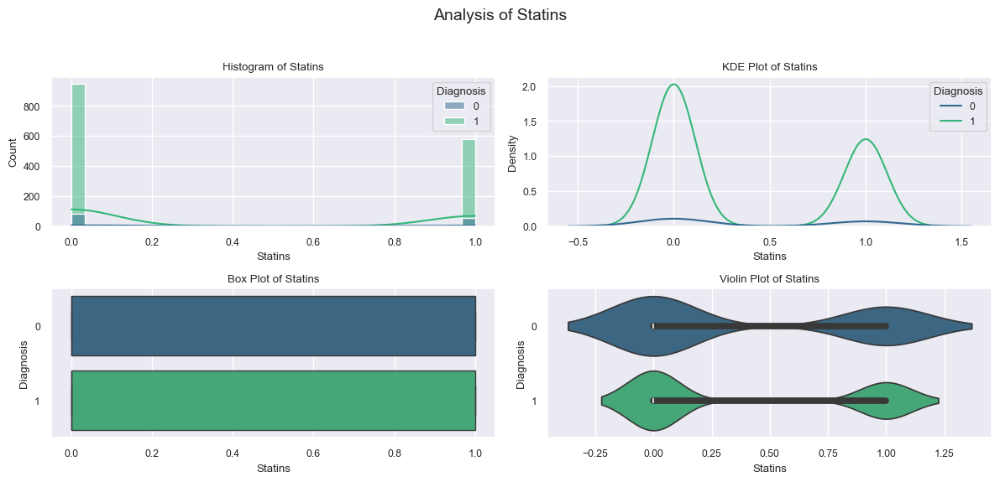

          Statins
Mean        0.381
Median      0.000
Mode        0.000
Min         0.000
Max         1.000
Range       1.000
IQR         1.000
Skewness    0.491
Kurtosis   -1.761


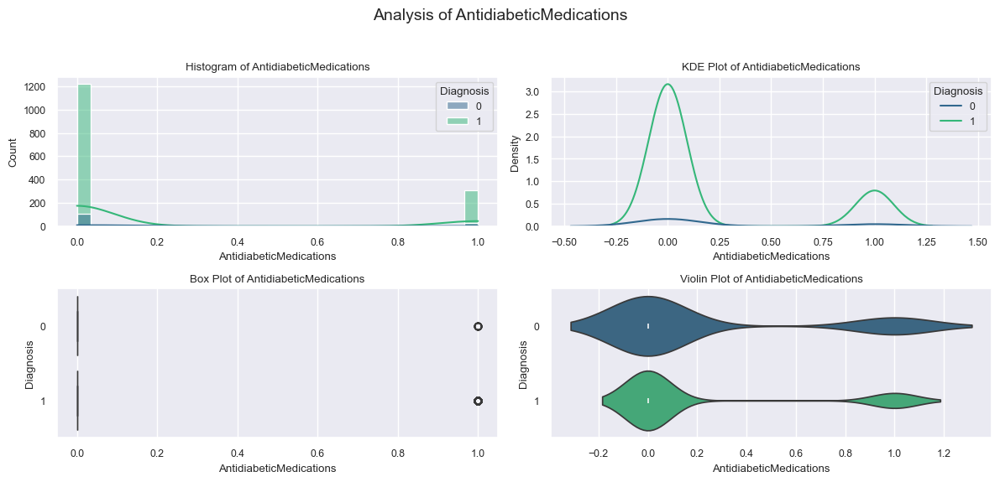

          AntidiabeticMedications
Mean                        0.203
Median                      0.000
Mode                        0.000
Min                         0.000
Max                         1.000
Range                       1.000
IQR                         0.000
Skewness                    1.482
Kurtosis                    0.196


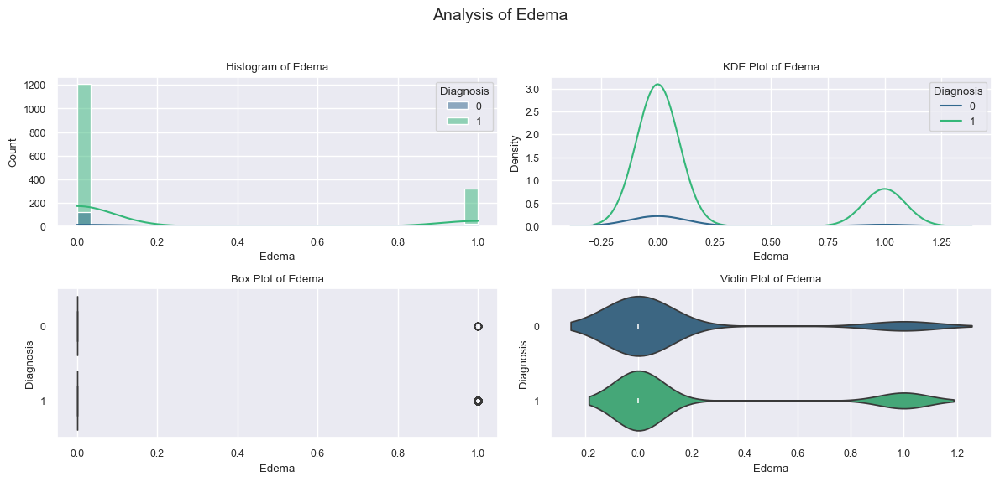

          Edema
Mean      0.202
Median    0.000
Mode      0.000
Min       0.000
Max       1.000
Range     1.000
IQR       0.000
Skewness  1.486
Kurtosis  0.210


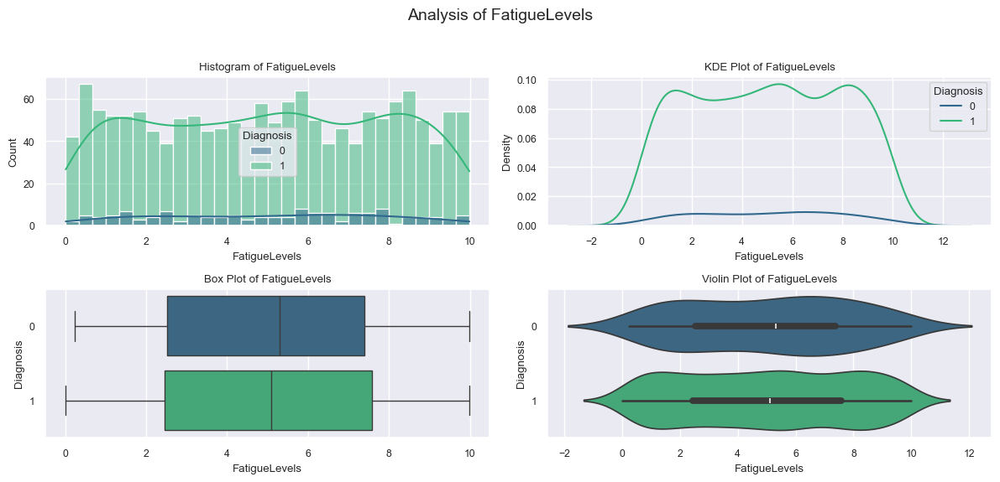

                                              FatigueLevels
Mean                                               5.016697
Median                                             5.117247
Mode      0.0151942211098266, 0.0195171333762766, 0.0353...
Min                                                0.015194
Max                                                9.988238
Range                                              9.973044
IQR                                                5.101297
Skewness                                          -0.017468
Kurtosis                                          -1.209458


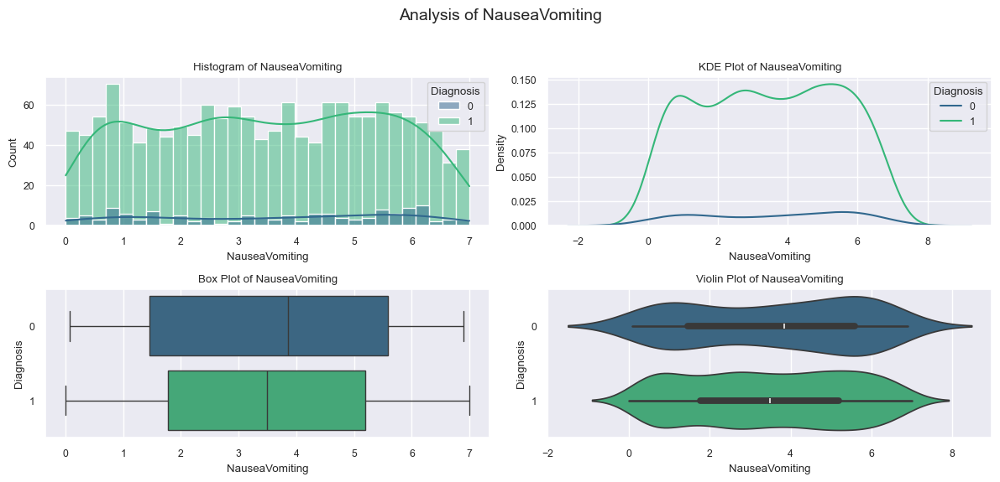

                                             NauseaVomiting
Mean                                               3.482121
Median                                             3.519894
Mode      0.0051709386681718, 0.0067099184359293, 0.0134...
Min                                                0.005171
Max                                                6.997332
Range                                              6.992161
IQR                                                3.502495
Skewness                                          -0.043126
Kurtosis                                          -1.212871


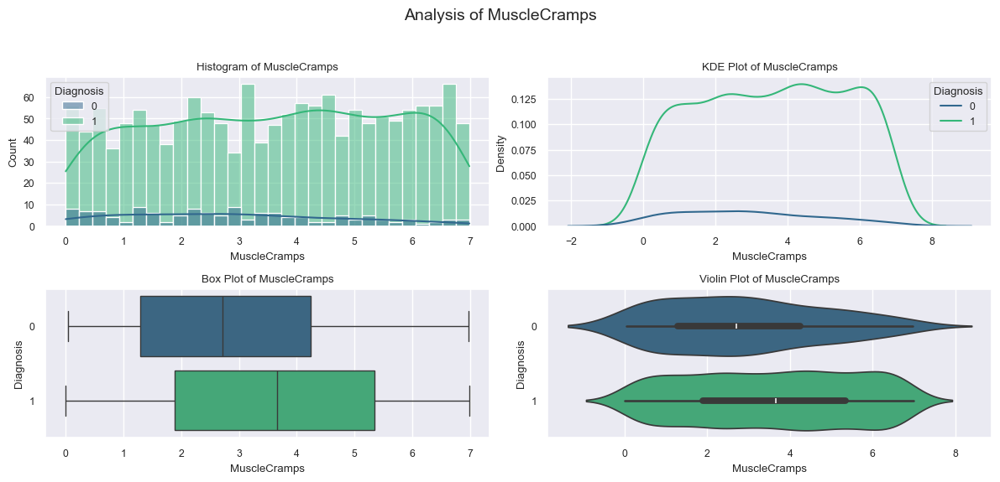

                                               MuscleCramps
Mean                                                3.52551
Median                                             3.572522
Mode      0.006327066303189, 0.0083924711721895, 0.01255...
Min                                                0.006327
Max                                                6.984636
Range                                              6.978309
IQR                                                3.434163
Skewness                                           -0.02892
Kurtosis                                          -1.187772


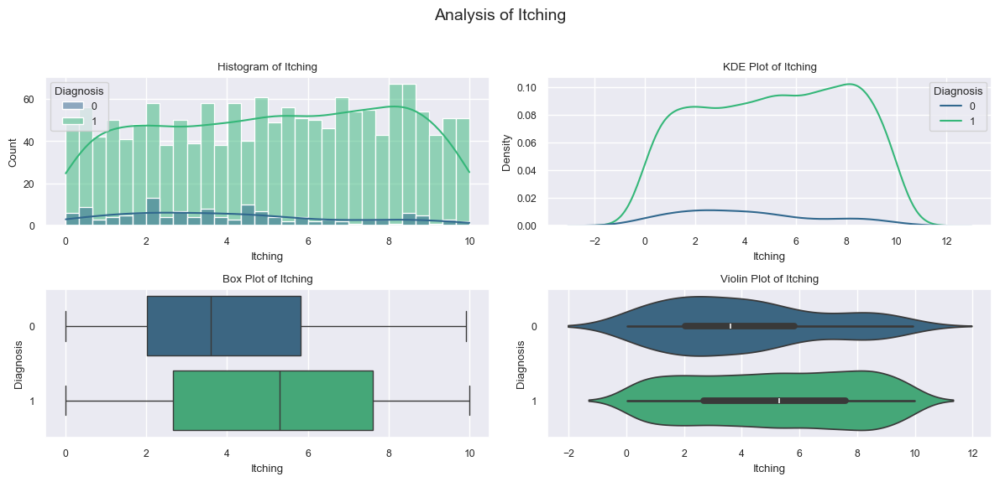

                                                    Itching
Mean                                               5.054869
Median                                             5.087086
Mode      0.0136967111948138, 0.0155312872446444, 0.0171...
Min                                                0.013697
Max                                                9.998313
Range                                              9.984616
IQR                                                5.019226
Skewness                                          -0.043011
Kurtosis                                          -1.197655


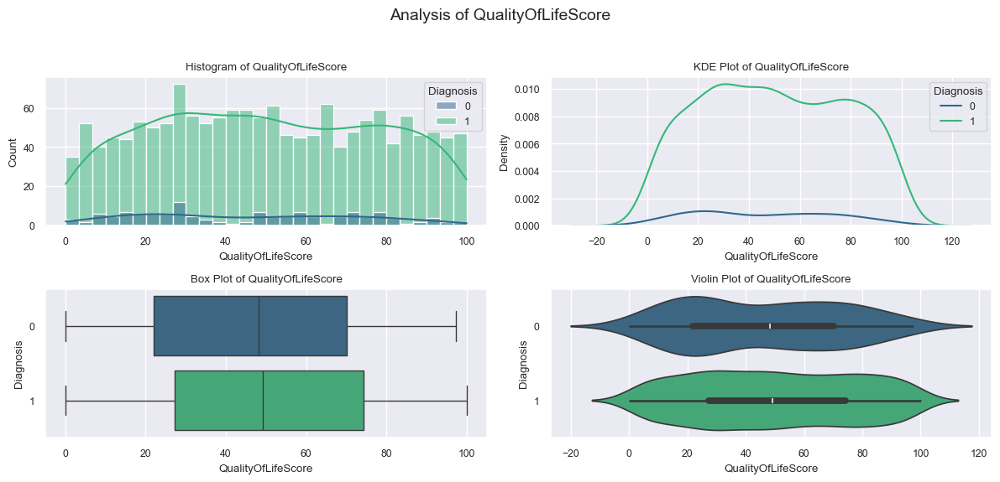

                                         QualityOfLifeScore
Mean                                              49.730659
Median                                            48.970075
Mode      0.0872557812590324, 0.1108026230465131, 0.2156...
Min                                                0.087256
Max                                                99.98751
Range                                             99.900254
IQR                                               46.922289
Skewness                                           0.050531
Kurtosis                                          -1.146588


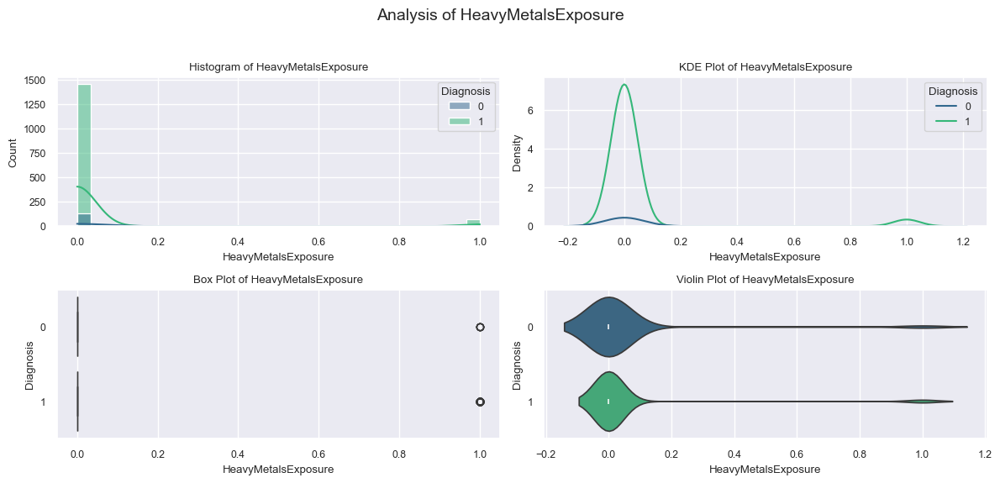

          HeavyMetalsExposure
Mean                    0.044
Median                  0.000
Mode                    0.000
Min                     0.000
Max                     1.000
Range                   1.000
IQR                     0.000
Skewness                4.451
Kurtosis               17.829


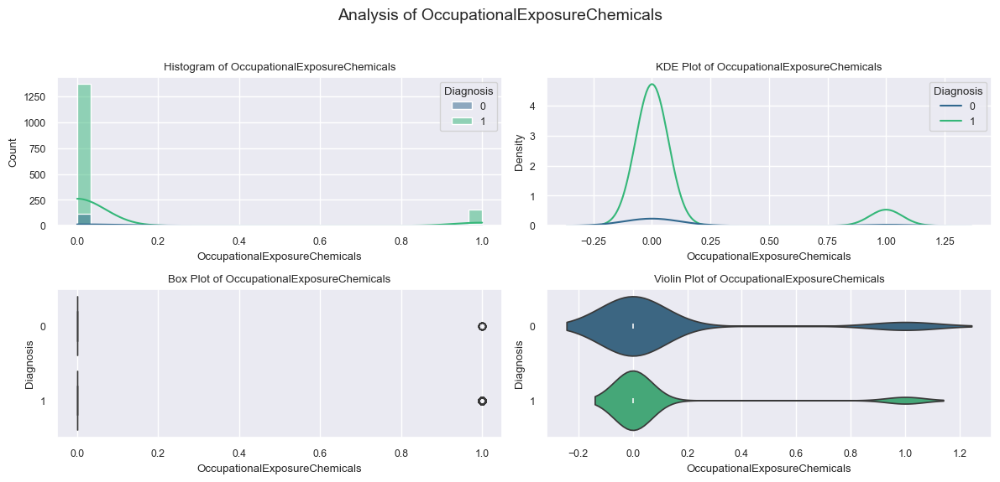

          OccupationalExposureChemicals
Mean                              0.103
Median                            0.000
Mode                              0.000
Min                               0.000
Max                               1.000
Range                             1.000
IQR                               0.000
Skewness                          2.613
Kurtosis                          4.835


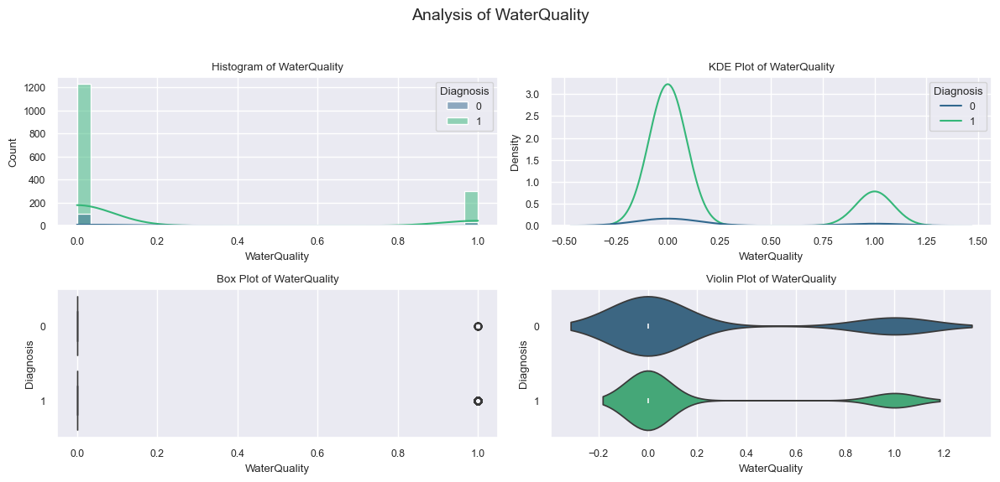

          WaterQuality
Mean             0.197
Median           0.000
Mode             0.000
Min              0.000
Max              1.000
Range            1.000
IQR              0.000
Skewness         1.524
Kurtosis         0.323


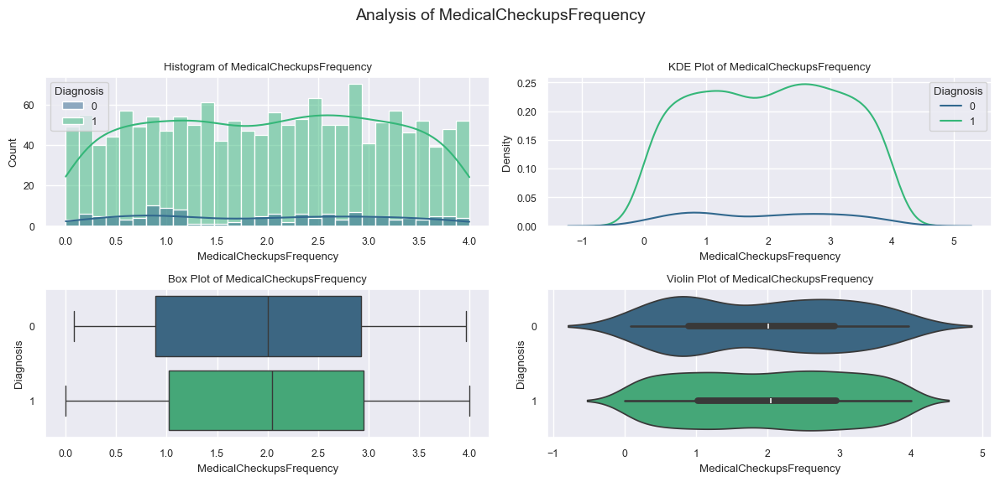

                                   MedicalCheckupsFrequency
Mean                                               2.000336
Median                                             2.040635
Mode      0.0010823017559191, 0.0015406029895426, 0.0038...
Min                                                0.001082
Max                                                3.999469
Range                                              3.998387
IQR                                                1.941411
Skewness                                          -0.009291
Kurtosis                                          -1.185346


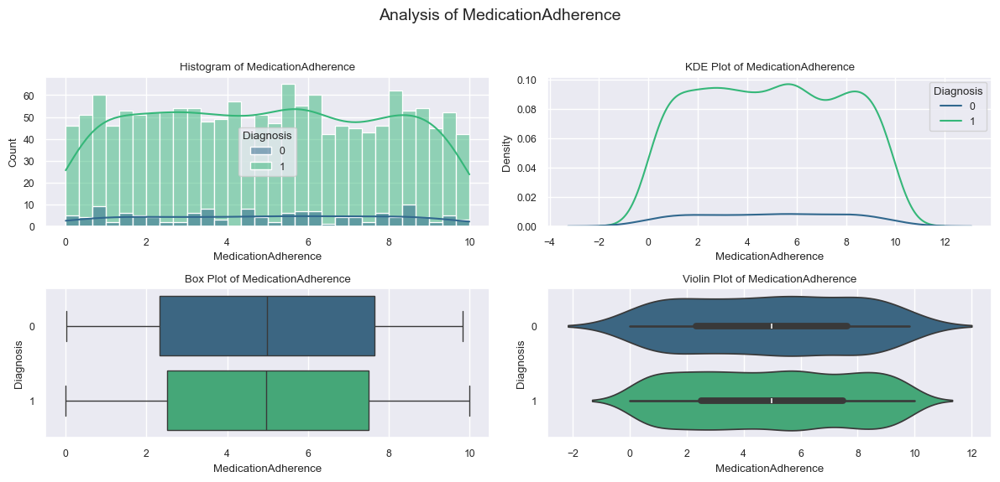

                                        MedicationAdherence
Mean                                               4.947788
Median                                             4.974069
Mode      0.005392141828836, 0.0067782991413989, 0.01318...
Min                                                0.005392
Max                                                9.992345
Range                                              9.986953
IQR                                                5.001664
Skewness                                           0.013389
Kurtosis                                           -1.19615


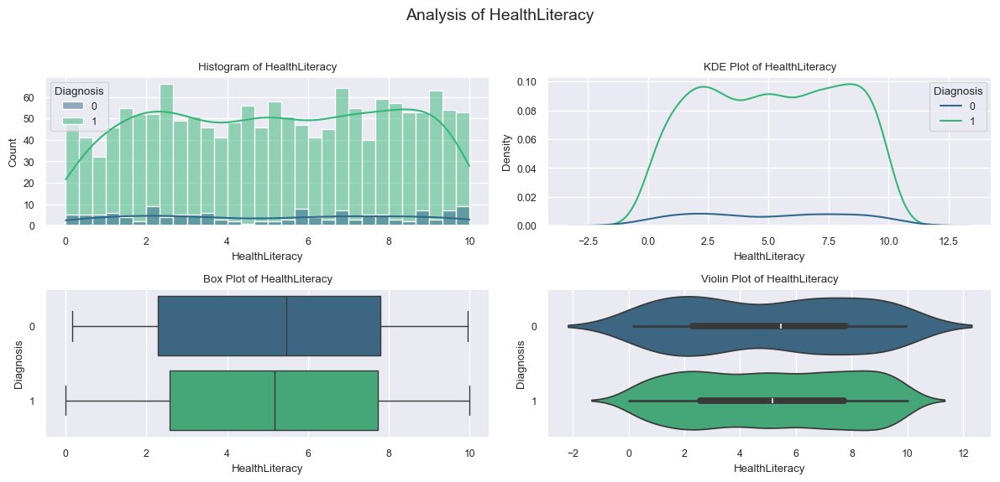

                                             HealthLiteracy
Mean                                               5.144973
Median                                             5.182949
Mode      0.0044361610333021, 0.0097231286498467, 0.0300...
Min                                                0.004436
Max                                                9.993754
Range                                              9.989317
IQR                                                5.163692
Skewness                                          -0.035045
Kurtosis                                           -1.23727


/var/folders/z_/3w4wn_0x6c36h1pzzf2nkpj40000gn/T/ipykernel_56404/1131954109.py:24: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=data, x=feature, hue=hue, ax=axes[0, 1], **color_args)


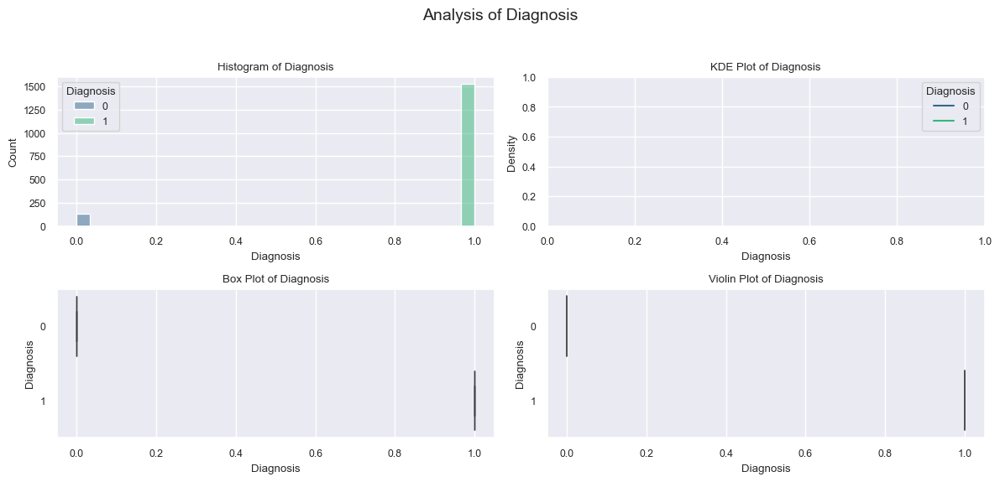

          Diagnosis
Mean          0.919
Median        1.000
Mode          1.000
Min           0.000
Max           1.000
Range         1.000
IQR           0.000
Skewness     -3.065
Kurtosis      7.403


In [175]:
for col in df_3c.columns:
    plot_numeric(df_3c, col, hue = target_col)

### Categorical Analysis

### Profile

In [176]:
profile = ProfileReport(
    df_3c,
    html    = {'style': {'primary_color': 'firebrick'}},
    minimal = False,
    plot    = {"dpi": 100, "image_format": "svg", "tight_layout": True},
)
# profile

# 4. Storytelling With Data plot

Reproduce any graph of your choice in p. 86-98 of the Storytelling With Data book as best you can.  (The second half of chapter three).  You do not have to get the exact data values right, just the overall look and feel.

<font color = 'plum'> From Storytelling with Data, page 97, Figure 3.23

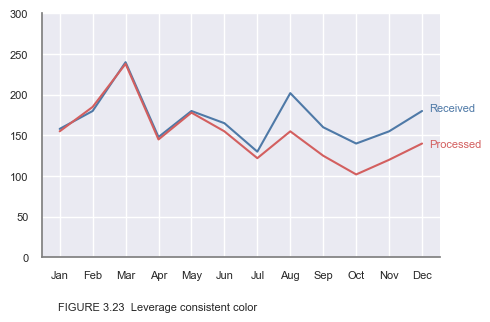

In [177]:
import matplotlib.pyplot as plt
import numpy as np

# Data extracted from the chart
months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
received = [158, 180, 240, 148, 180, 165, 130, 202, 160, 140, 155, 180]
processed = [155, 185, 238, 145, 178, 155, 122, 155, 125, 102, 120, 140]

fig, ax = plt.subplots(figsize = (5, 3))

ax.plot(months, received, color='#4E79A7', linewidth = 1.5)
ax.plot(months, processed, color='#D35F5F', linewidth = 1.5)

# Set axis limits and ticks
ax.set_ylim(0, 300)
ax.set_yticks(np.arange(0, 301, 50))
ax.tick_params(axis='both', which='major', labelsize=8)

# Remove top and right borders
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_color('gray')
ax.spines['bottom'].set_color('gray')

# Add text labels with colors matching the lines
plt.text(11.2, 180, 'Received', color='#4E79A7', fontsize = 8)
plt.text(11.2, 135, 'Processed', color='#D35F5F', fontsize = 8)


fig.text(0.125, -0.05, 'FIGURE 3.23  Leverage consistent color', fontsize=8, ha='left')
plt.tight_layout()
plt.show()